In [ ]:
!pip install scikit-learn==1.2.2

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.6/9.6 MB 29.7 MB/s eta 0:00:00
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.6.0
    Uninstalling scikit-learn-1.6.0:
      Successfully uninstalled scikit-learn-1.6.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
imbalanced-learn 0.13.0 requires scikit-learn<2,>=1.3.2, but you have scikit-learn 1.2.2 which is incompatible.
mlxtend 0.23.3 requires scikit-learn>=1.3.1, but you have scikit-learn 1.2.2 which is incompatible.


In [ ]:
# libraries
#%matplotlib notebook
import os
import pandas as pd
import numpy as np
import json
from scipy.signal import periodogram
from sklearn.metrics import confusion_matrix, average_precision_score
import matplotlib
import seaborn
import matplotlib.dates as md
from matplotlib import pyplot as plt
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
dfsA1 = {}

# Loop through the range 1 to 67 (inclusive) and load data
for i in range(1, 68):
    file_path = f"/content/drive/My Drive/YAHOO/A1/Yahoo_A1real_{i}_data.out"
    dfsA1[i] = pd.read_csv(file_path, sep=",", names=[f"value_{i}", "label"])

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler

# Perform feature engineering
def feature_engineering(df, value_col, window_size):
    df = df.copy()

    # Ensure the index is datetime
    if not isinstance(df.index, pd.DatetimeIndex):
        df.index = pd.date_range(start='2023-01-01', periods=len(df), freq='H')

    # Rolling statistics
    df[f'rolling_mean_{window_size}'] = df[value_col].rolling(window=window_size).mean()
    df[f'rolling_std_{window_size}'] = df[value_col].rolling(window=window_size).std()
    df[f'rolling_min_{window_size}'] = df[value_col].rolling(window=window_size).min()
    df[f'rolling_max_{window_size}'] = df[value_col].rolling(window=window_size).max()

    # Time-based features
#    df['hour'] = df.index.hour
#    df['day_of_week'] = df.index.dayofweek
#    df['day_of_month'] = df.index.day
#   df['month'] = df.index.month
#    df['Lag'] = df[value_col].shift(24)

    for lag in range(1, 4):
        df[f"lag_{lag}"] = df[value_col].shift(lag)
    df = df.dropna()

    # Sinusoidal encoding for seasonality
    df['sin_day'] = np.sin(2 * np.pi * df.index.dayofyear / 24)
    df['cos_day'] = np.cos(2 * np.pi * df.index.dayofyear / 24)

    # Drop rows with NaN due to rolling statistics
    df.dropna(inplace=True)
    return df

## A1A

<ipython-input-4-4ae58c95129c>:11: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df.index = pd.date_range(start='2023-01-01', periods=len(df), freq='H')


Feature Importances:
lag_1: 0.2073
rolling_max_24: 0.1480
lag_3: 0.1443
rolling_std_24: 0.1314
lag_2: 0.1053
rolling_min_24: 0.0972
rolling_mean_24: 0.0803
sin_day: 0.0439
cos_day: 0.0422


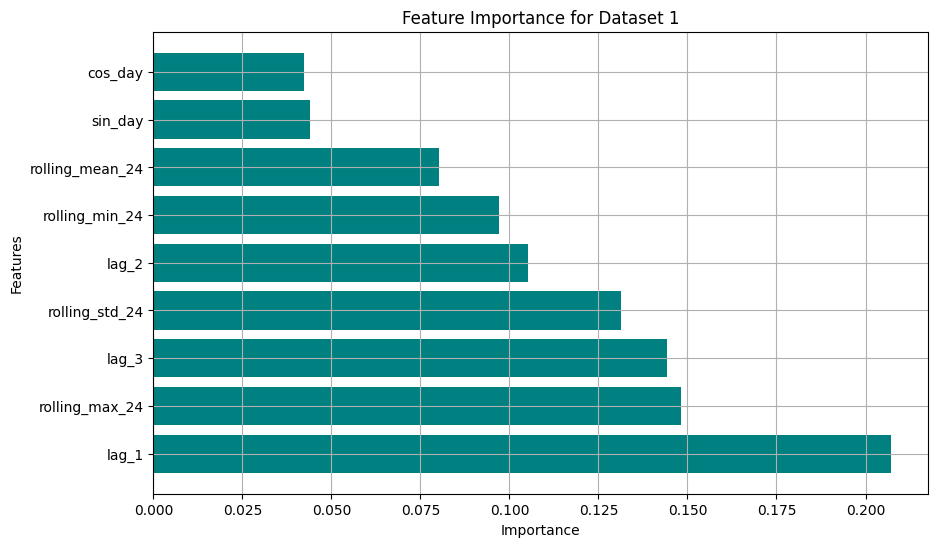

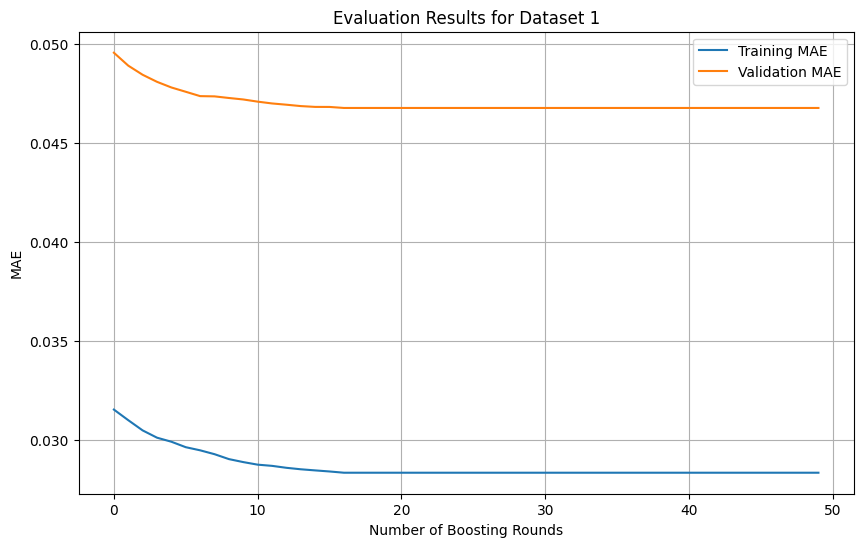

Dataset 1:
 Best Hyperparameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0.5, 'reg_lambda': 1}
 Best k: 3
 Test Set MAE: 0.0468
 Precision: 0.1000, Recall: 1.0000, F1: 0.1818
--------------------------------------------------


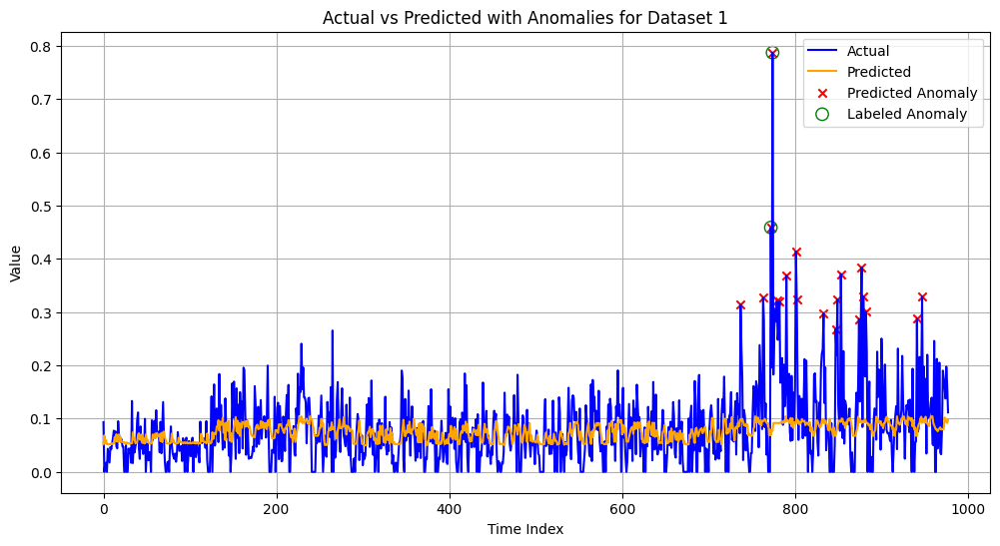

Dataset 1:
 Best Hyperparameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0.5, 'reg_lambda': 1}
 Best k: 3
 Test Set MAE: 0.0468
 Precision: 0.0769, Recall: 1.0000, F1: 0.1429
--------------------------------------------------


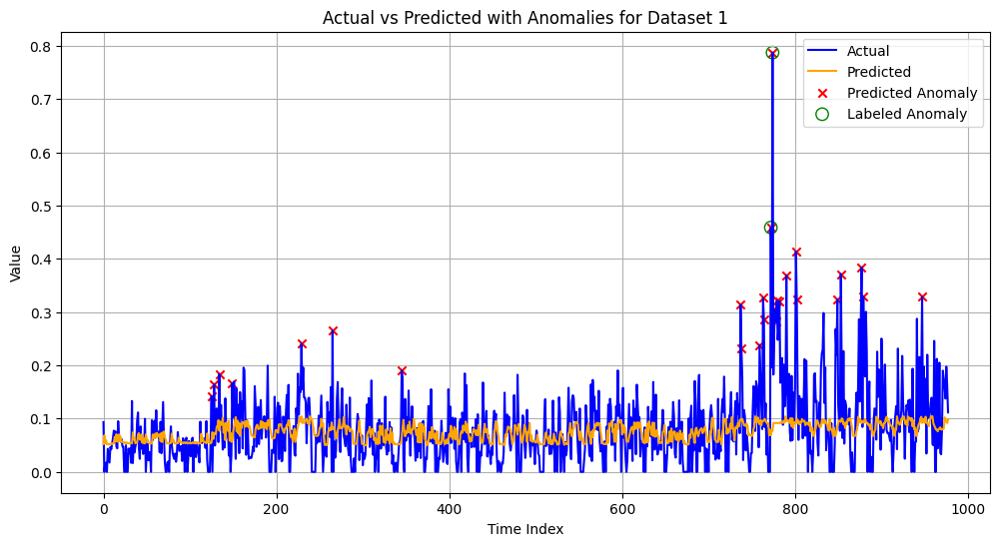

<ipython-input-4-4ae58c95129c>:11: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df.index = pd.date_range(start='2023-01-01', periods=len(df), freq='H')


Feature Importances:
rolling_min_24: 0.8924
lag_1: 0.0634
lag_2: 0.0091
rolling_mean_24: 0.0073
sin_day: 0.0073
rolling_max_24: 0.0059
rolling_std_24: 0.0057
lag_3: 0.0045
cos_day: 0.0044


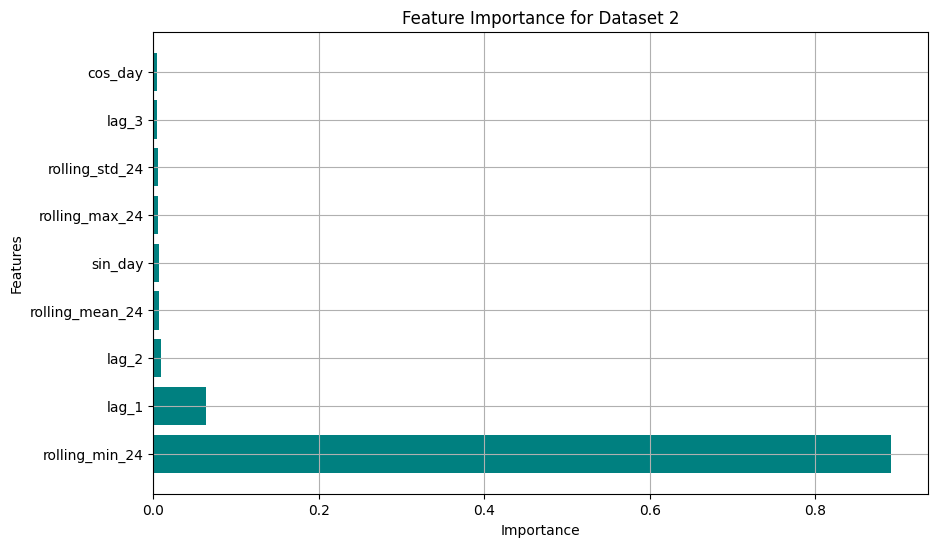

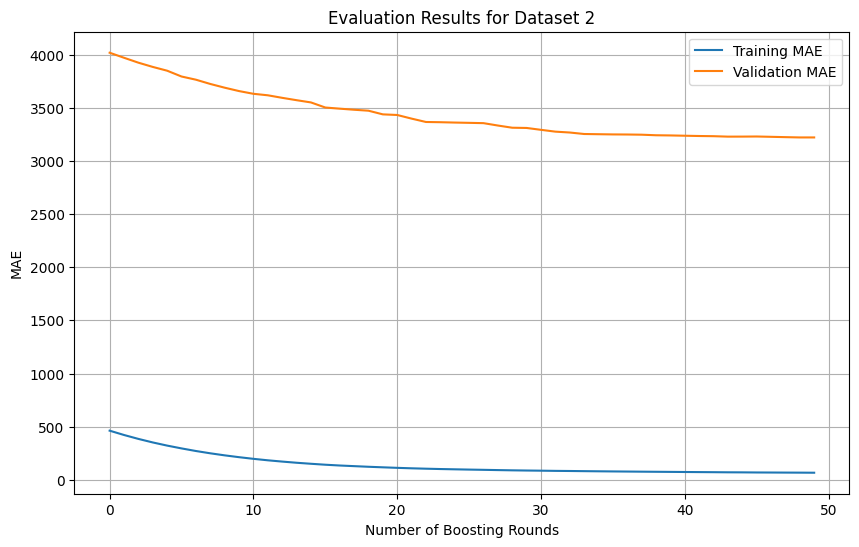

Dataset 2:
 Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 50, 'reg_alpha': 0.1, 'reg_lambda': 2}
 Best k: 1.5
 Test Set MAE: 3220.3456
 Precision: 1.0000, Recall: 0.7500, F1: 0.8571
--------------------------------------------------


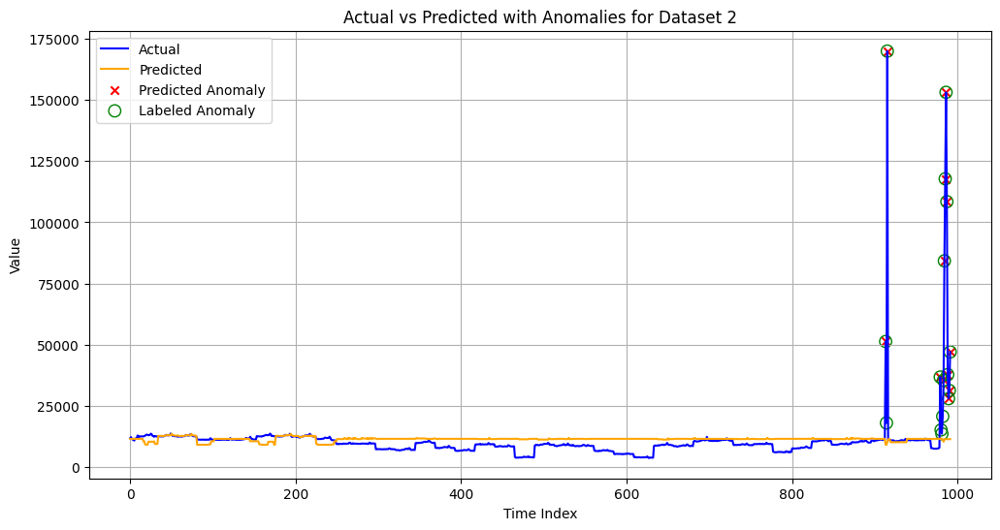

Dataset 2:
 Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 50, 'reg_alpha': 0.1, 'reg_lambda': 2}
 Best k: 3
 Test Set MAE: 3220.3456
 Precision: 0.3750, Recall: 0.3750, F1: 0.3750
--------------------------------------------------


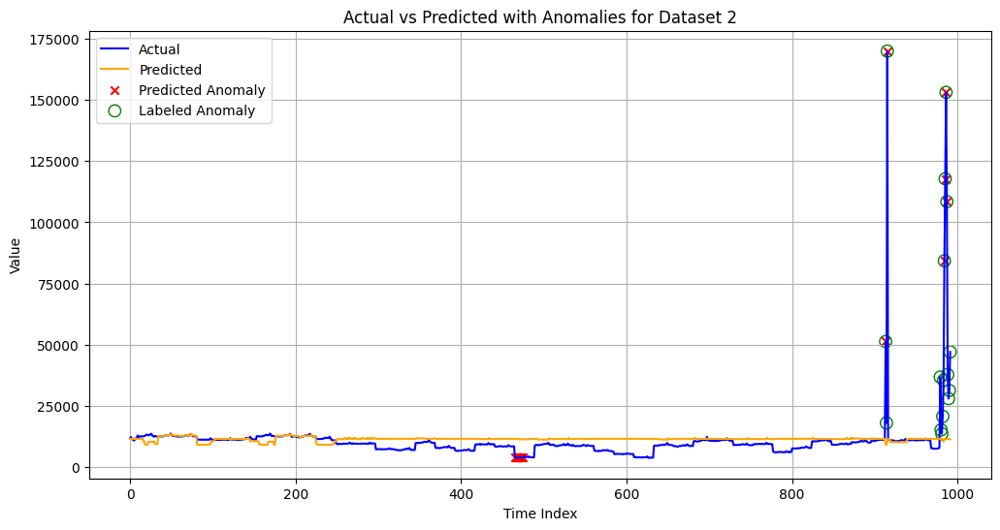

<ipython-input-4-4ae58c95129c>:11: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df.index = pd.date_range(start='2023-01-01', periods=len(df), freq='H')


Feature Importances:
lag_1: 0.8535
lag_3: 0.0604
rolling_std_24: 0.0380
lag_2: 0.0212
rolling_mean_24: 0.0097
rolling_max_24: 0.0056
cos_day: 0.0049
rolling_min_24: 0.0038
sin_day: 0.0028


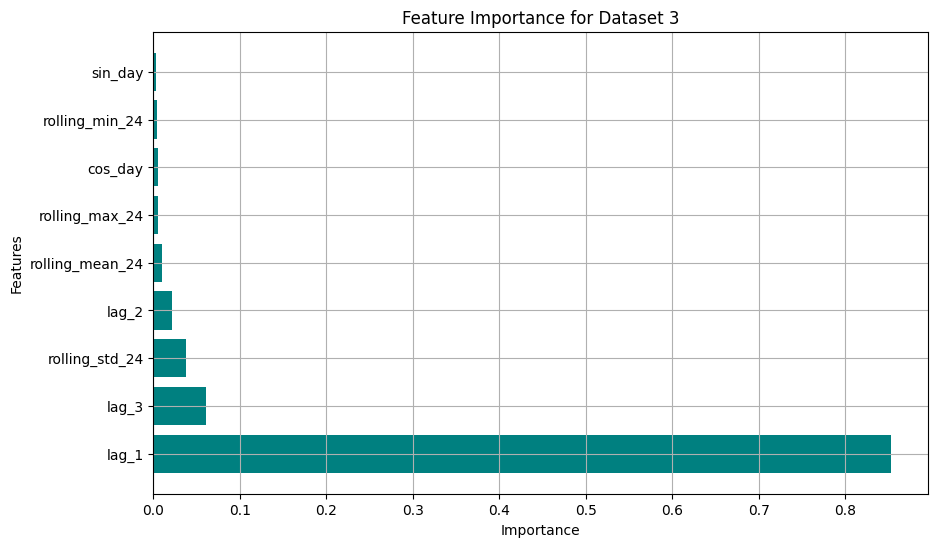

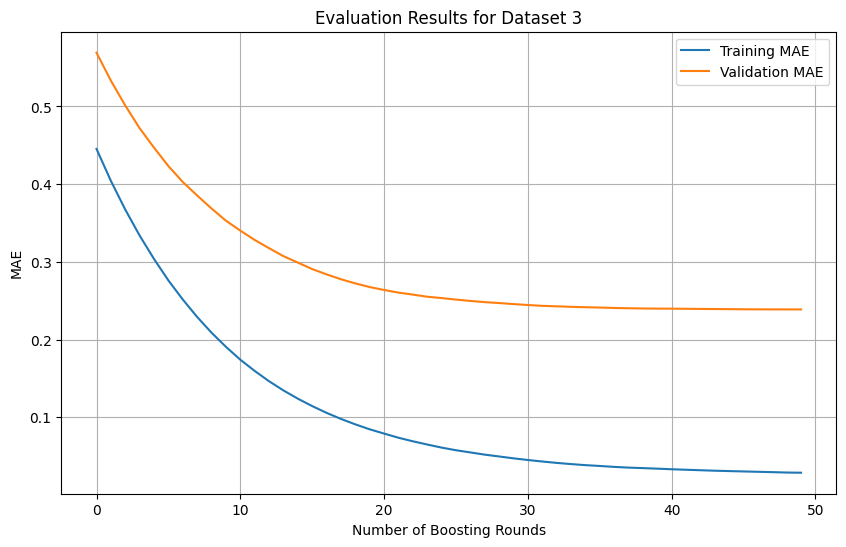

Dataset 3:
 Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 50, 'reg_alpha': 0, 'reg_lambda': 1.5}
 Best k: 1.5
 Test Set MAE: 0.2387
 Precision: 1.0000, Recall: 1.0000, F1: 1.0000
--------------------------------------------------


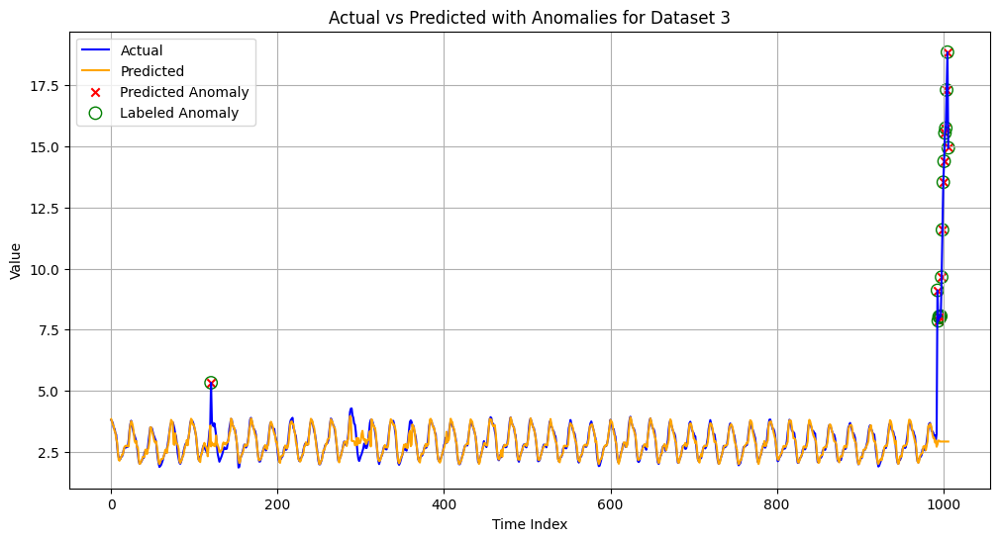

Dataset 3:
 Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 50, 'reg_alpha': 0, 'reg_lambda': 1.5}
 Best k: 3
 Test Set MAE: 0.2387
 Precision: 0.5172, Recall: 1.0000, F1: 0.6818
--------------------------------------------------


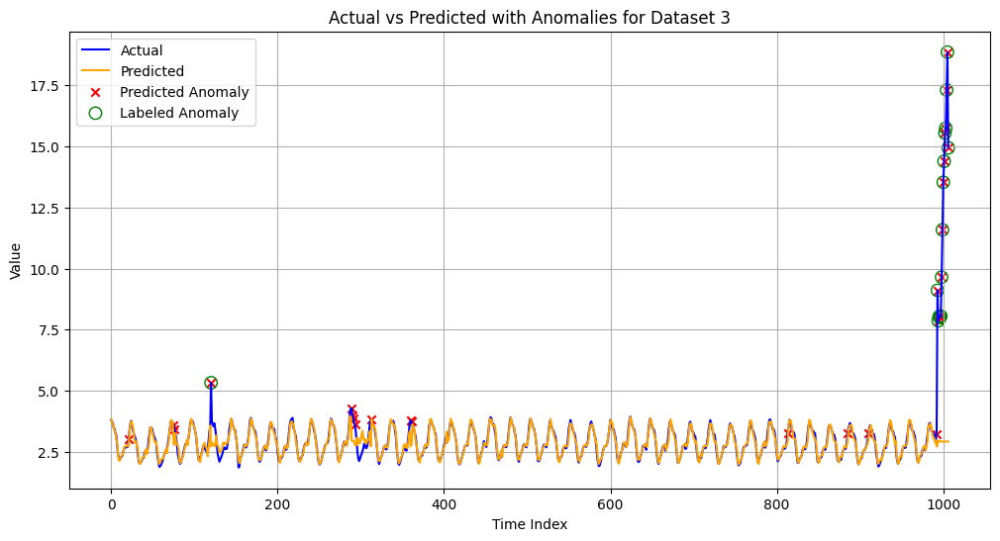

<ipython-input-4-4ae58c95129c>:11: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df.index = pd.date_range(start='2023-01-01', periods=len(df), freq='H')


Feature Importances:
rolling_std_24: 0.5558
rolling_mean_24: 0.2278
lag_1: 0.1318
sin_day: 0.0174
rolling_max_24: 0.0171
lag_3: 0.0163
cos_day: 0.0145
rolling_min_24: 0.0105
lag_2: 0.0088


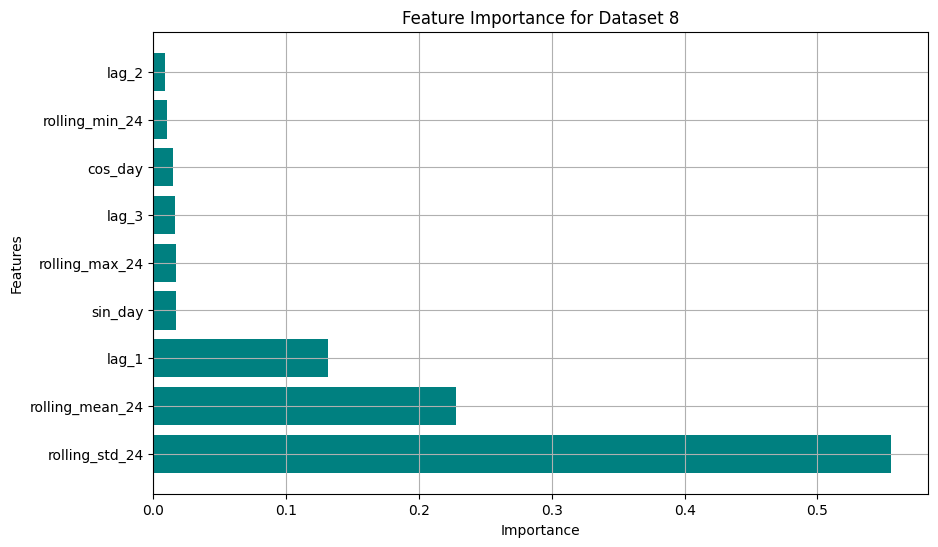

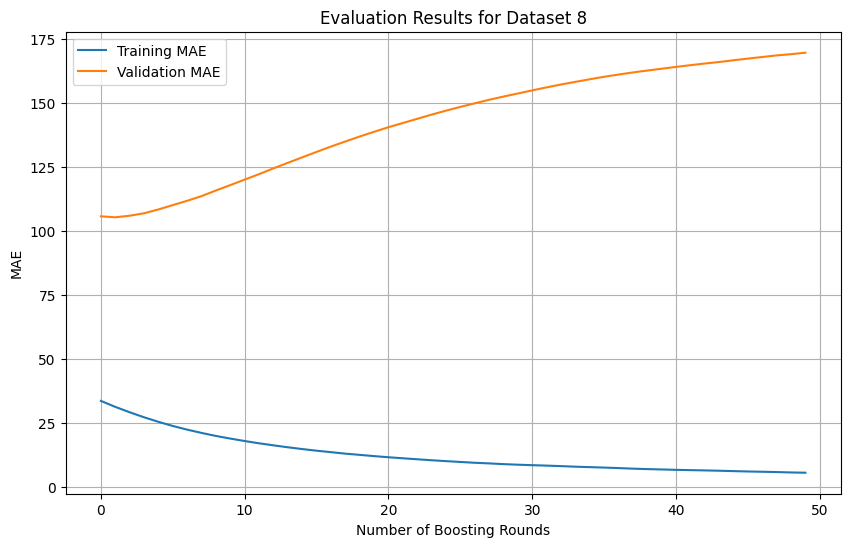

Dataset 8:
 Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 50, 'reg_alpha': 0, 'reg_lambda': 1}
 Best k: 3
 Test Set MAE: 169.4546
 Precision: 0.9091, Recall: 1.0000, F1: 0.9524
--------------------------------------------------


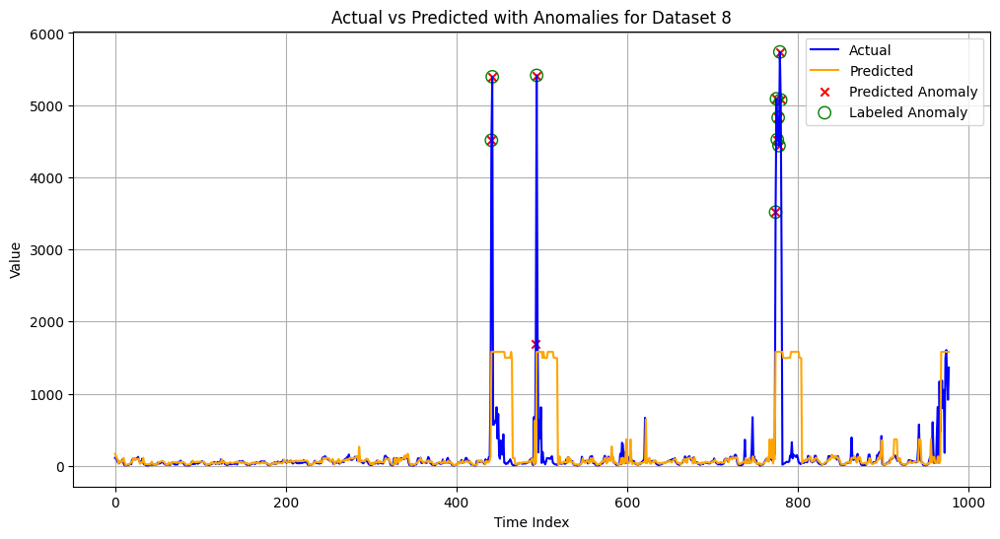

Dataset 8:
 Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 50, 'reg_alpha': 0, 'reg_lambda': 1}
 Best k: 3
 Test Set MAE: 169.4546
 Precision: 0.1852, Recall: 1.0000, F1: 0.3125
--------------------------------------------------


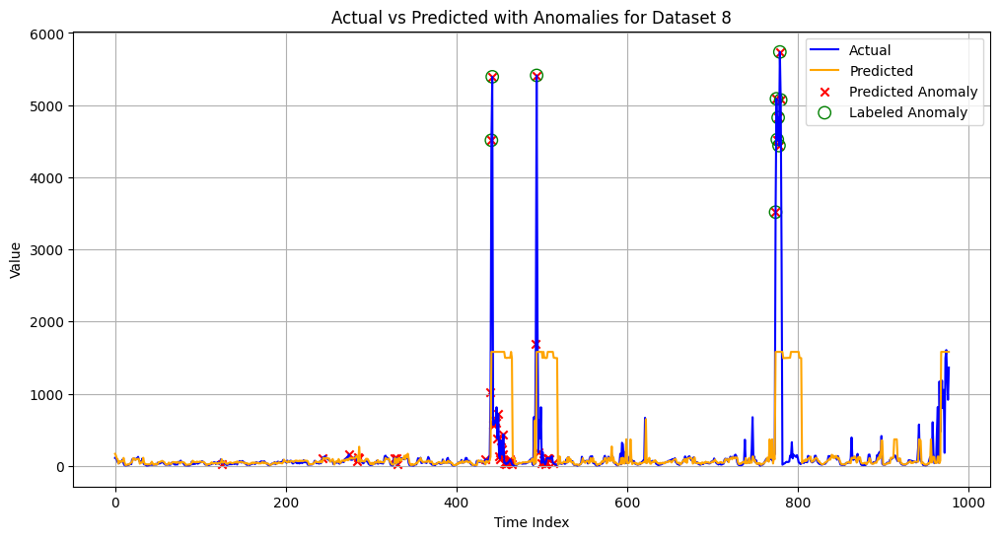

<ipython-input-4-4ae58c95129c>:11: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df.index = pd.date_range(start='2023-01-01', periods=len(df), freq='H')


Feature Importances:
lag_1: 0.7533
lag_3: 0.0566
rolling_max_24: 0.0463
cos_day: 0.0402
rolling_mean_24: 0.0338
lag_2: 0.0326
rolling_std_24: 0.0157
rolling_min_24: 0.0127
sin_day: 0.0089


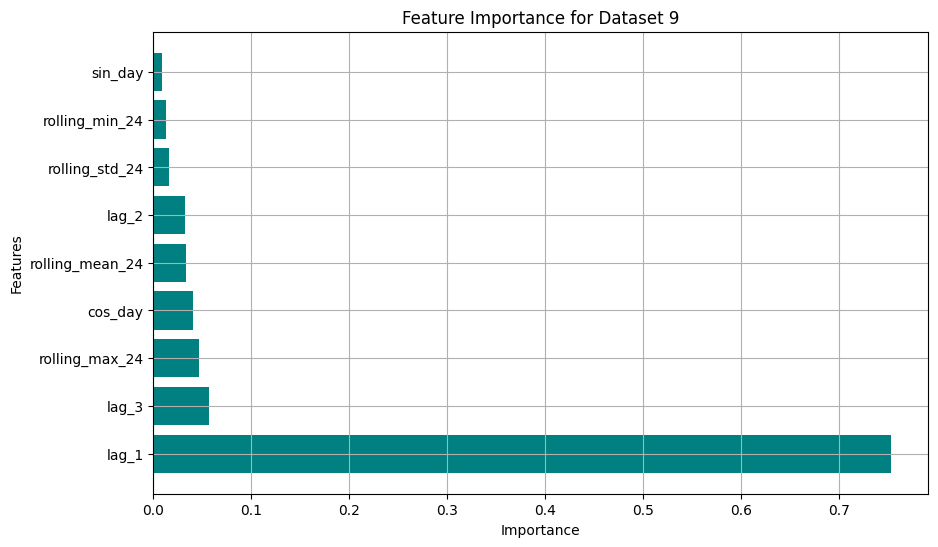

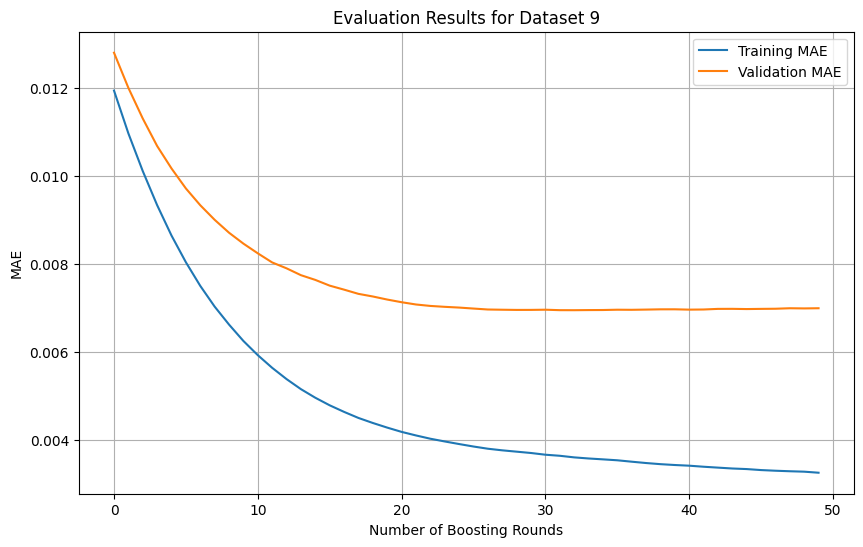

Dataset 9:
 Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0, 'reg_lambda': 2}
 Best k: 1.5
 Test Set MAE: 0.0070
 Precision: 0.8750, Recall: 0.8750, F1: 0.8750
--------------------------------------------------


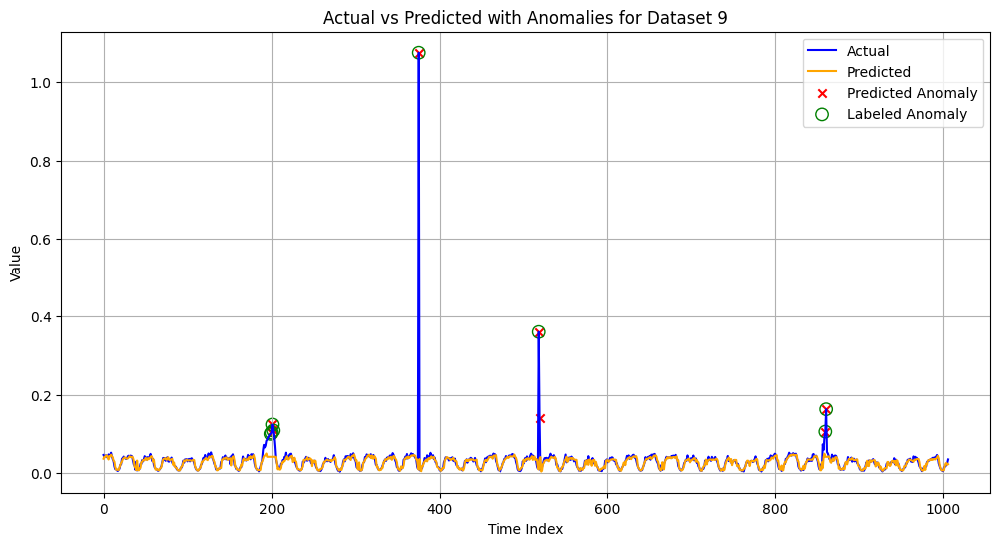

Dataset 9:
 Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0, 'reg_lambda': 2}
 Best k: 3
 Test Set MAE: 0.0070
 Precision: 0.3158, Recall: 0.7500, F1: 0.4444
--------------------------------------------------


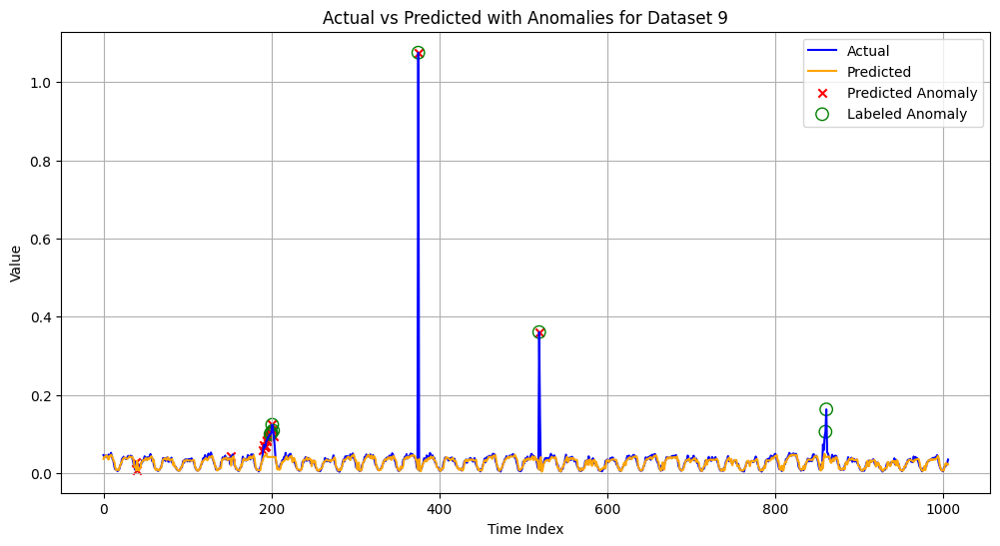

<ipython-input-4-4ae58c95129c>:11: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df.index = pd.date_range(start='2023-01-01', periods=len(df), freq='H')


Feature Importances:
lag_1: 0.4697
rolling_max_24: 0.0987
rolling_mean_24: 0.0908
rolling_min_24: 0.0680
lag_2: 0.0631
cos_day: 0.0563
lag_3: 0.0563
rolling_std_24: 0.0543
sin_day: 0.0428


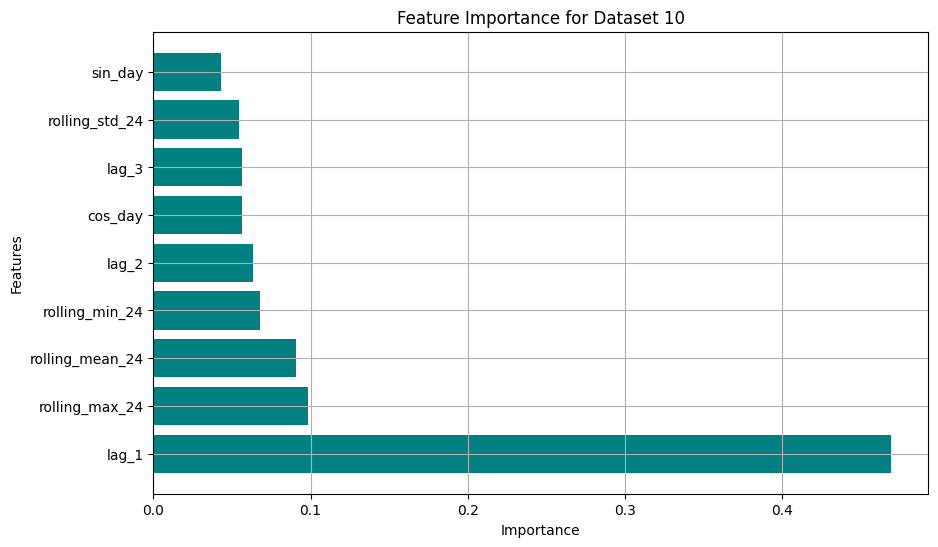

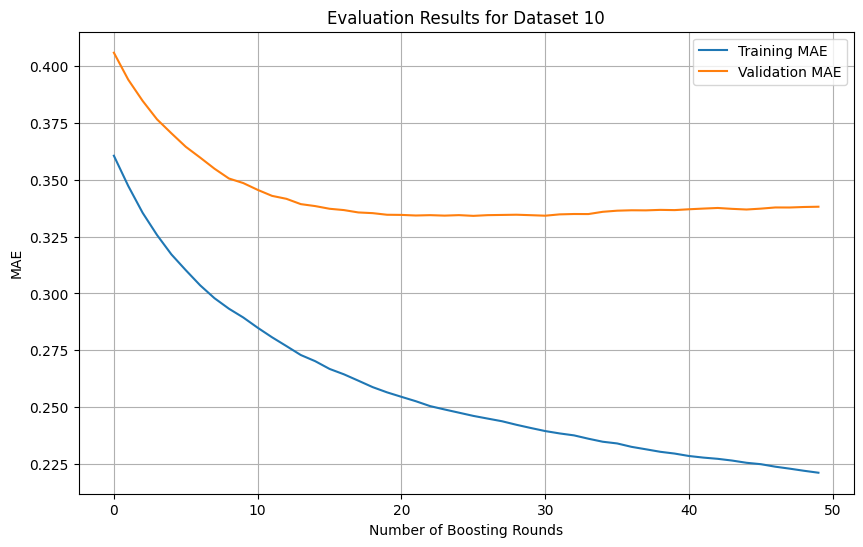

Dataset 10:
 Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0.5, 'reg_lambda': 1}
 Best k: 3
 Test Set MAE: 0.3381
 Precision: 1.0000, Recall: 1.0000, F1: 1.0000
--------------------------------------------------


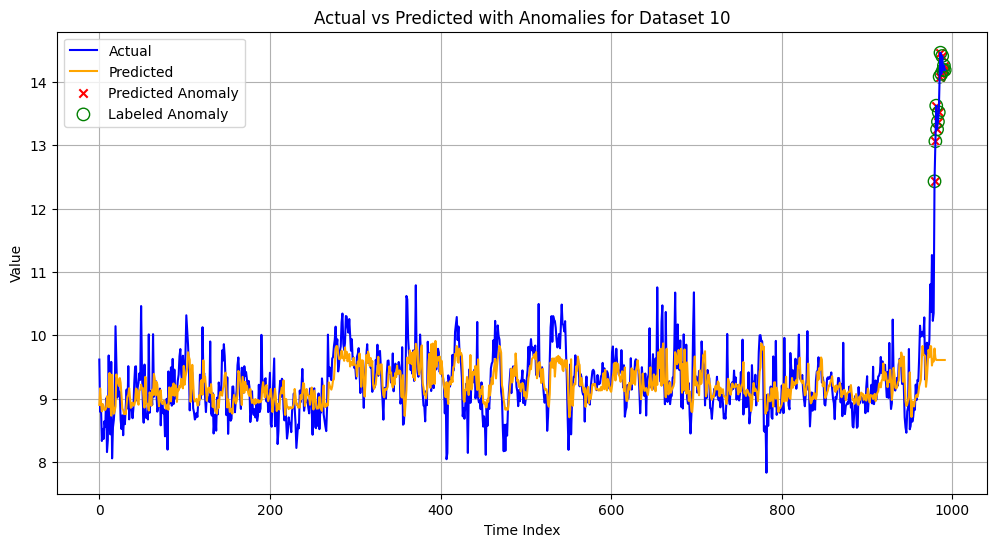

Dataset 10:
 Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0.5, 'reg_lambda': 1}
 Best k: 3
 Test Set MAE: 0.3381
 Precision: 0.4815, Recall: 1.0000, F1: 0.6500
--------------------------------------------------


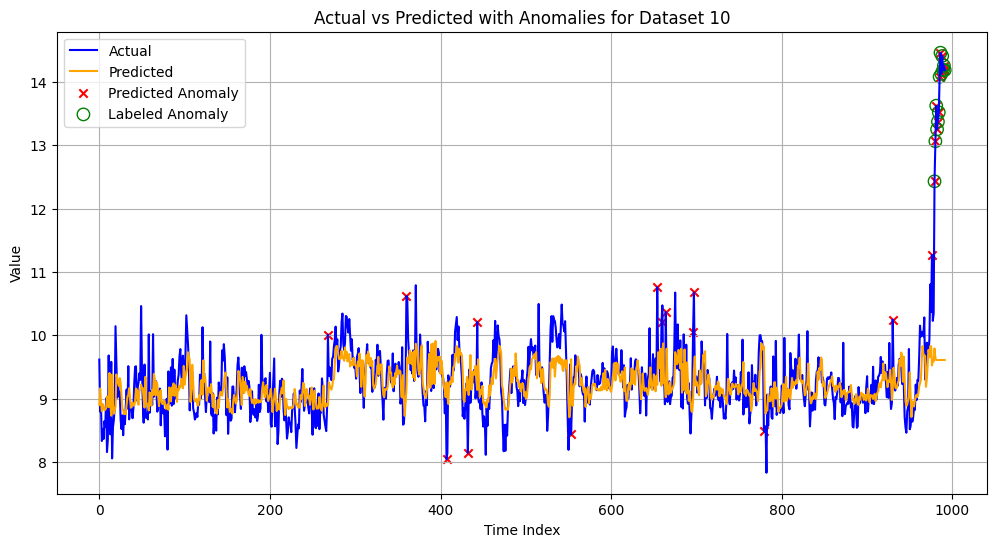

<ipython-input-4-4ae58c95129c>:11: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df.index = pd.date_range(start='2023-01-01', periods=len(df), freq='H')


Feature Importances:
lag_1: 0.7890
lag_3: 0.0864
lag_2: 0.0364
rolling_max_24: 0.0249
sin_day: 0.0191
cos_day: 0.0180
rolling_mean_24: 0.0095
rolling_std_24: 0.0084
rolling_min_24: 0.0082


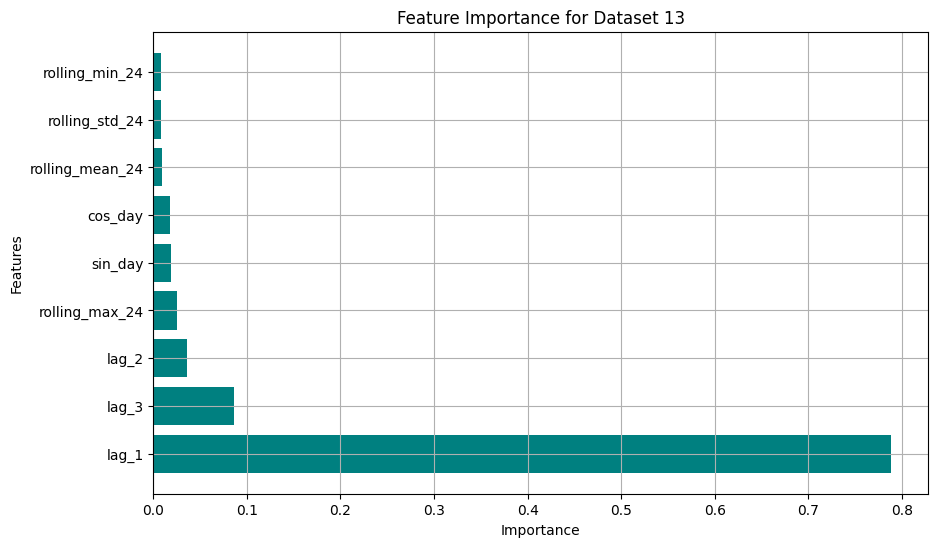

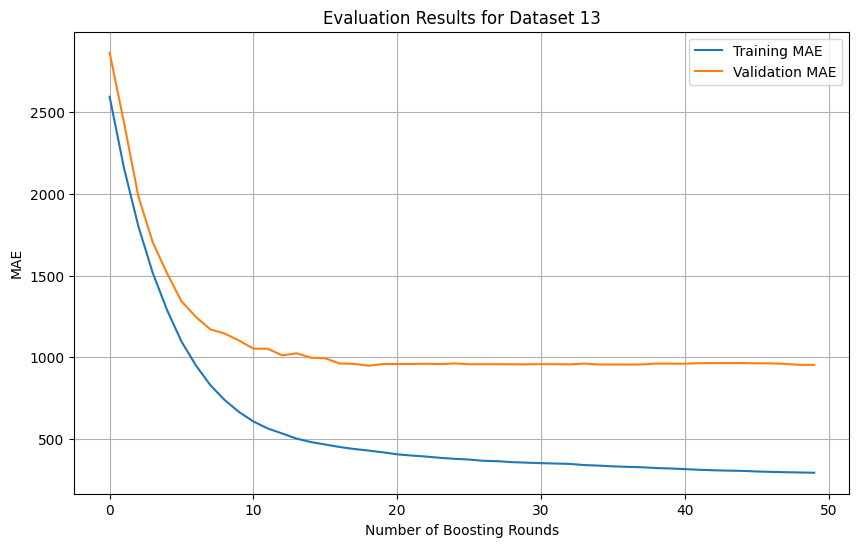

Dataset 13:
 Best Hyperparameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0, 'reg_lambda': 1.5}
 Best k: 3
 Test Set MAE: 952.3994
 Precision: 0.8889, Recall: 0.8889, F1: 0.8889
--------------------------------------------------


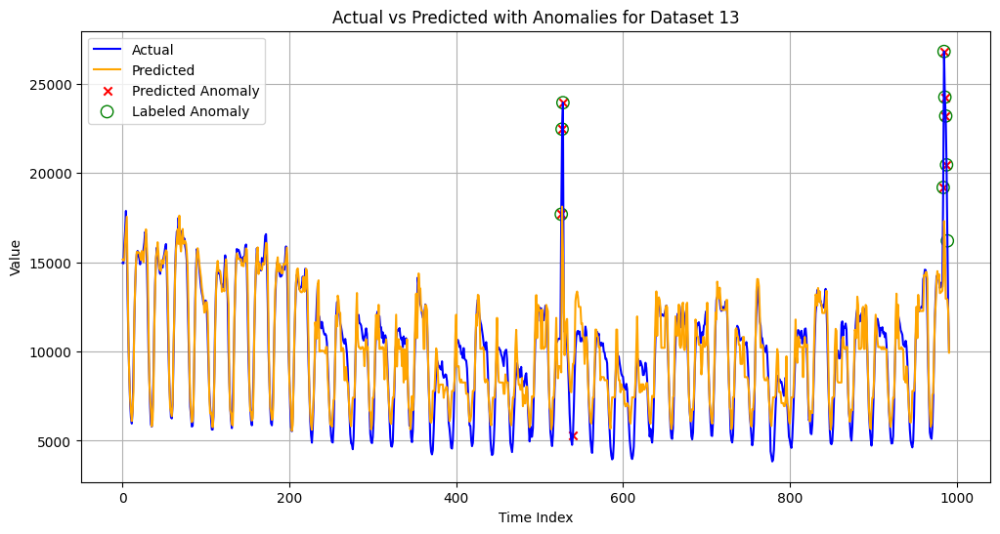

Dataset 13:
 Best Hyperparameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0, 'reg_lambda': 1.5}
 Best k: 3
 Test Set MAE: 952.3994
 Precision: 0.2667, Recall: 0.8889, F1: 0.4103
--------------------------------------------------


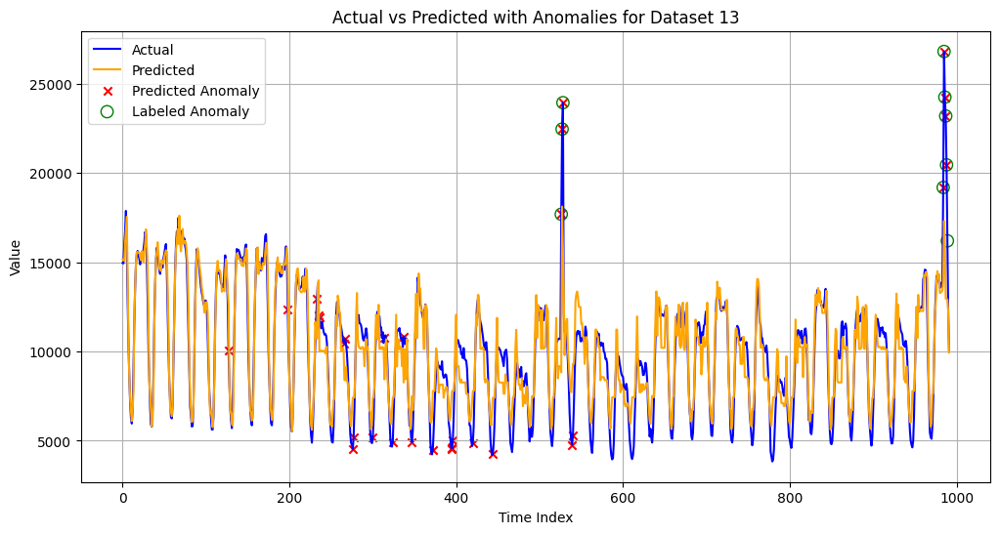

<ipython-input-4-4ae58c95129c>:11: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df.index = pd.date_range(start='2023-01-01', periods=len(df), freq='H')


Feature Importances:
lag_1: 0.4658
rolling_min_24: 0.1256
rolling_mean_24: 0.1145
rolling_std_24: 0.1021
lag_3: 0.0979
rolling_max_24: 0.0599
lag_2: 0.0342
cos_day: 0.0000
sin_day: 0.0000


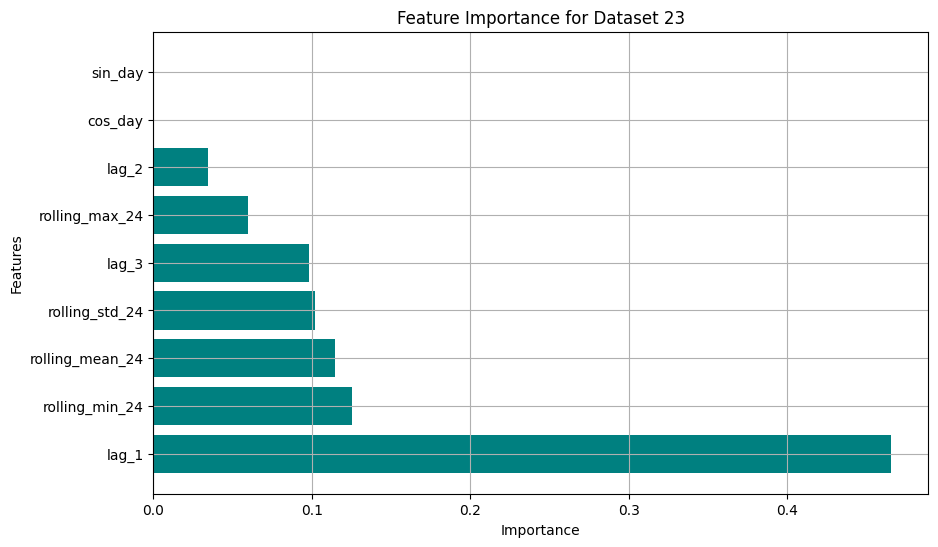

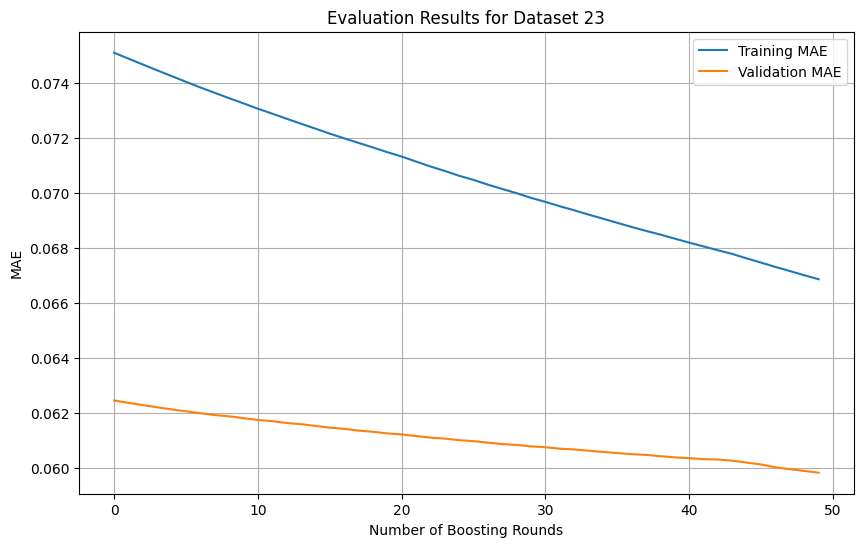

Dataset 23:
 Best Hyperparameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0.1, 'reg_lambda': 1}
 Best k: 3
 Test Set MAE: 0.0598
 Precision: 0.4286, Recall: 1.0000, F1: 0.6000
--------------------------------------------------


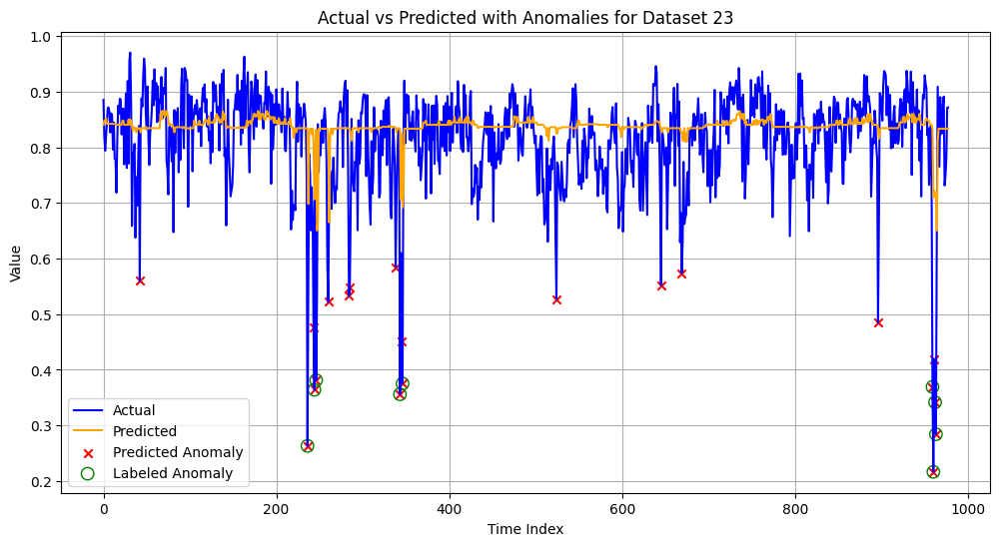

Dataset 23:
 Best Hyperparameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0.1, 'reg_lambda': 1}
 Best k: 3
 Test Set MAE: 0.0598
 Precision: 0.4091, Recall: 1.0000, F1: 0.5806
--------------------------------------------------


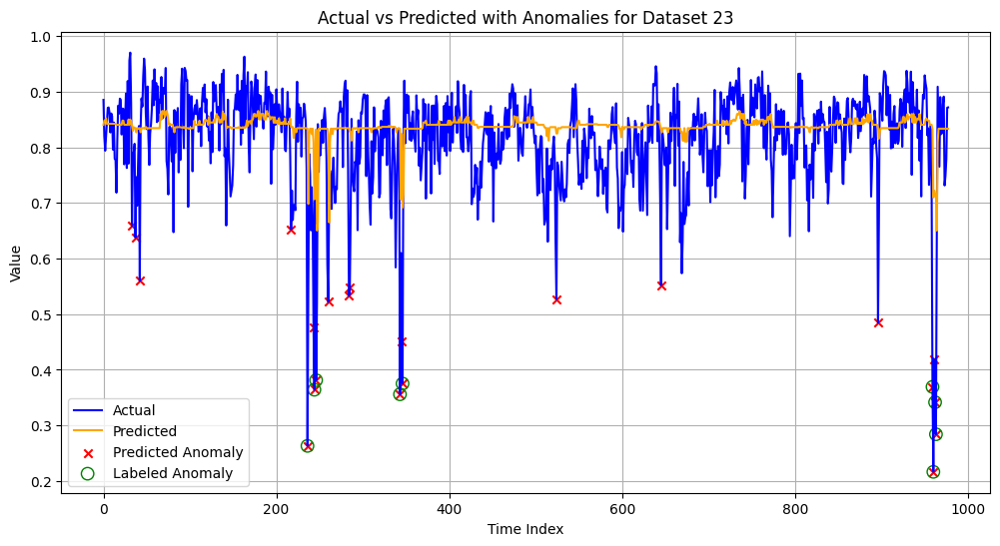

<ipython-input-4-4ae58c95129c>:11: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df.index = pd.date_range(start='2023-01-01', periods=len(df), freq='H')


Feature Importances:
lag_1: 0.4512
rolling_max_24: 0.1042
lag_3: 0.0880
rolling_mean_24: 0.0833
rolling_min_24: 0.0801
lag_2: 0.0750
cos_day: 0.0691
rolling_std_24: 0.0489
sin_day: 0.0000


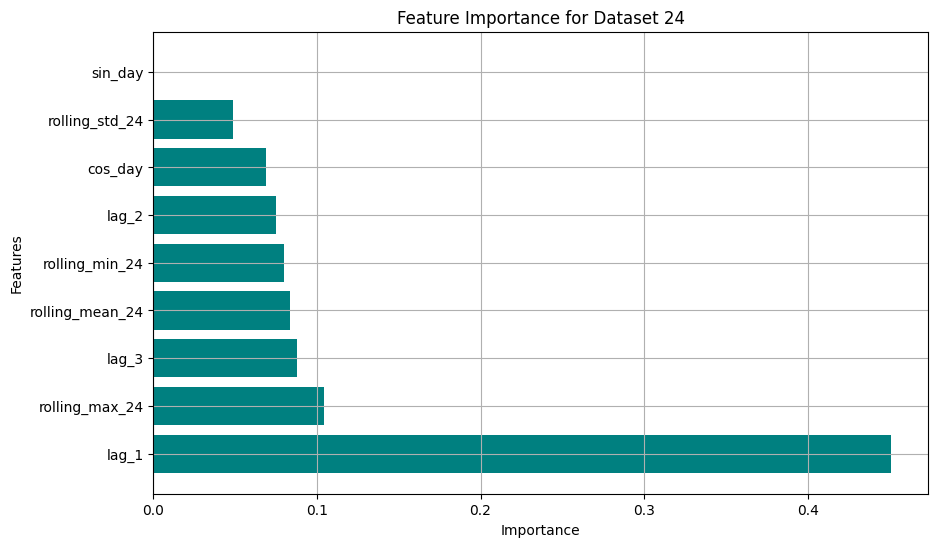

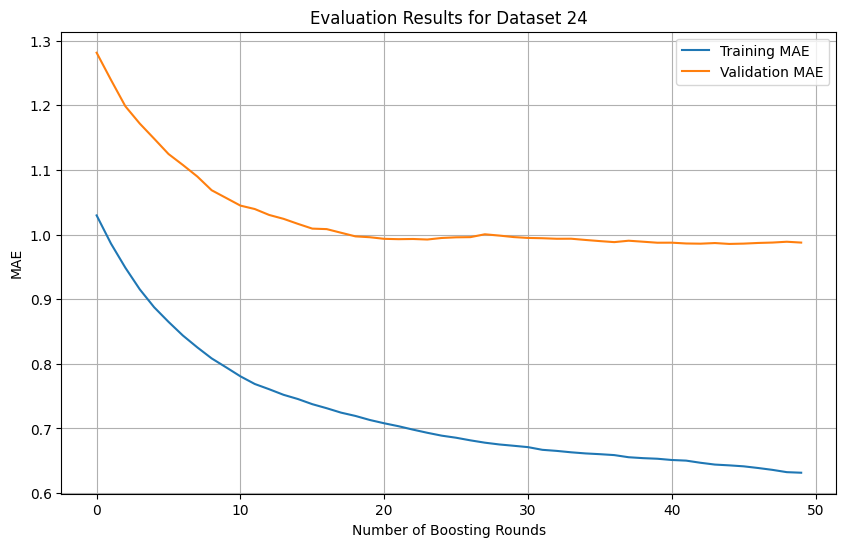

Dataset 24:
 Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0.5, 'reg_lambda': 2}
 Best k: 3
 Test Set MAE: 0.9877
 Precision: 1.0000, Recall: 1.0000, F1: 1.0000
--------------------------------------------------


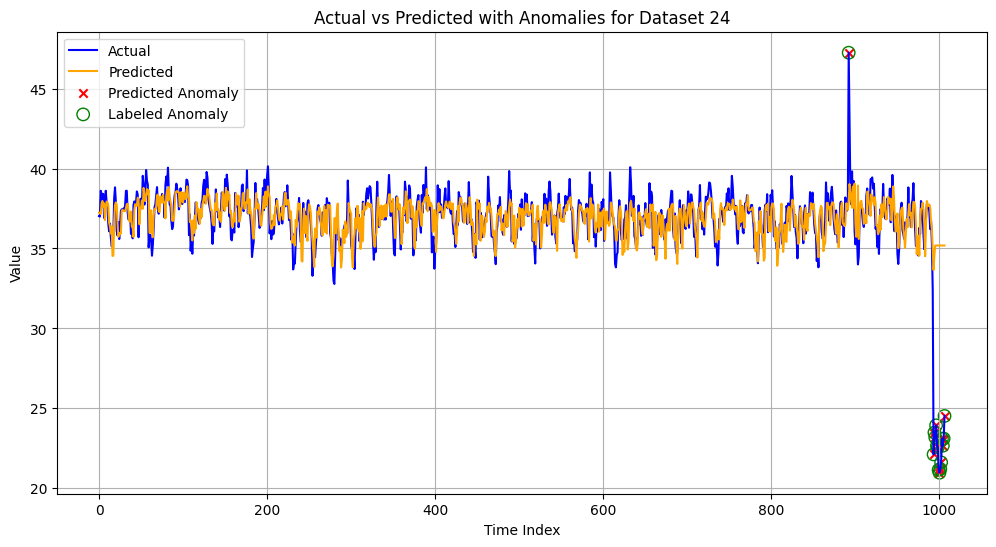

Dataset 24:
 Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0.5, 'reg_lambda': 2}
 Best k: 3
 Test Set MAE: 0.9877
 Precision: 0.6000, Recall: 1.0000, F1: 0.7500
--------------------------------------------------


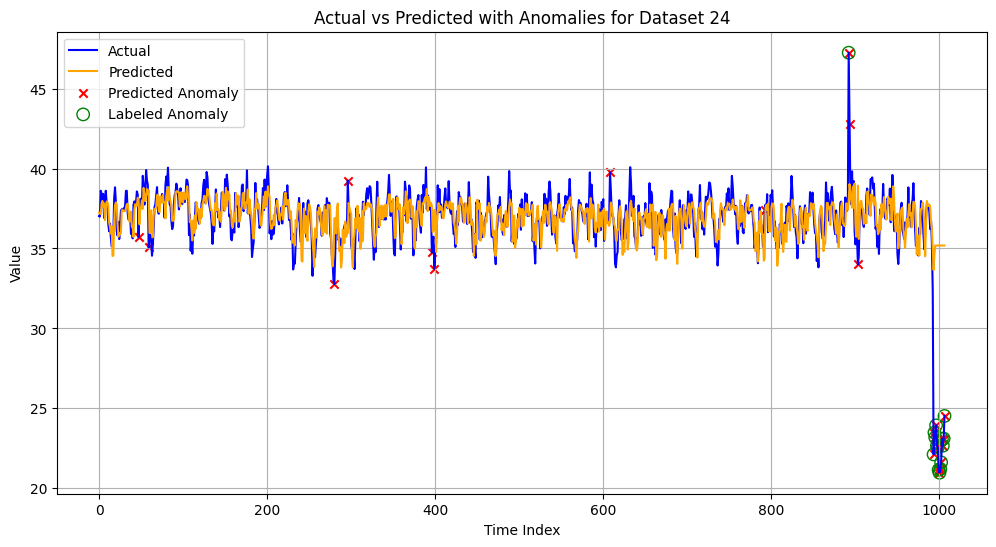

<ipython-input-4-4ae58c95129c>:11: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df.index = pd.date_range(start='2023-01-01', periods=len(df), freq='H')


Feature Importances:
lag_1: 0.8380
lag_3: 0.0704
rolling_max_24: 0.0224
rolling_std_24: 0.0199
lag_2: 0.0148
cos_day: 0.0118
sin_day: 0.0088
rolling_mean_24: 0.0075
rolling_min_24: 0.0064


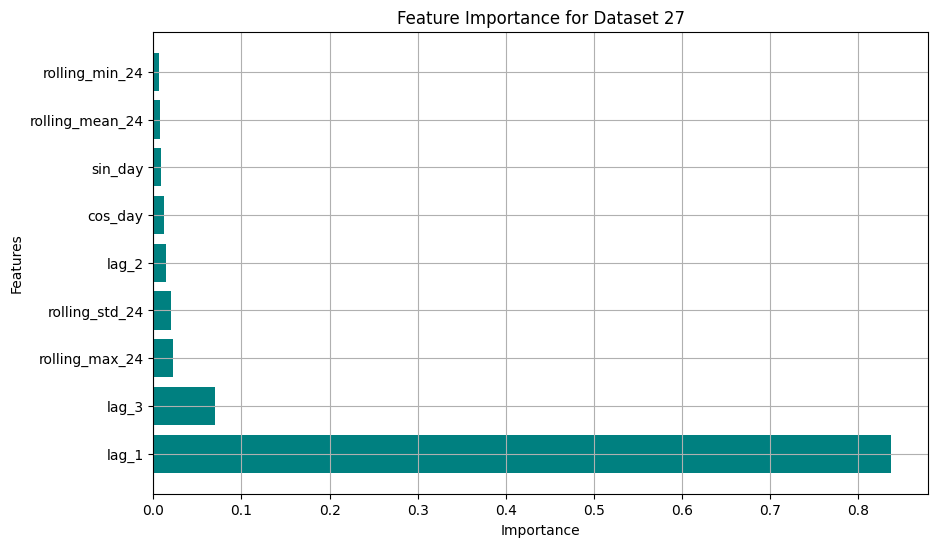

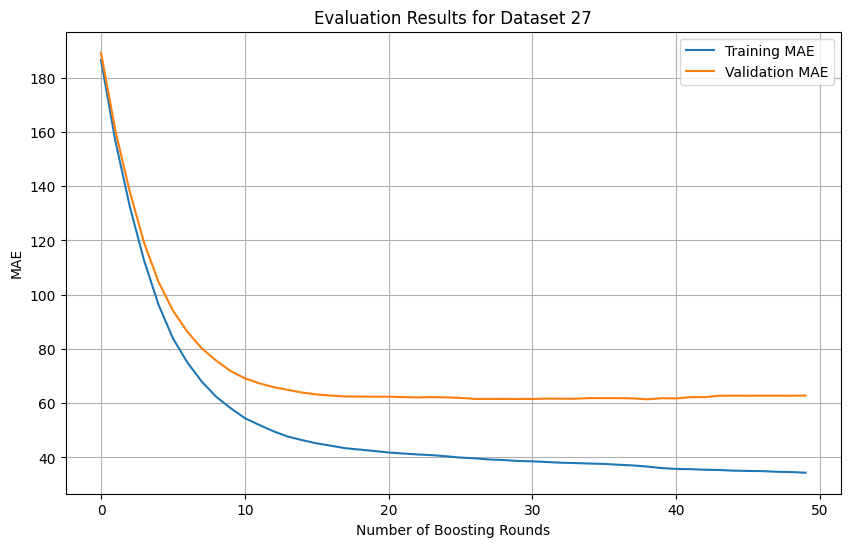

Dataset 27:
 Best Hyperparameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0, 'reg_lambda': 1}
 Best k: 3
 Test Set MAE: 62.8127
 Precision: 0.2222, Recall: 1.0000, F1: 0.3636
--------------------------------------------------


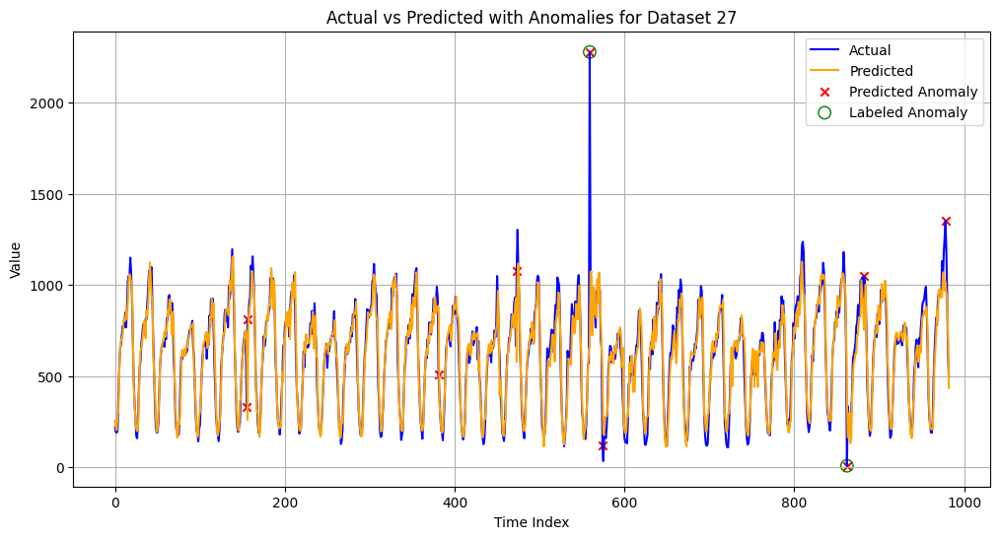

Dataset 27:
 Best Hyperparameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0, 'reg_lambda': 1}
 Best k: 3
 Test Set MAE: 62.8127
 Precision: 0.1333, Recall: 1.0000, F1: 0.2353
--------------------------------------------------


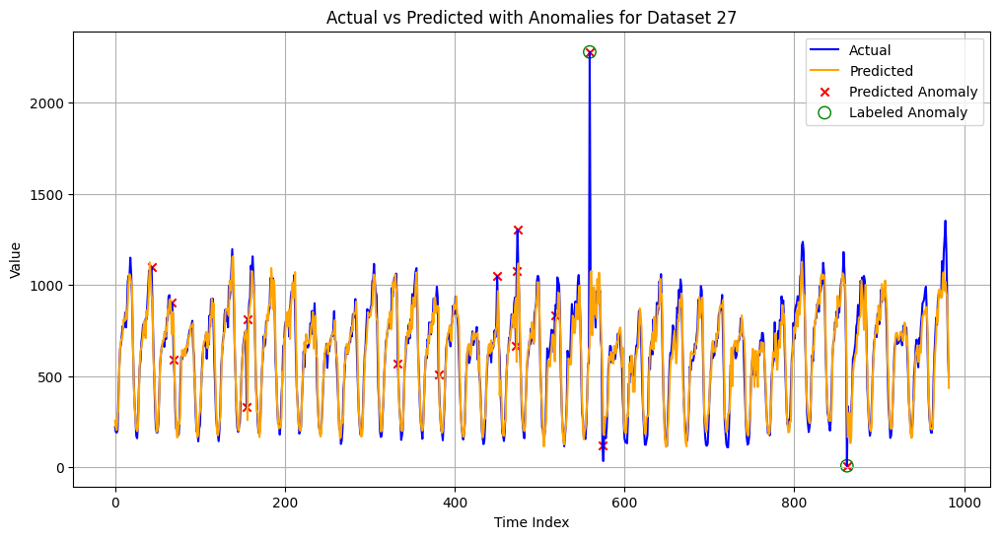

<ipython-input-4-4ae58c95129c>:11: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df.index = pd.date_range(start='2023-01-01', periods=len(df), freq='H')


Feature Importances:
lag_1: 0.8182
lag_3: 0.0852
lag_2: 0.0243
rolling_max_24: 0.0194
rolling_std_24: 0.0172
rolling_min_24: 0.0133
cos_day: 0.0094
rolling_mean_24: 0.0076
sin_day: 0.0055


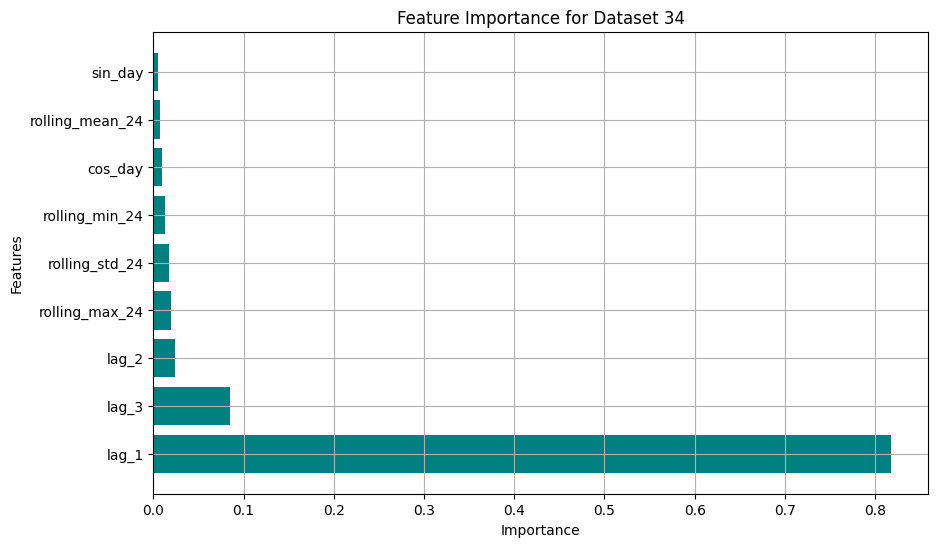

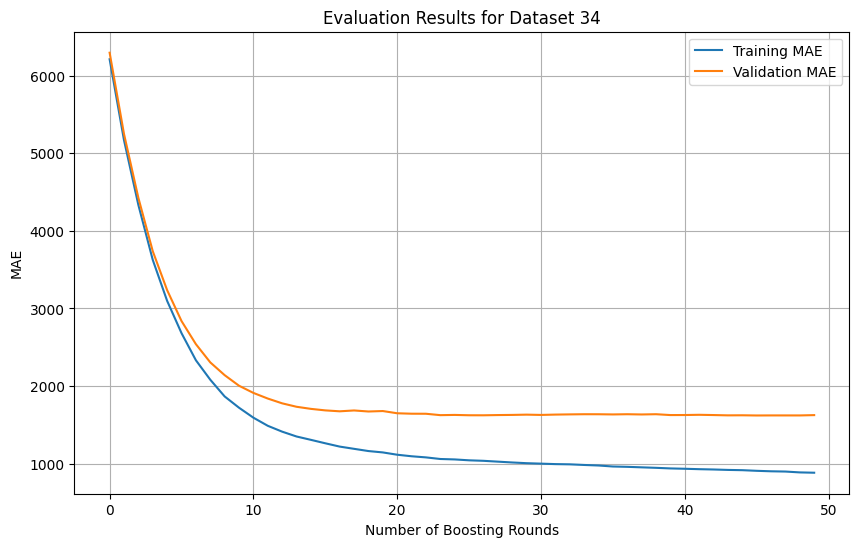

Dataset 34:
 Best Hyperparameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0.5, 'reg_lambda': 1.5}
 Best k: 3
 Test Set MAE: 1626.5821
 Precision: 0.6364, Recall: 1.0000, F1: 0.7778
--------------------------------------------------


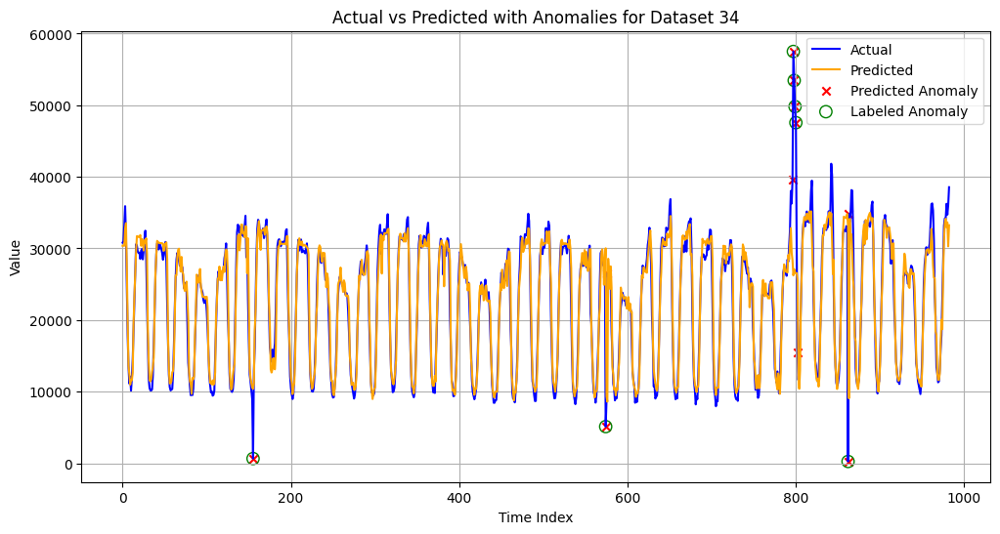

Dataset 34:
 Best Hyperparameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0.5, 'reg_lambda': 1.5}
 Best k: 3
 Test Set MAE: 1626.5821
 Precision: 0.3043, Recall: 1.0000, F1: 0.4667
--------------------------------------------------


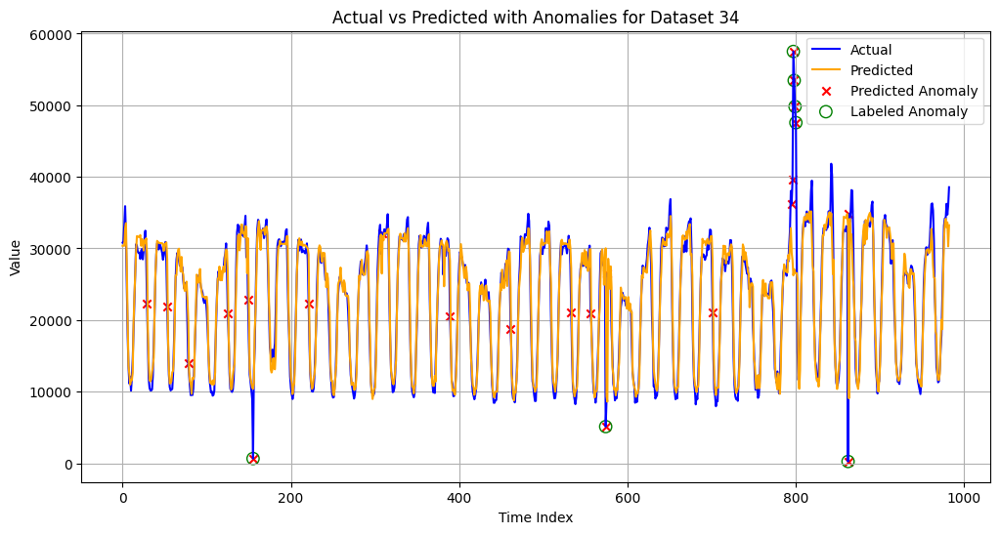

<ipython-input-4-4ae58c95129c>:11: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df.index = pd.date_range(start='2023-01-01', periods=len(df), freq='H')


Feature Importances:
rolling_std_24: 0.4293
lag_2: 0.3558
lag_1: 0.1141
rolling_mean_24: 0.0850
lag_3: 0.0157
cos_day: 0.0000
sin_day: 0.0000
rolling_max_24: 0.0000
rolling_min_24: 0.0000


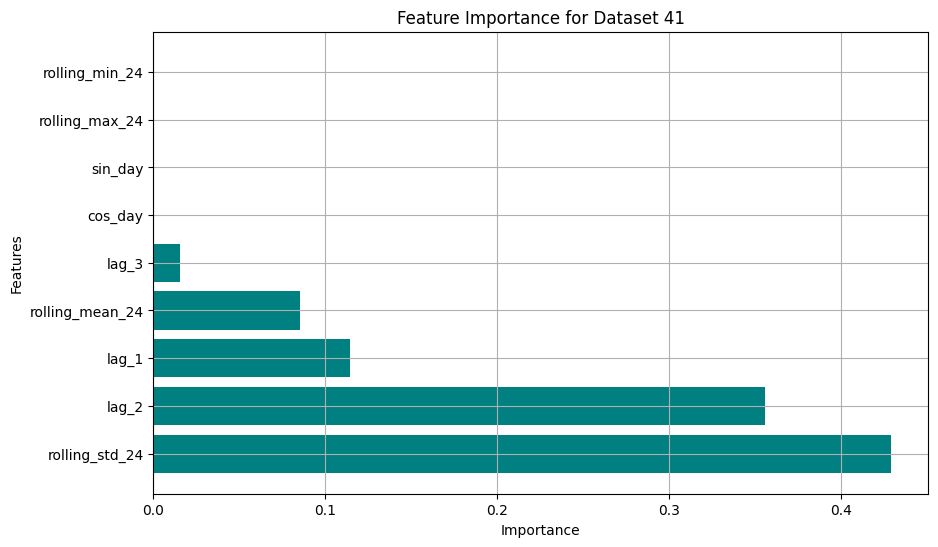

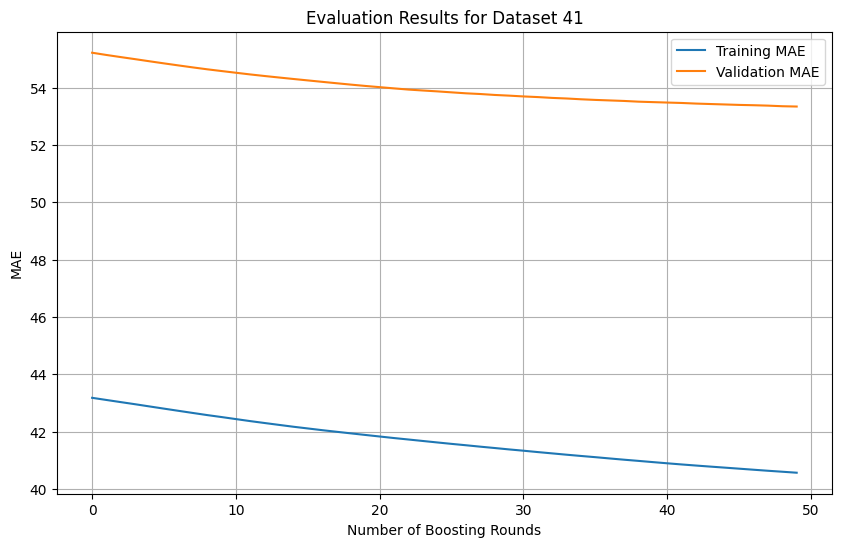

Dataset 41:
 Best Hyperparameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0.1, 'reg_lambda': 1.5}
 Best k: 3
 Test Set MAE: 53.3362
 Precision: 0.2000, Recall: 1.0000, F1: 0.3333
--------------------------------------------------


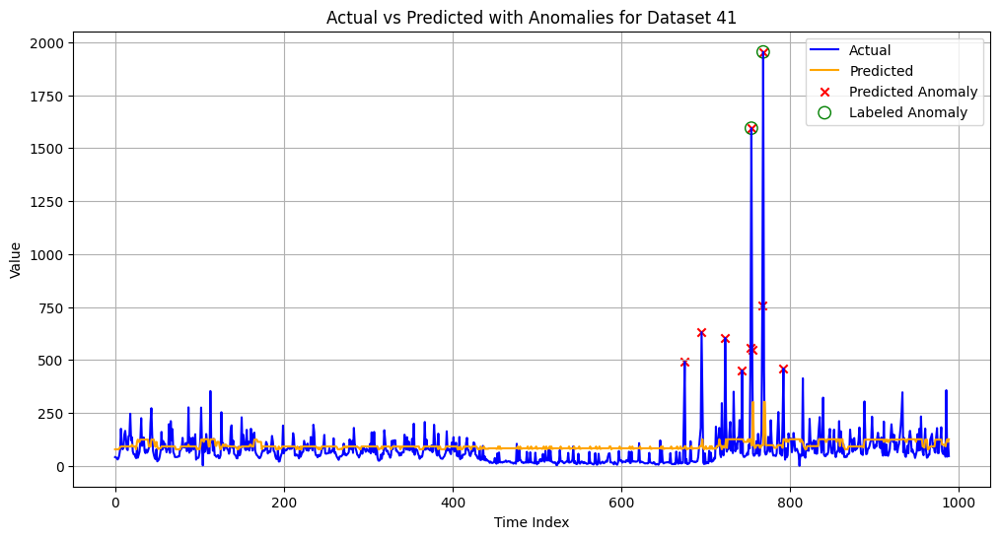

Dataset 41:
 Best Hyperparameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0.1, 'reg_lambda': 1.5}
 Best k: 3
 Test Set MAE: 53.3362
 Precision: 0.1111, Recall: 1.0000, F1: 0.2000
--------------------------------------------------


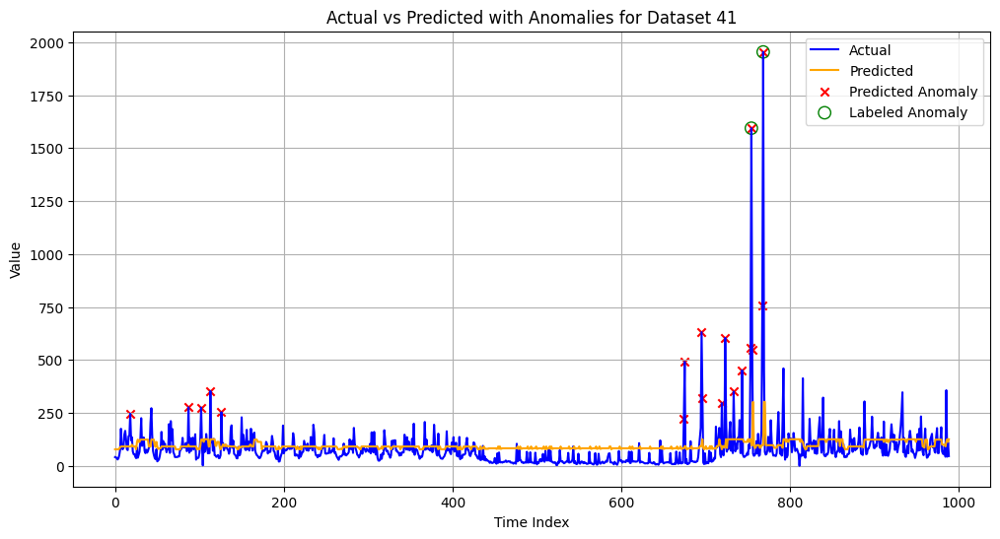

<ipython-input-4-4ae58c95129c>:11: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df.index = pd.date_range(start='2023-01-01', periods=len(df), freq='H')


Feature Importances:
rolling_std_24: 0.2184
lag_1: 0.1787
rolling_mean_24: 0.1772
sin_day: 0.1523
lag_2: 0.0924
lag_3: 0.0735
rolling_max_24: 0.0733
cos_day: 0.0342
rolling_min_24: 0.0000


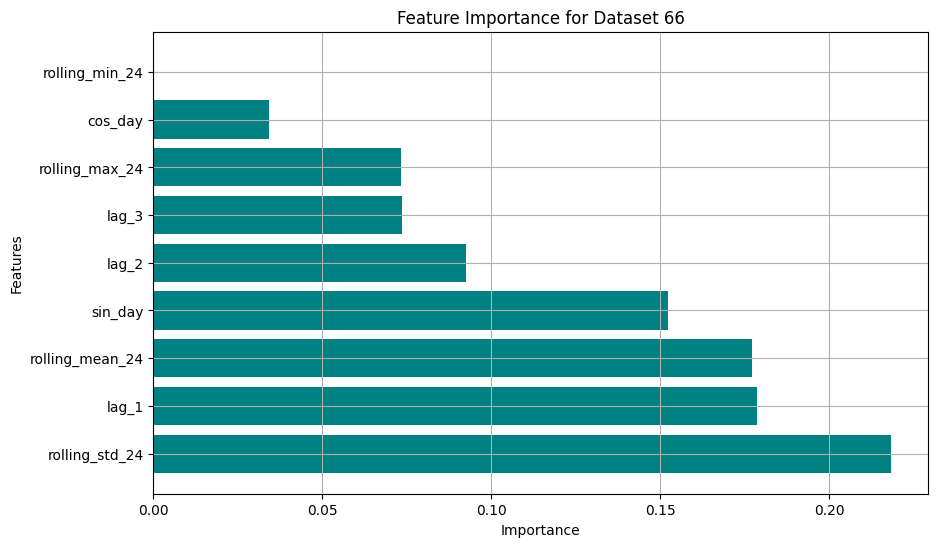

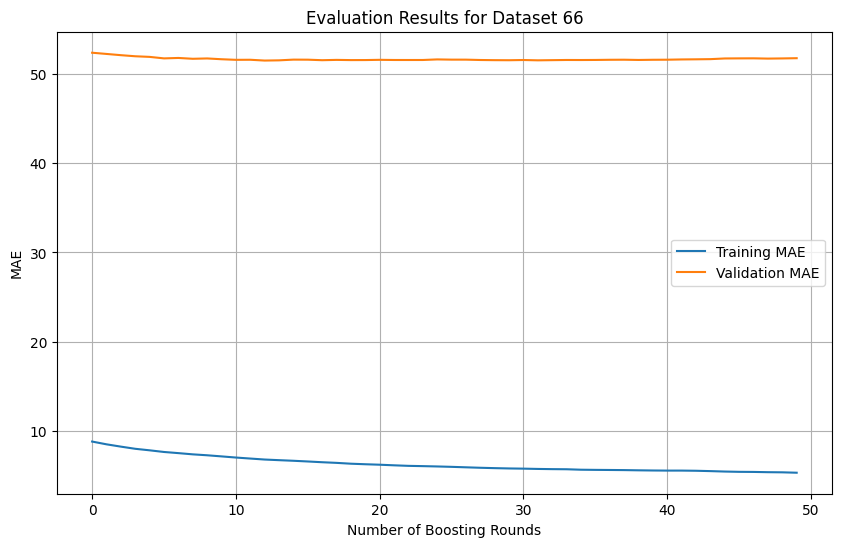

Dataset 66:
 Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0, 'reg_lambda': 2}
 Best k: 3
 Test Set MAE: 51.7894
 Precision: 0.9500, Recall: 0.9048, F1: 0.9268
--------------------------------------------------


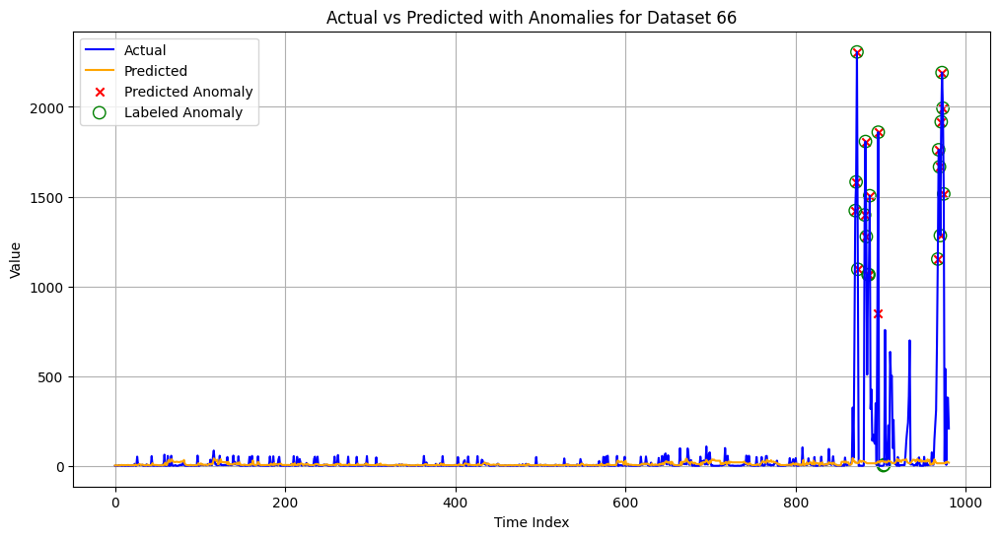

Dataset 66:
 Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0, 'reg_lambda': 2}
 Best k: 3
 Test Set MAE: 51.7894
 Precision: 0.3455, Recall: 0.9048, F1: 0.5000
--------------------------------------------------


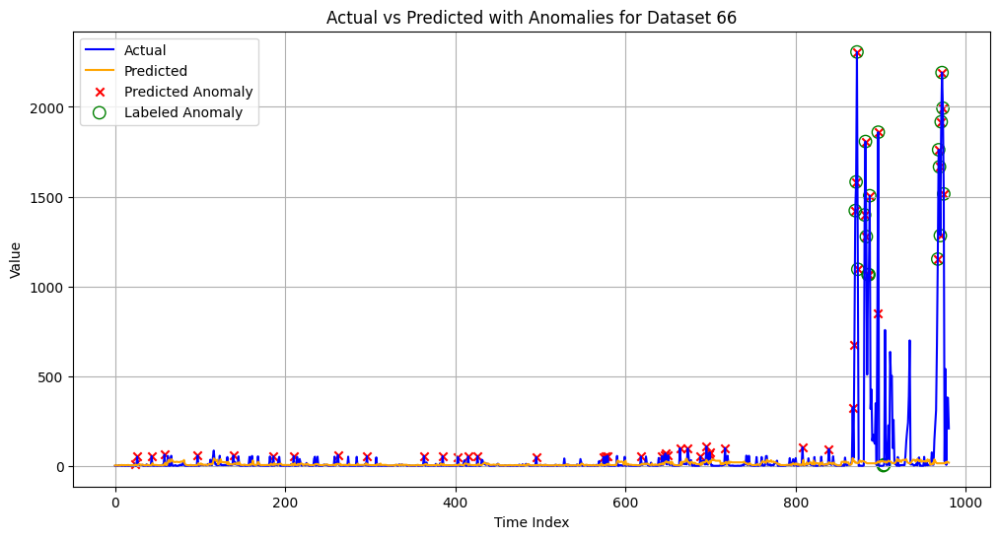


=== Average Best Metrics Across All Datasets ===
Average Precision SW = 0.71
Average Recall SW   = 0.96
Average F1-Score SW = 0.75
All F1 Scores SW: ['0.1818', '0.8571', '1.0000', '0.9524', '0.8750', '1.0000', '0.8889', '0.6000', '1.0000', '0.3636', '0.7778', '0.3333', '0.9268']

=== Average Best Metrics Across All Datasets ===
Average Precision DW = 0.32
Average Recall DW   = 0.92
Average F1-Score DW = 0.44
All F1 Scores DW: ['0.1429', '0.3750', '0.6818', '0.3125', '0.4444', '0.6500', '0.4103', '0.5806', '0.7500', '0.2353', '0.4667', '0.2000', '0.5000']


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, precision_score, recall_score, f1_score
from sklearn.model_selection import TimeSeriesSplit
import xgboost as xgb


A1A = [1,2,3,8,9,10,13,23,24,27,34,41,66]
# Hyperparameters for XGBoost
param_grid = {
    'n_estimators': [50],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'reg_alpha': [0, 0.1, 0.5],
    'reg_lambda': [1, 1.5, 2]
}

tscv = TimeSeriesSplit(n_splits=2)  # For time-series cross-validation

all_best_precisions_dw = []
all_best_recalls_dw = []
all_best_f1_scores_dw = []
all_best_precisions_sw = []
all_best_recalls_sw = []
all_best_f1_scores_sw = []


possible_ks = [1.5, 2, 2.5, 3]  # Διάφορες τιμές k για δοκιμή
possible_windows = [100, 200, 300, 500]  # Διάφορες τιμές rolling window

for i in A1A:
    df = dfsA1[i].copy()
    value_col = f"value_{i}"

    # Ensure the dataframe has 'label' and value_col
    if value_col not in df.columns or "label" not in df.columns:
        print(f"Dataset {i} does not have the required columns.")
        continue

    # Apply feature engineering
    df = feature_engineering(df, value_col, window_size=24)

    # Prepare the data
    features = [col for col in df.columns if col != 'label' and col != value_col]
    X = df[features].values
    y = df[value_col].values
    labels = df["label"].values  # Ground truth anomaly labels

    # Split data into train and test sets
    X_train, X_test, y_train, y_test, label_train, label_test = train_test_split(
        X, y, labels, test_size=0.7, shuffle=False
    )

    # Scale the features
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    # Define the XGBoost model
    model = XGBRegressor(random_state=42, eval_metric="mae")

    # Perform grid search
    grid_search = GridSearchCV(
        estimator=model,
        param_grid=param_grid,
        scoring='neg_mean_absolute_error',
        cv = tscv,
        n_jobs=-1,
        return_train_score=True
    )
    grid_search.fit(
    X_train,
    y_train,
    eval_set=[(X_train, y_train), (X_test, y_test)],
    verbose=False
    )

#=================================================================================================================
# FEATURE IMPORTANCE
#=================================================================================================================

    # Retrieve the best model
    best_model = grid_search.best_estimator_

    # Extract evaluation results
    evals_result = best_model.evals_result()

    # Extract MAE for training and validation
    train_mae = evals_result["validation_0"]["mae"]  # Training MAE
    test_mae = evals_result["validation_1"]["mae"]   # Validation MAE

    # Predict on test set
    y_pred = best_model.predict(X_test)

    # Compute residuals
    residuals = np.abs(y_test - y_pred)

    # Feature Importance
    feature_importances = best_model.feature_importances_
    sorted_indices = np.argsort(feature_importances)[::-1]
    print("Feature Importances:")
    for idx in sorted_indices:
        print(f"{features[idx]}: {feature_importances[idx]:.4f}")

    # Plot feature importance
    plt.figure(figsize=(10, 6))
    plt.barh([features[idx] for idx in sorted_indices], feature_importances[sorted_indices], color='teal')
    plt.title(f"Feature Importance for Dataset {i}")
    plt.xlabel("Importance")
    plt.ylabel("Features")
    plt.grid()
    plt.show()

#=================================================================================================================
# TRUE AND PREDICTED AND LOSSES PLOTS
#=================================================================================================================

    # Plot the evaluation results
    plt.figure(figsize=(10, 6))
    plt.plot(train_mae, label="Training MAE")
    plt.plot(test_mae, label="Validation MAE")
    plt.xlabel("Number of Boosting Rounds")
    plt.ylabel("MAE")
    plt.title(f"Evaluation Results for Dataset {i}")
    plt.legend()
    plt.grid(True)
    plt.show()

#=================================================================================================================
# STATIC WINDOW
#=================================================================================================================

    # Optimize k for the static threshold
    best_f1_sw = -1
    best_k_sw = None
    best_precision_sw = 0
    best_recall_sw = 0
    best_predicted_anomalies_sw = None

    for k_sw in possible_ks:
        threshold_sw = np.mean(residuals) + k_sw * np.std(residuals)
        predicted_anomalies_sw = (residuals > threshold_sw).astype(int)

        precision_sw = precision_score(label_test, predicted_anomalies_sw, zero_division=0)
        recall_sw = recall_score(label_test, predicted_anomalies_sw, zero_division=0)
        f1_sw = f1_score(label_test, predicted_anomalies_sw, zero_division=0)

        if f1_sw > best_f1_sw:
            best_f1_sw = f1_sw
            best_k_sw = k_sw
            best_precision_sw = precision_sw
            best_recall_sw = recall_sw
            best_predicted_anomalies_sw = predicted_anomalies_sw

    all_best_precisions_sw.append(best_precision_sw)
    all_best_recalls_sw.append(best_recall_sw)
    all_best_f1_scores_sw.append(best_f1_sw)

    # Print metrics
    print(f"Dataset {i}:")
    print(f" Best Hyperparameters: {grid_search.best_params_}")
    print(f" Best k: {best_k_sw}")
    print(f" Test Set MAE: {mean_absolute_error(y_test, y_pred):.4f}")
    print(f" Precision: {best_precision_sw:.4f}, Recall: {best_recall_sw:.4f}, F1: {best_f1_sw:.4f}")
    print("-" * 50)

    # Plot actual vs predicted and highlight anomalies
    fig, ax = plt.subplots(figsize=(12, 6))

    # Plot actual and predicted values over time
    ax.plot(range(len(y_test)), y_test, label='Actual', color='blue')
    ax.plot(range(len(y_test)), y_pred, label='Predicted', color='orange')

    # Highlight predicted anomalies (red)
    pred_anomaly_indices = np.where(best_predicted_anomalies_sw == 1)[0]
    ax.scatter(pred_anomaly_indices, y_test[pred_anomaly_indices], color='red', label='Predicted Anomaly', marker='x')

    # Highlight actual labeled anomalies (green)
    actual_anomaly_indices = np.where(label_test == 1)[0]
    ax.scatter(actual_anomaly_indices, y_test[actual_anomaly_indices], color='green', label='Labeled Anomaly', marker='o', facecolors='none', s=80)

    ax.set_title(f"Actual vs Predicted with Anomalies for Dataset {i}")
    ax.set_xlabel("Time Index")
    ax.set_ylabel("Value")
    ax.legend()
    ax.grid(True)
    plt.show()

#=================================================================================================================
# DYNAMIC WINDOW
#=================================================================================================================

    best_f1__dw = -1
    best_k_dw = None
    best_window_dw = None
    best_precision_dw = 0.0
    best_recall_dw = 0.0
    best_predicted_anomalies_dw = None

    for window_dw in possible_windows:
        # Υπολογισμός κυλιόμενων στατιστικών για το “dynamic threshold”
        rolling_residuals_dw = pd.Series(residuals).rolling(window=window_dw, min_periods=1)
        mean_residuals_dw = rolling_residuals_dw.mean()
        std_residuals_dw = rolling_residuals_dw.std()

        for k_dw in possible_ks:
            # Ορισμός ορίου: mean + k * std
            threshold_dw = mean_residuals_dw + k_dw * std_residuals_dw
            predicted_anomalies_dw = (residuals.flatten() > threshold_dw).astype(int)

            precision_k_dw = precision_score(label_test, predicted_anomalies_dw)
            recall_k_dw = recall_score(label_test, predicted_anomalies_dw)
            f1_k_dw = f1_score(label_test, predicted_anomalies_dw)

            if f1_k_dw > best_f1__dw:
                best_f1_dw = f1_k_dw
                best_k_dw = k_dw
                best_window_dw = window_dw
                best_precision_dw = precision_k_dw
                best_recall_dw = recall_k_dw
                best_predicted_anomalies_dw = predicted_anomalies_dw

    # Αποθήκευση καλύτερων τιμών για το συγκεκριμένο dataset
    all_best_precisions_dw.append(best_precision_dw)
    all_best_recalls_dw.append(best_recall_dw)
    all_best_f1_scores_dw.append(best_f1_dw)

    # Print metrics
    print(f"Dataset {i}:")
    print(f" Best Hyperparameters: {grid_search.best_params_}")
    print(f" Best k: {best_k_dw}")
    print(f" Test Set MAE: {mean_absolute_error(y_test, y_pred):.4f}")
    print(f" Precision: {best_precision_dw:.4f}, Recall: {best_recall_dw:.4f}, F1: {best_f1_dw:.4f}")
    print("-" * 50)

    # Plot actual vs predicted and highlight anomalies
    fig, ax = plt.subplots(figsize=(12, 6))

    # Plot actual and predicted values over time
    ax.plot(range(len(y_test)), y_test, label='Actual', color='blue')
    ax.plot(range(len(y_test)), y_pred, label='Predicted', color='orange')

    # Highlight predicted anomalies (red)
    pred_anomaly_indices = np.where(best_predicted_anomalies_dw == 1)[0]
    ax.scatter(pred_anomaly_indices, y_test[pred_anomaly_indices], color='red', label='Predicted Anomaly', marker='x')

    # Highlight actual labeled anomalies (green)
    actual_anomaly_indices = np.where(label_test == 1)[0]
    ax.scatter(actual_anomaly_indices, y_test[actual_anomaly_indices], color='green', label='Labeled Anomaly', marker='o', facecolors='none', s=80)

    ax.set_title(f"Actual vs Predicted with Anomalies for Dataset {i}")
    ax.set_xlabel("Time Index")
    ax.set_ylabel("Value")
    ax.legend()
    ax.grid(True)
    plt.show()

#=================================================================================================================
# AVERAGE SCORES
#=================================================================================================================

average_precision_sw = np.mean(all_best_precisions_sw)
average_recall_sw = np.mean(all_best_recalls_sw)
average_f1_score_sw = np.mean(all_best_f1_scores_sw)

print("\n=== Average Best Metrics Across All Datasets ===")
print(f"Average Precision SW = {average_precision_sw:.2f}")
print(f"Average Recall SW   = {average_recall_sw:.2f}")
print(f"Average F1-Score SW = {average_f1_score_sw:.2f}")
formatted_scores_sw = [f"{score:.4f}" for score in all_best_f1_scores_sw]
print(f"All F1 Scores SW: {formatted_scores_sw}")


average_precision_dw = np.mean(all_best_precisions_dw)
average_recall_dw = np.mean(all_best_recalls_dw)
average_f1_score_dw = np.mean(all_best_f1_scores_dw)

print("\n=== Average Best Metrics Across All Datasets ===")
print(f"Average Precision DW = {average_precision_dw:.2f}")
print(f"Average Recall DW   = {average_recall_dw:.2f}")
print(f"Average F1-Score DW = {average_f1_score_dw:.2f}")
formatted_scores_dw = [f"{score:.4f}" for score in all_best_f1_scores_dw]
print(f"All F1 Scores DW: {formatted_scores_dw}")


<ipython-input-4-4ae58c95129c>:11: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df.index = pd.date_range(start='2023-01-01', periods=len(df), freq='H')


Feature Importances:
lag_1: 0.6151
rolling_min_24: 0.2993
lag_3: 0.0202
cos_day: 0.0148
lag_2: 0.0112
rolling_mean_24: 0.0110
rolling_std_24: 0.0109
rolling_max_24: 0.0102
sin_day: 0.0074


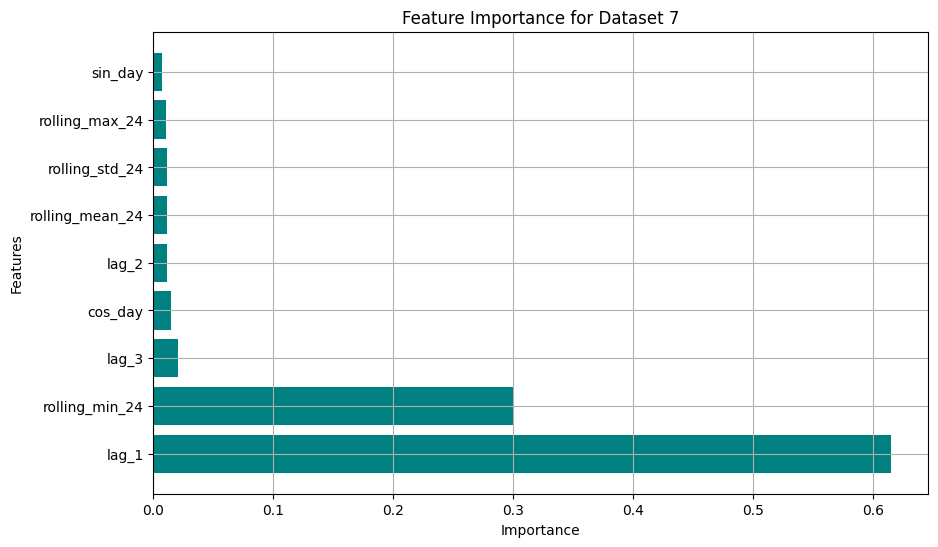

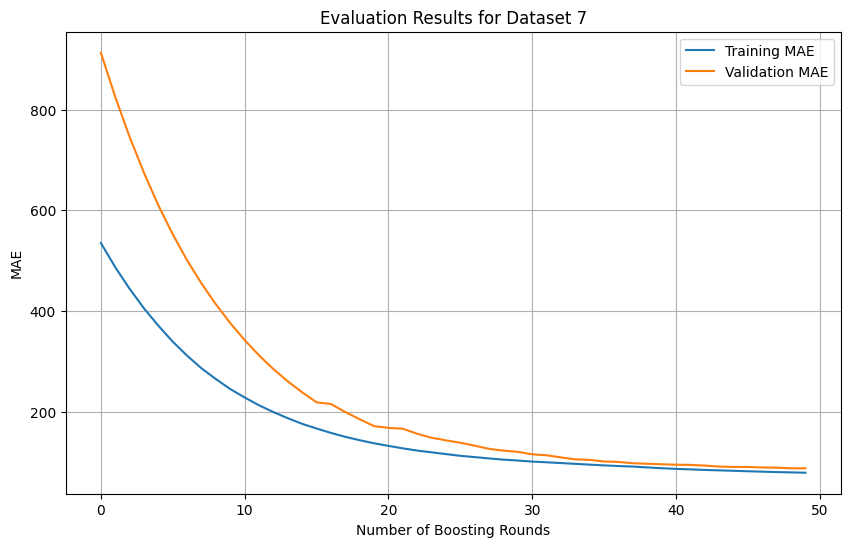

Dataset 7:
 Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0.5, 'reg_lambda': 1}
 Best k: 3
 Test Set MAE: 87.7678
 Precision: 0.4444, Recall: 0.4211, F1: 0.4324
--------------------------------------------------


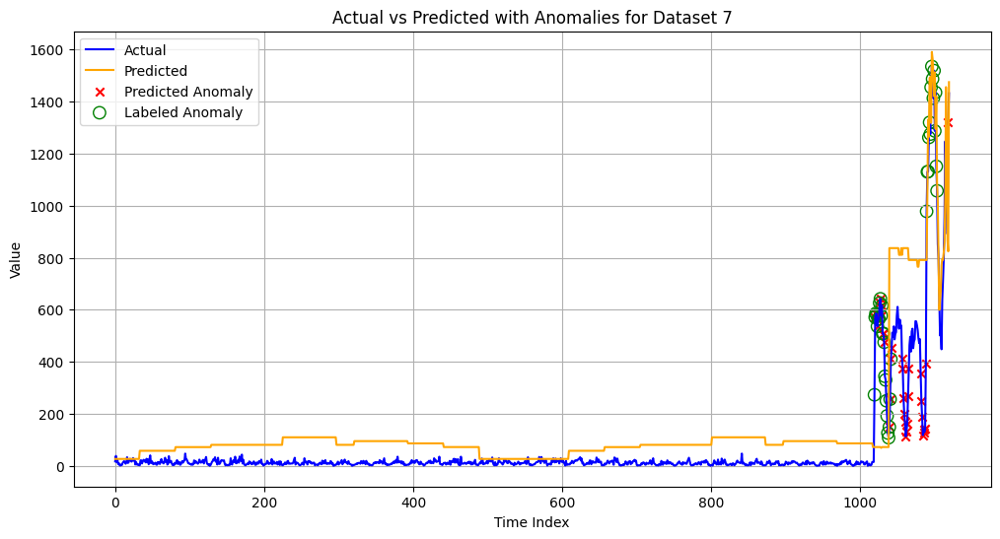

Dataset 7:
 Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0.5, 'reg_lambda': 1}
 Best k: 3
 Test Set MAE: 87.7678
 Precision: 0.4857, Recall: 0.4474, F1: 0.4658
--------------------------------------------------


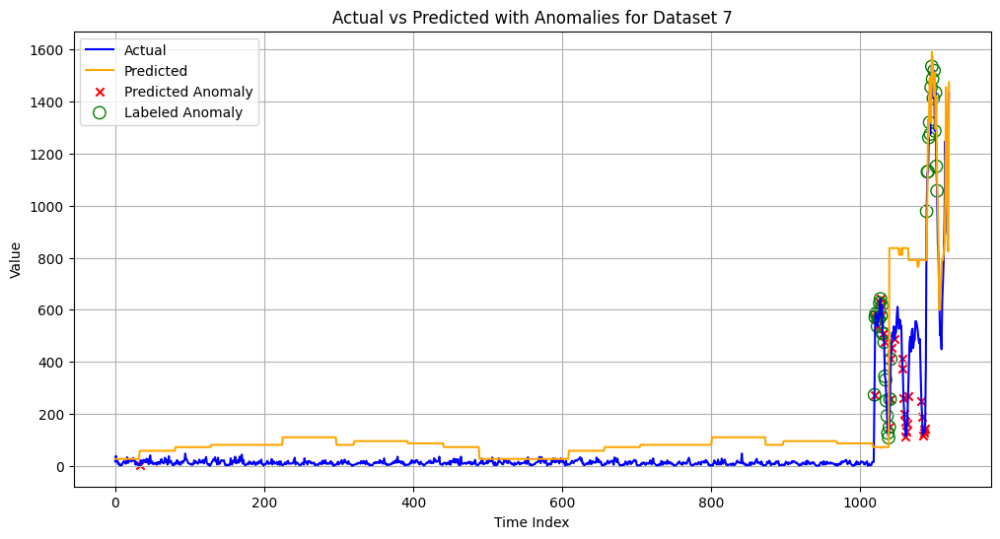

<ipython-input-4-4ae58c95129c>:11: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df.index = pd.date_range(start='2023-01-01', periods=len(df), freq='H')


Feature Importances:
lag_1: 0.7943
cos_day: 0.0393
lag_3: 0.0373
rolling_min_24: 0.0246
rolling_mean_24: 0.0229
rolling_std_24: 0.0226
sin_day: 0.0225
lag_2: 0.0183
rolling_max_24: 0.0182


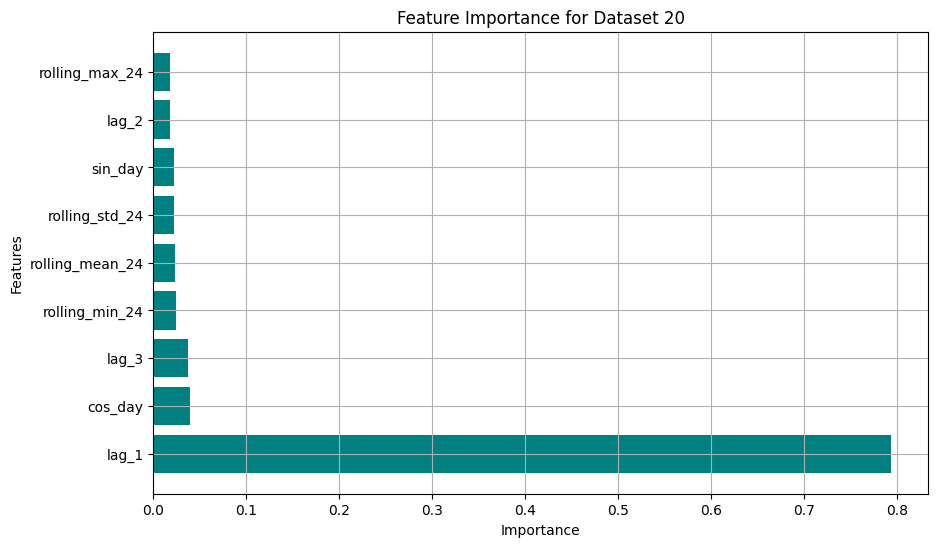

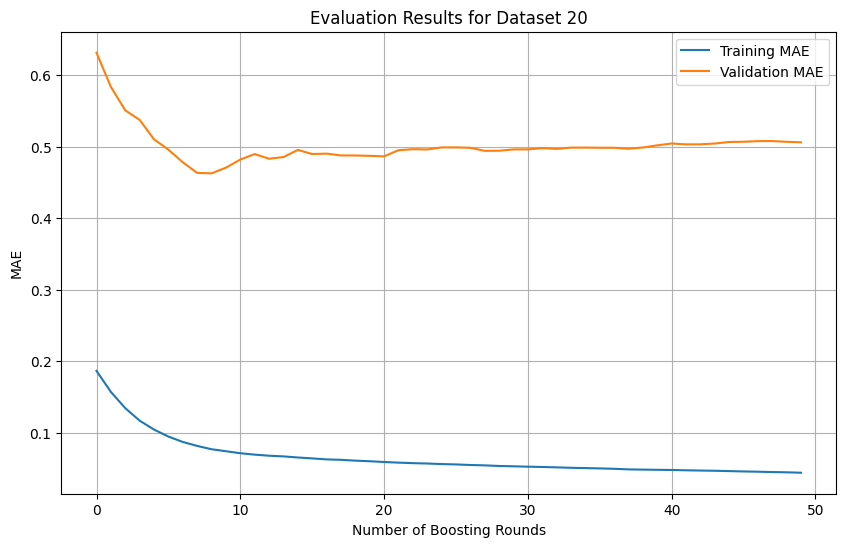

Dataset 20:
 Best Hyperparameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0, 'reg_lambda': 1}
 Best k: 3
 Test Set MAE: 0.5059
 Precision: 1.0000, Recall: 0.0303, F1: 0.0588
--------------------------------------------------


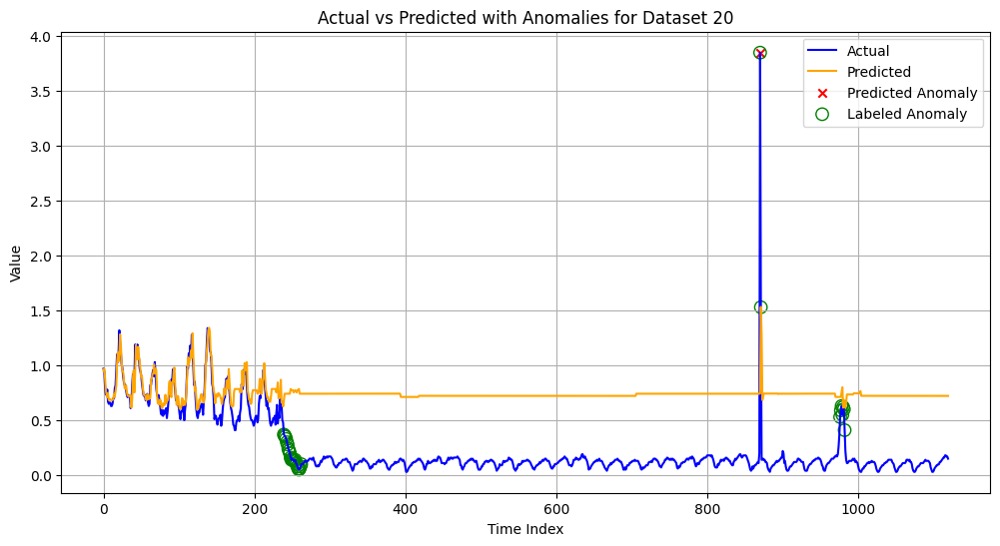

Dataset 20:
 Best Hyperparameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0, 'reg_lambda': 1}
 Best k: 3
 Test Set MAE: 0.5059
 Precision: 0.6667, Recall: 0.7273, F1: 0.6957
--------------------------------------------------


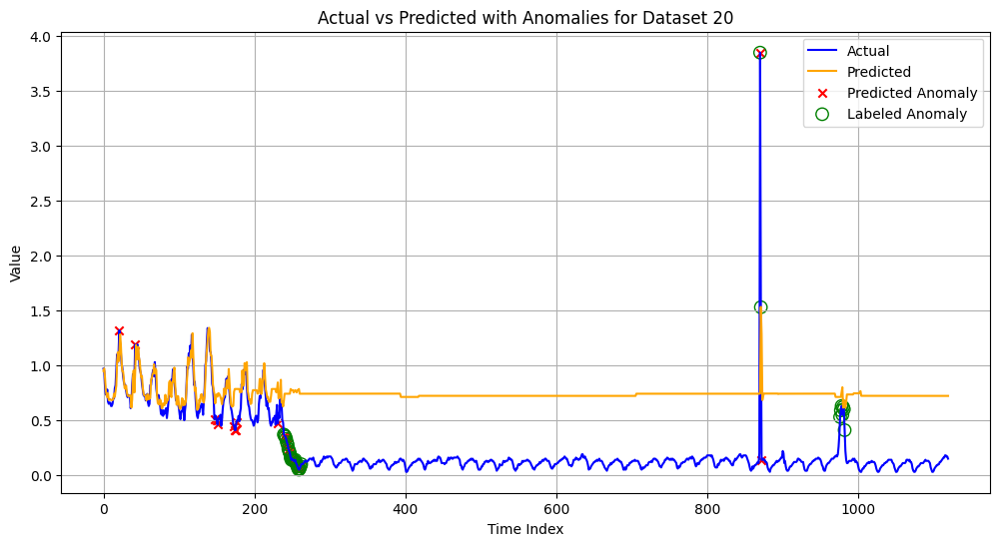

<ipython-input-4-4ae58c95129c>:11: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df.index = pd.date_range(start='2023-01-01', periods=len(df), freq='H')


Feature Importances:
lag_1: 0.7030
lag_2: 0.0991
sin_day: 0.0602
lag_3: 0.0402
rolling_min_24: 0.0322
cos_day: 0.0269
rolling_mean_24: 0.0144
rolling_std_24: 0.0130
rolling_max_24: 0.0110


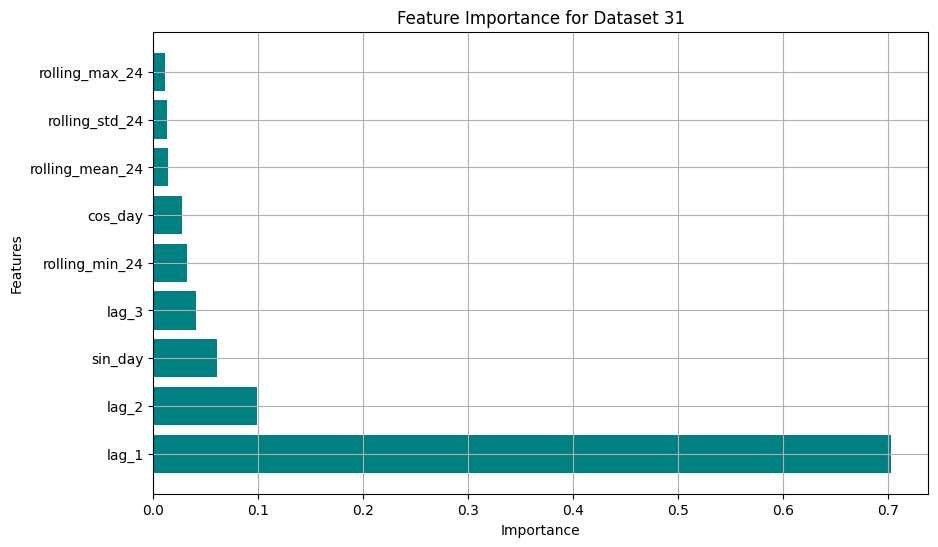

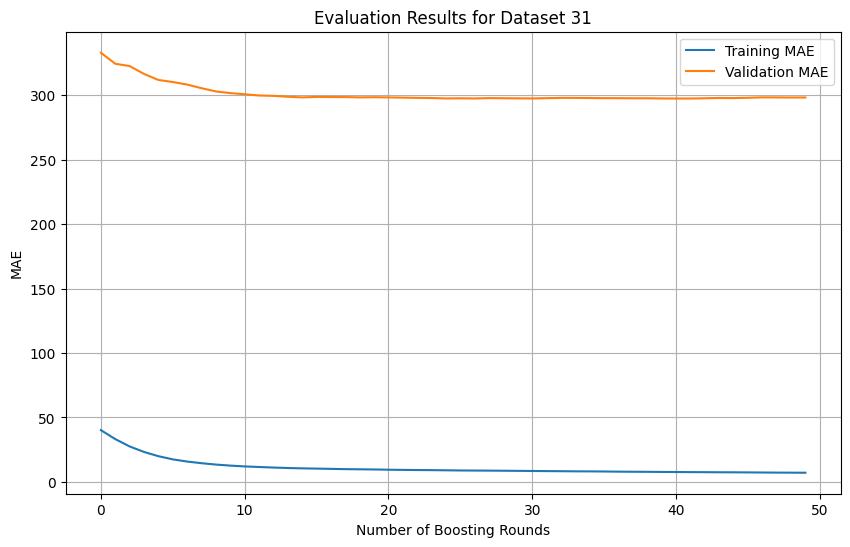

Dataset 31:
 Best Hyperparameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0.5, 'reg_lambda': 2}
 Best k: 2.5
 Test Set MAE: 298.1199
 Precision: 0.3864, Recall: 0.7083, F1: 0.5000
--------------------------------------------------


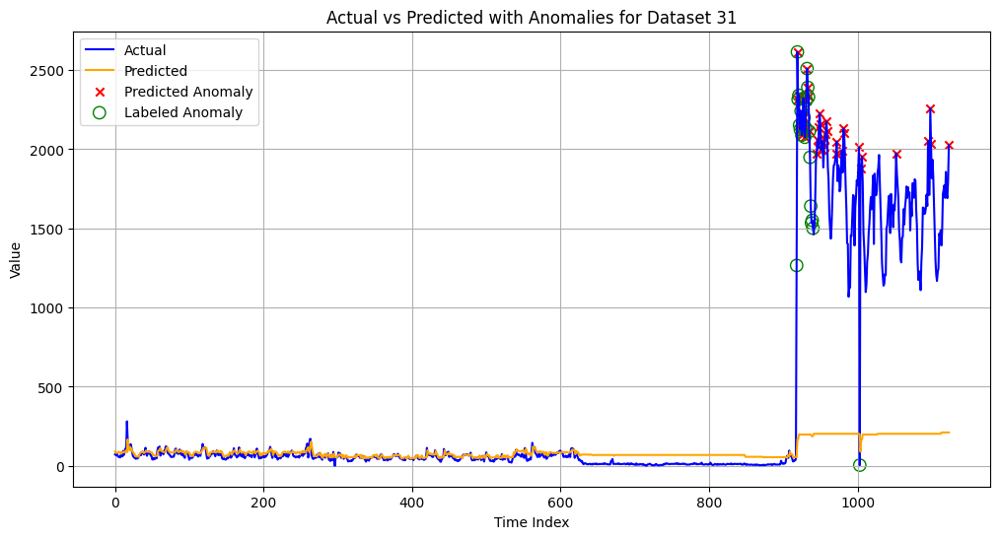

Dataset 31:
 Best Hyperparameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0.5, 'reg_lambda': 2}
 Best k: 3
 Test Set MAE: 298.1199
 Precision: 0.3898, Recall: 0.9583, F1: 0.5542
--------------------------------------------------


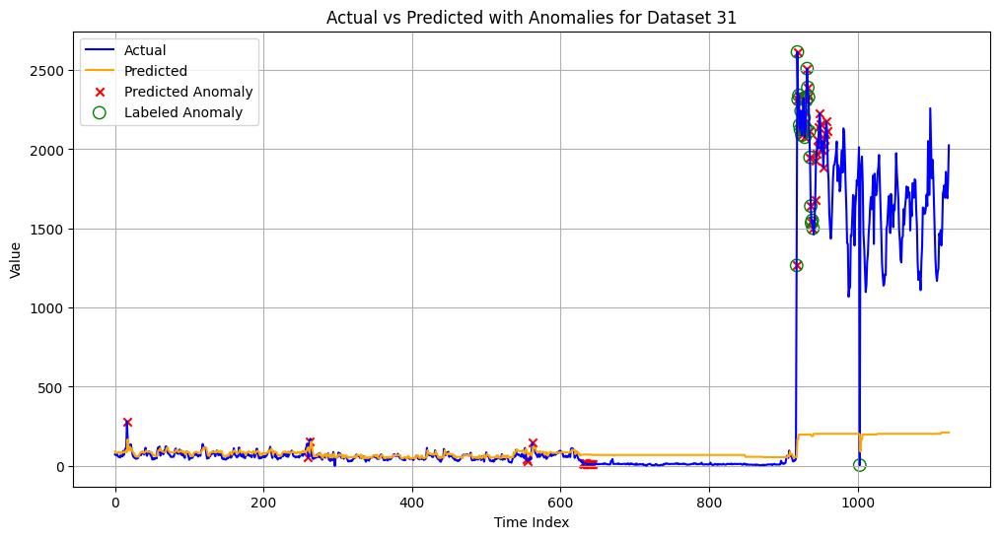

<ipython-input-4-4ae58c95129c>:11: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df.index = pd.date_range(start='2023-01-01', periods=len(df), freq='H')


Feature Importances:
lag_2: 0.5083
lag_1: 0.4046
rolling_min_24: 0.0170
rolling_std_24: 0.0158
lag_3: 0.0147
rolling_mean_24: 0.0133
sin_day: 0.0115
cos_day: 0.0109
rolling_max_24: 0.0039


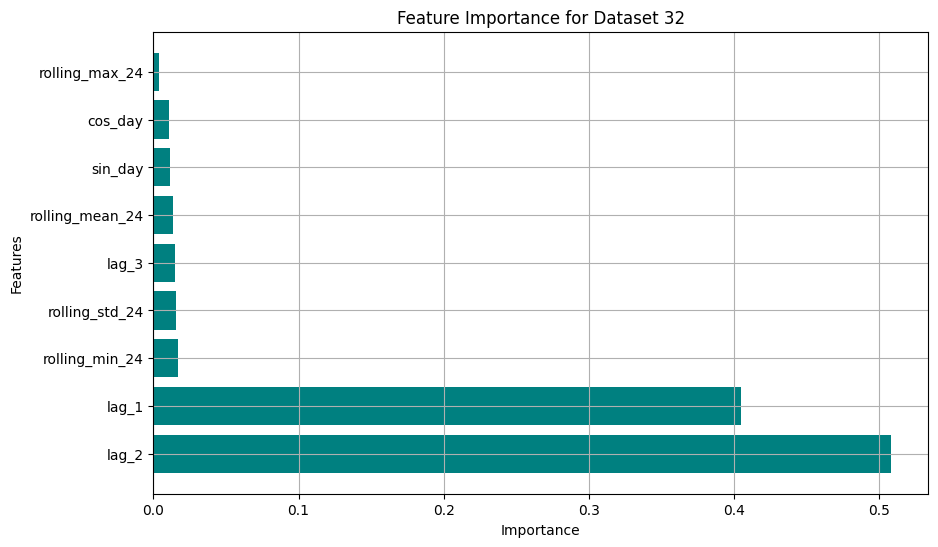

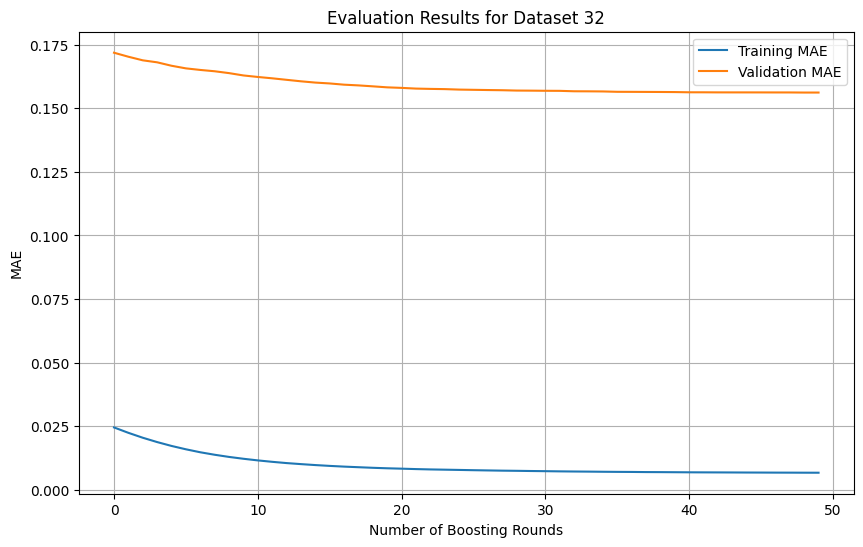

Dataset 32:
 Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0.1, 'reg_lambda': 2}
 Best k: 2
 Test Set MAE: 0.1562
 Precision: 0.3611, Recall: 0.8298, F1: 0.5032
--------------------------------------------------


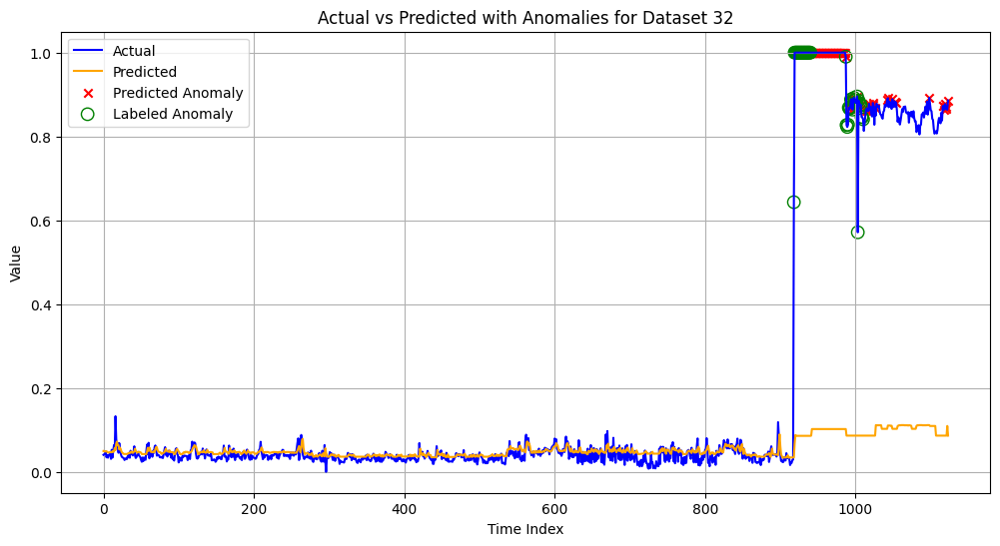

Dataset 32:
 Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0.1, 'reg_lambda': 2}
 Best k: 3
 Test Set MAE: 0.1562
 Precision: 0.3485, Recall: 0.4894, F1: 0.4071
--------------------------------------------------


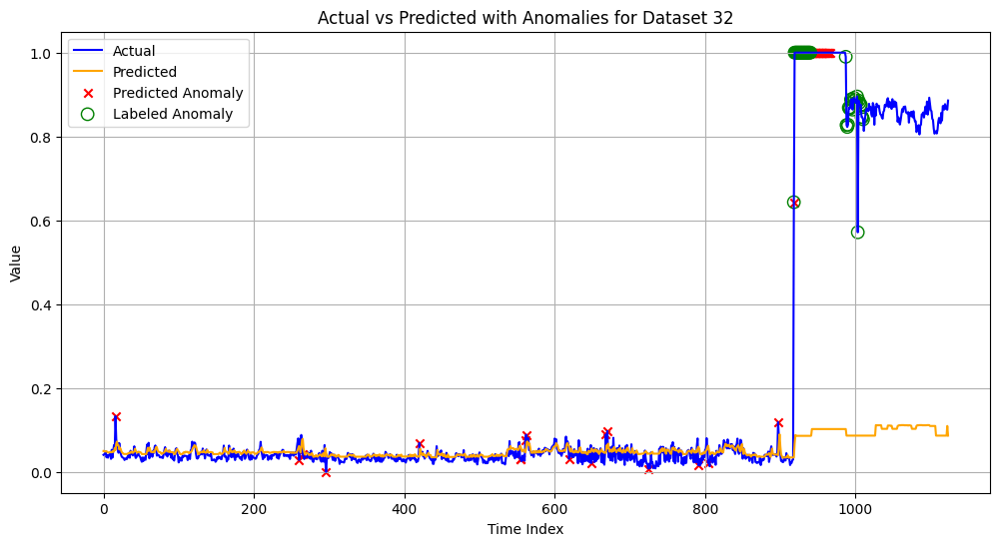

<ipython-input-4-4ae58c95129c>:11: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df.index = pd.date_range(start='2023-01-01', periods=len(df), freq='H')


Feature Importances:
lag_1: 0.4430
rolling_max_24: 0.1601
rolling_std_24: 0.1505
rolling_min_24: 0.1241
lag_2: 0.0460
rolling_mean_24: 0.0263
lag_3: 0.0260
cos_day: 0.0239
sin_day: 0.0000


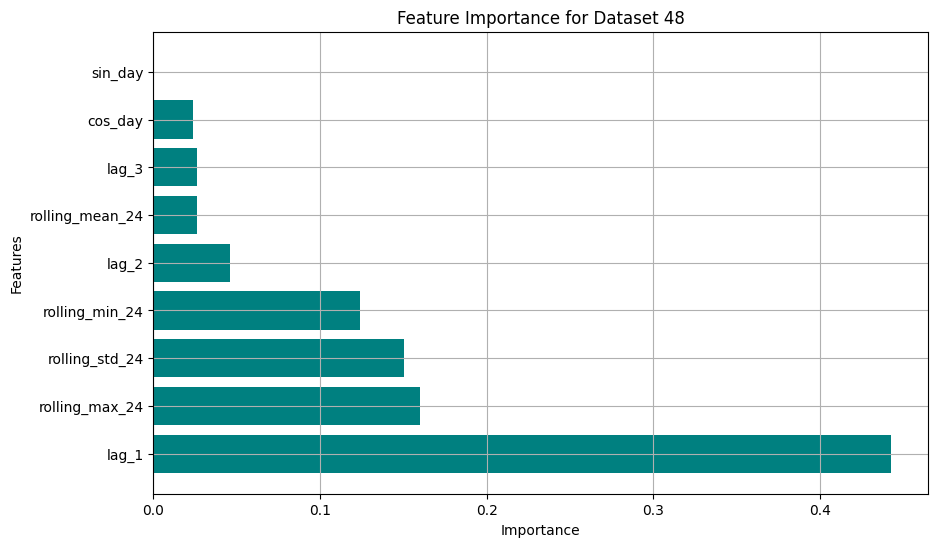

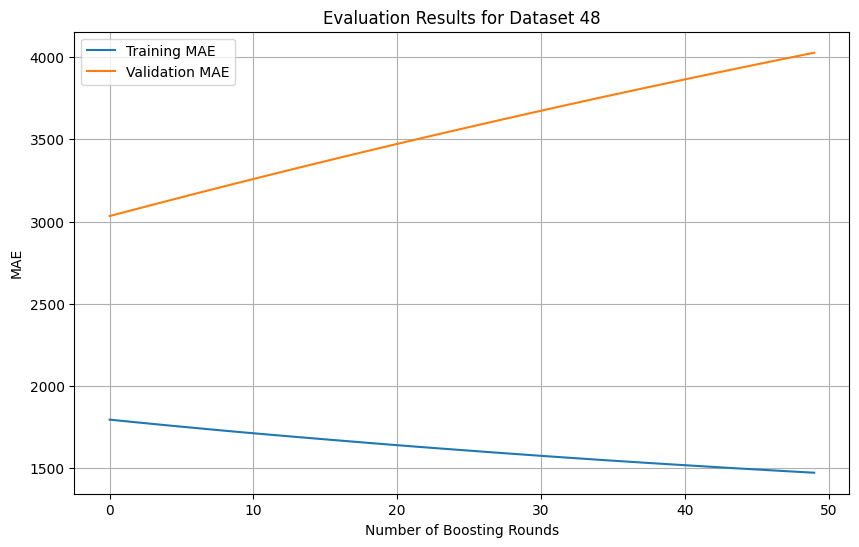

Dataset 48:
 Best Hyperparameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0.5, 'reg_lambda': 1.5}
 Best k: 1.5
 Test Set MAE: 4027.2418
 Precision: 0.0000, Recall: 0.0000, F1: 0.0000
--------------------------------------------------


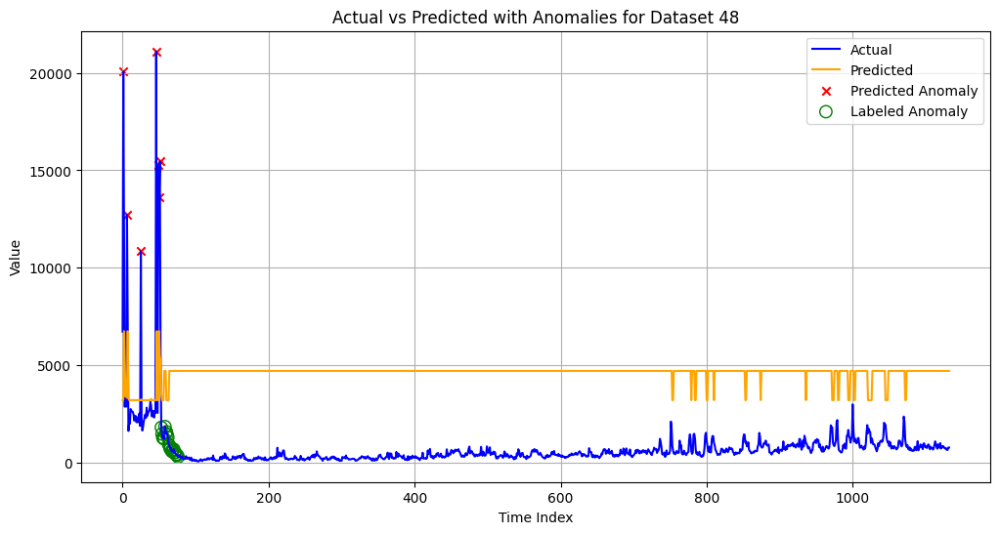

Dataset 48:
 Best Hyperparameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0.5, 'reg_lambda': 1.5}
 Best k: 3
 Test Set MAE: 4027.2418
 Precision: 0.0000, Recall: 0.0000, F1: 0.0000
--------------------------------------------------


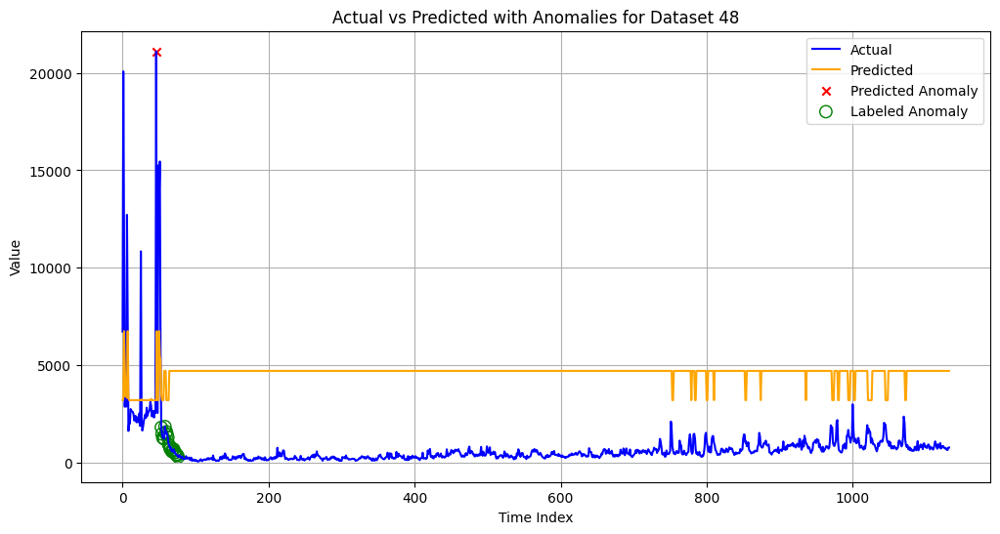

<ipython-input-4-4ae58c95129c>:11: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df.index = pd.date_range(start='2023-01-01', periods=len(df), freq='H')


Feature Importances:
lag_1: 0.6271
lag_3: 0.1309
lag_2: 0.0842
rolling_std_24: 0.0668
rolling_max_24: 0.0369
rolling_mean_24: 0.0317
sin_day: 0.0224
cos_day: 0.0000
rolling_min_24: 0.0000


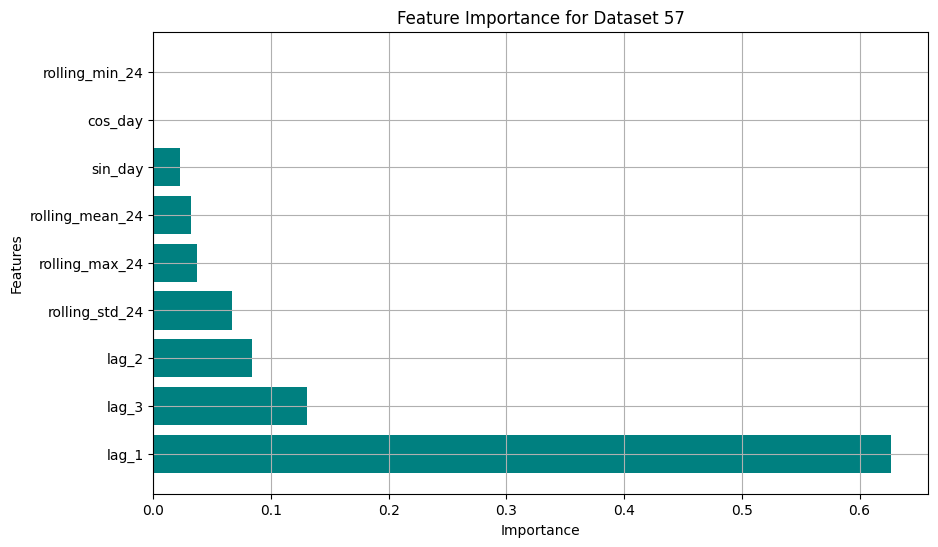

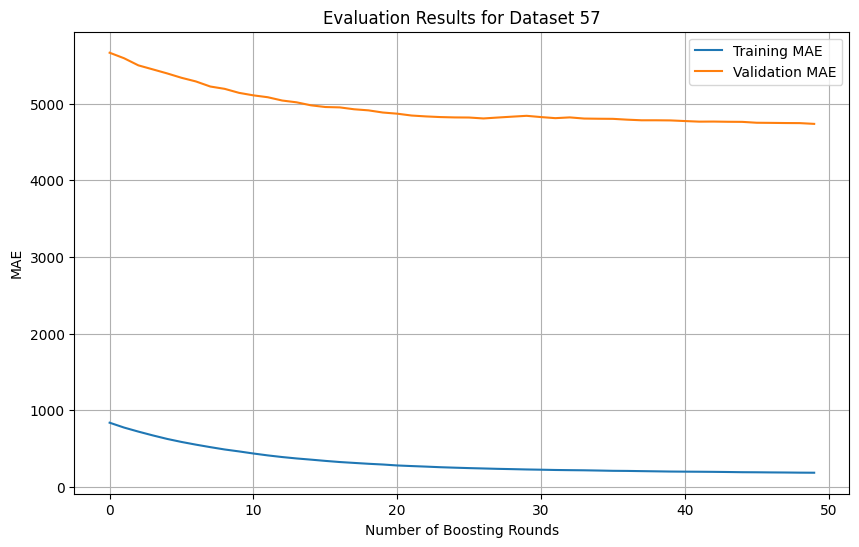

Dataset 57:
 Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0.1, 'reg_lambda': 1.5}
 Best k: 1.5
 Test Set MAE: 4735.6800
 Precision: 0.0000, Recall: 0.0000, F1: 0.0000
--------------------------------------------------


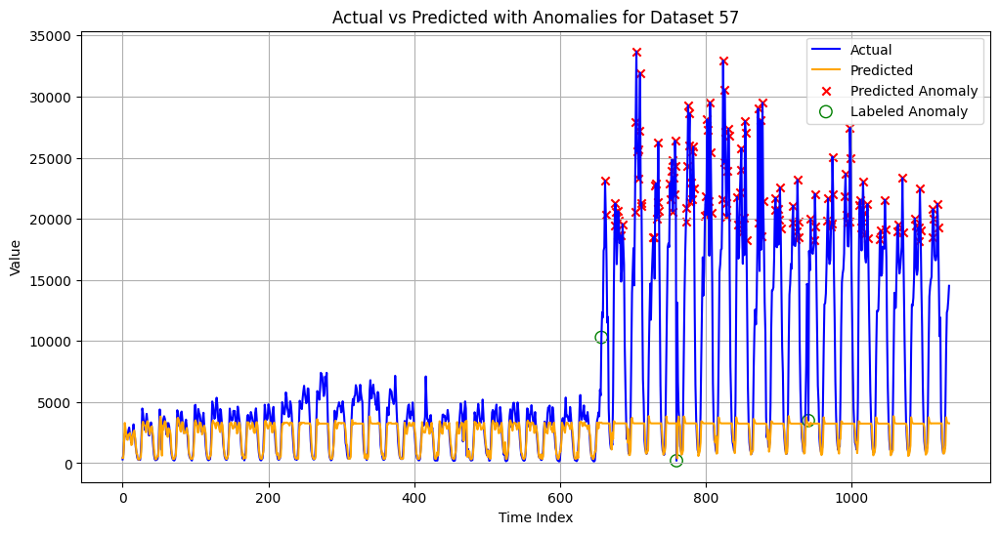

Dataset 57:
 Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0.1, 'reg_lambda': 1.5}
 Best k: 3
 Test Set MAE: 4735.6800
 Precision: 0.0118, Recall: 0.3333, F1: 0.0227
--------------------------------------------------


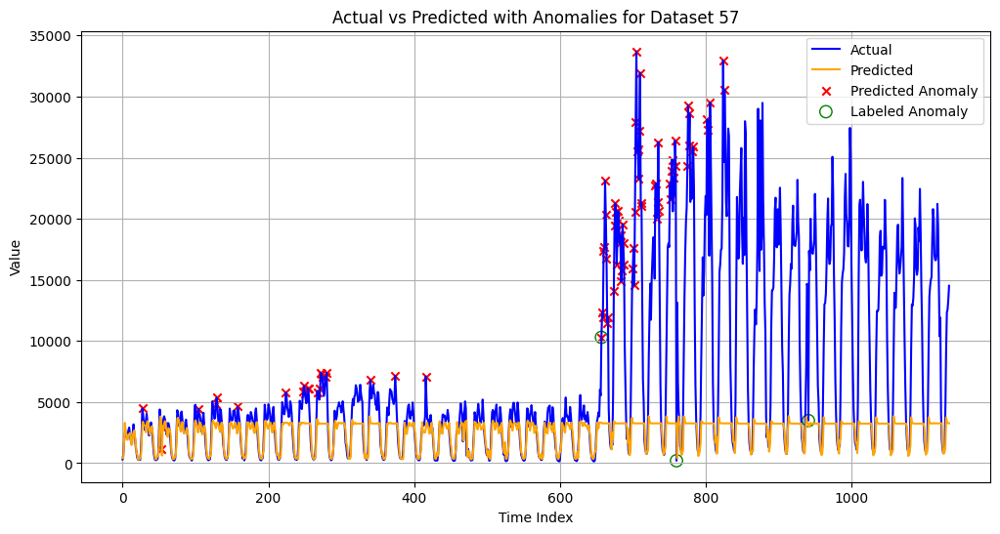

<ipython-input-4-4ae58c95129c>:11: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df.index = pd.date_range(start='2023-01-01', periods=len(df), freq='H')


Feature Importances:
cos_day: 0.1840
rolling_min_24: 0.1481
sin_day: 0.1325
rolling_max_24: 0.1079
lag_3: 0.0921
rolling_std_24: 0.0911
lag_1: 0.0846
rolling_mean_24: 0.0816
lag_2: 0.0780


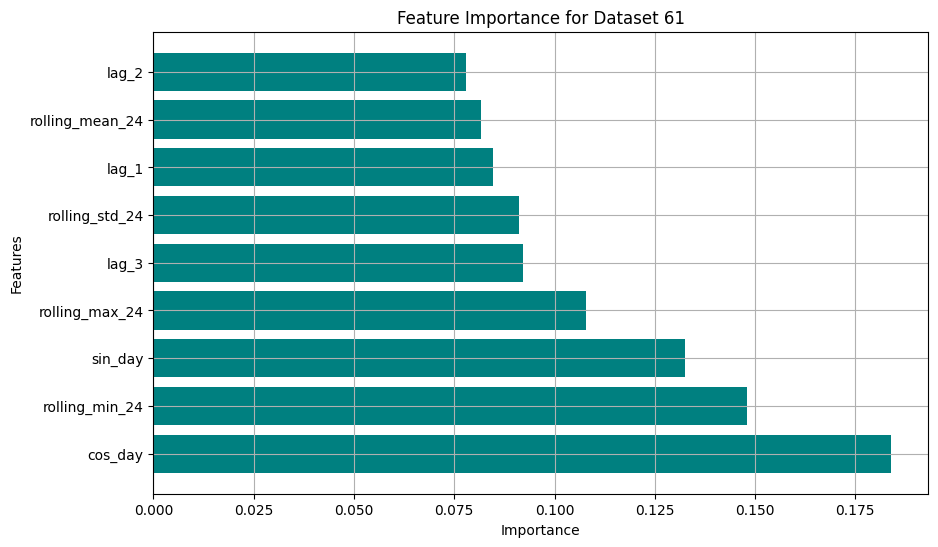

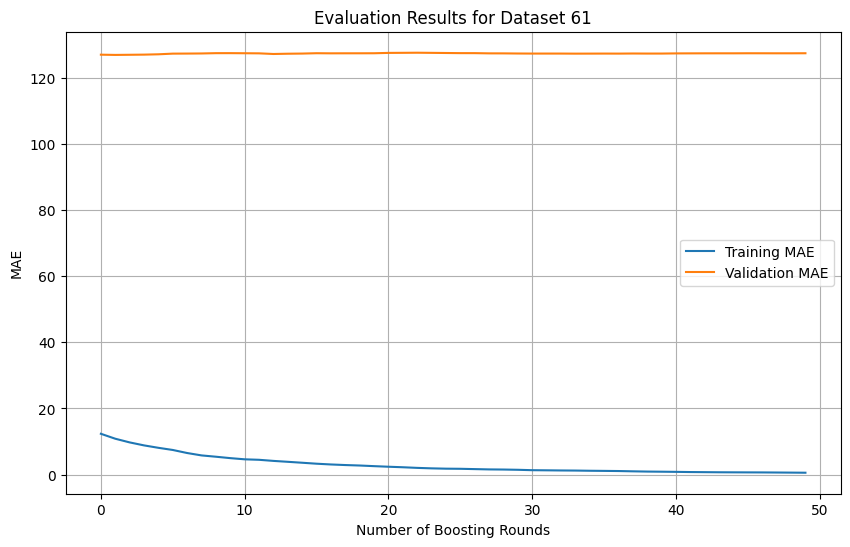

Dataset 61:
 Best Hyperparameters: {'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 50, 'reg_alpha': 0.1, 'reg_lambda': 1}
 Best k: 3
 Test Set MAE: 127.3746
 Precision: 0.0909, Recall: 0.0417, F1: 0.0571
--------------------------------------------------


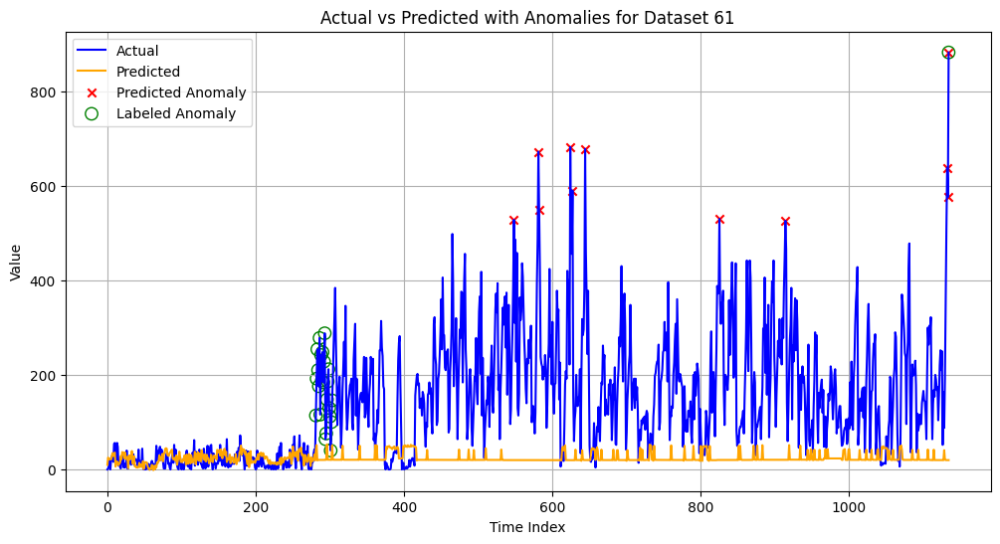

Dataset 61:
 Best Hyperparameters: {'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 50, 'reg_alpha': 0.1, 'reg_lambda': 1}
 Best k: 3
 Test Set MAE: 127.3746
 Precision: 0.2830, Recall: 0.6250, F1: 0.3896
--------------------------------------------------


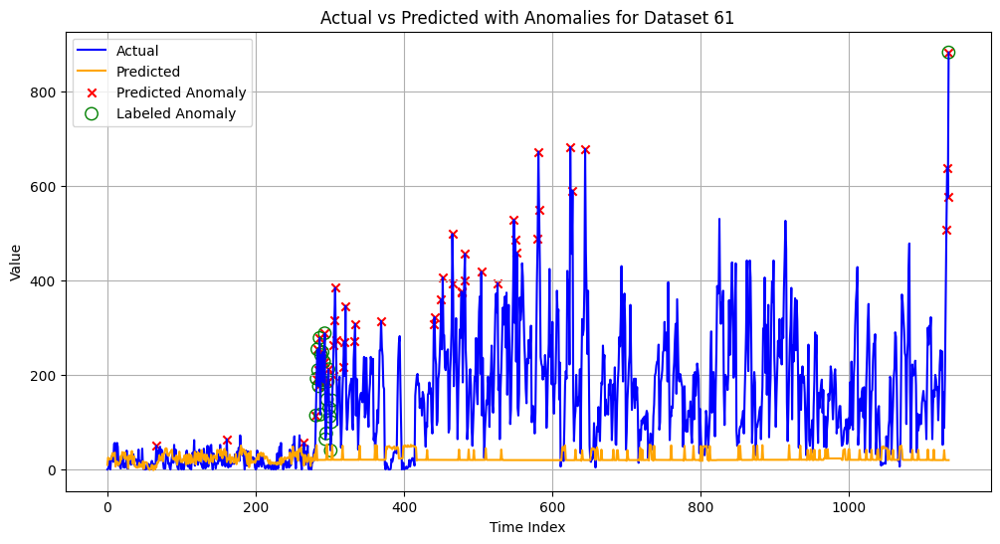


=== Average Best Metrics Across All Datasets ===
Average Precision SW = 0.33
Average Recall SW   = 0.29
Average F1-Score SW = 0.22
All F1 Scores SW: ['0.4324', '0.0588', '0.5000', '0.5032', '0.0000', '0.0000', '0.0571']

=== Average Best Metrics Across All Datasets ===
Average Precision DW = 0.31
Average Recall DW   = 0.51
Average F1-Score DW = 0.36
All F1 Scores DW: ['0.4658', '0.6957', '0.5542', '0.4071', '0.0000', '0.0227', '0.3896']


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, precision_score, recall_score, f1_score
from sklearn.model_selection import TimeSeriesSplit
import xgboost as xgb


A1B = [7,20,31,32,48,57,61]

# Hyperparameters for XGBoost
param_grid = {
    'n_estimators': [50],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'reg_alpha': [0, 0.1, 0.5],
    'reg_lambda': [1, 1.5, 2]
}

tscv = TimeSeriesSplit(n_splits=2)  # For time-series cross-validation

all_best_precisions_dw = []
all_best_recalls_dw = []
all_best_f1_scores_dw = []
all_best_precisions_sw = []
all_best_recalls_sw = []
all_best_f1_scores_sw = []


possible_ks = [1.5, 2, 2.5, 3]  # Διάφορες τιμές k για δοκιμή
possible_windows = [100, 200, 300, 500]  # Διάφορες τιμές rolling window

for i in A1B:
    df = dfsA1[i].copy()
    value_col = f"value_{i}"

    # Ensure the dataframe has 'label' and value_col
    if value_col not in df.columns or "label" not in df.columns:
        print(f"Dataset {i} does not have the required columns.")
        continue

    # Apply feature engineering
    df = feature_engineering(df, value_col, window_size=24)

    # Prepare the data
    features = [col for col in df.columns if col != 'label' and col != value_col]
    X = df[features].values
    y = df[value_col].values
    labels = df["label"].values  # Ground truth anomaly labels

    # Split data into train and test sets
    X_train, X_test, y_train, y_test, label_train, label_test = train_test_split(
        X, y, labels, test_size=0.8, shuffle=False
    )

    # Scale the features
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    # Define the XGBoost model
    model = XGBRegressor(random_state=42, eval_metric="mae")

    # Perform grid search
    grid_search = GridSearchCV(
        estimator=model,
        param_grid=param_grid,
        scoring='neg_mean_absolute_error',
        cv = tscv,
        n_jobs=-1,
        return_train_score=True
    )
    grid_search.fit(
    X_train,
    y_train,
    eval_set=[(X_train, y_train), (X_test, y_test)],
    verbose=False
    )

#=================================================================================================================
# FEATURE IMPORTANCE
#=================================================================================================================

    # Retrieve the best model
    best_model = grid_search.best_estimator_

    # Extract evaluation results
    evals_result = best_model.evals_result()

    # Extract MAE for training and validation
    train_mae = evals_result["validation_0"]["mae"]  # Training MAE
    test_mae = evals_result["validation_1"]["mae"]   # Validation MAE

    # Predict on test set
    y_pred = best_model.predict(X_test)

    # Compute residuals
    residuals = np.abs(y_test - y_pred)

    # Feature Importance
    feature_importances = best_model.feature_importances_
    sorted_indices = np.argsort(feature_importances)[::-1]
    print("Feature Importances:")
    for idx in sorted_indices:
        print(f"{features[idx]}: {feature_importances[idx]:.4f}")

    # Plot feature importance
    plt.figure(figsize=(10, 6))
    plt.barh([features[idx] for idx in sorted_indices], feature_importances[sorted_indices], color='teal')
    plt.title(f"Feature Importance for Dataset {i}")
    plt.xlabel("Importance")
    plt.ylabel("Features")
    plt.grid()
    plt.show()

#=================================================================================================================
# TRUE AND PREDICTED AND LOSSES PLOTS
#=================================================================================================================

    # Plot the evaluation results
    plt.figure(figsize=(10, 6))
    plt.plot(train_mae, label="Training MAE")
    plt.plot(test_mae, label="Validation MAE")
    plt.xlabel("Number of Boosting Rounds")
    plt.ylabel("MAE")
    plt.title(f"Evaluation Results for Dataset {i}")
    plt.legend()
    plt.grid(True)
    plt.show()

#=================================================================================================================
# STATIC WINDOW
#=================================================================================================================

    # Optimize k for the static threshold
    best_f1_sw = -1
    best_k_sw = None
    best_precision_sw = 0
    best_recall_sw = 0
    best_predicted_anomalies_sw = None

    for k_sw in possible_ks:
        threshold_sw = np.mean(residuals) + k_sw * np.std(residuals)
        predicted_anomalies_sw = (residuals > threshold_sw).astype(int)

        precision_sw = precision_score(label_test, predicted_anomalies_sw, zero_division=0)
        recall_sw = recall_score(label_test, predicted_anomalies_sw, zero_division=0)
        f1_sw = f1_score(label_test, predicted_anomalies_sw, zero_division=0)

        if f1_sw > best_f1_sw:
            best_f1_sw = f1_sw
            best_k_sw = k_sw
            best_precision_sw = precision_sw
            best_recall_sw = recall_sw
            best_predicted_anomalies_sw = predicted_anomalies_sw

    all_best_precisions_sw.append(best_precision_sw)
    all_best_recalls_sw.append(best_recall_sw)
    all_best_f1_scores_sw.append(best_f1_sw)

    # Print metrics
    print(f"Dataset {i}:")
    print(f" Best Hyperparameters: {grid_search.best_params_}")
    print(f" Best k: {best_k_sw}")
    print(f" Test Set MAE: {mean_absolute_error(y_test, y_pred):.4f}")
    print(f" Precision: {best_precision_sw:.4f}, Recall: {best_recall_sw:.4f}, F1: {best_f1_sw:.4f}")
    print("-" * 50)

    # Plot actual vs predicted and highlight anomalies
    fig, ax = plt.subplots(figsize=(12, 6))

    # Plot actual and predicted values over time
    ax.plot(range(len(y_test)), y_test, label='Actual', color='blue')
    ax.plot(range(len(y_test)), y_pred, label='Predicted', color='orange')

    # Highlight predicted anomalies (red)
    pred_anomaly_indices = np.where(best_predicted_anomalies_sw == 1)[0]
    ax.scatter(pred_anomaly_indices, y_test[pred_anomaly_indices], color='red', label='Predicted Anomaly', marker='x')

    # Highlight actual labeled anomalies (green)
    actual_anomaly_indices = np.where(label_test == 1)[0]
    ax.scatter(actual_anomaly_indices, y_test[actual_anomaly_indices], color='green', label='Labeled Anomaly', marker='o', facecolors='none', s=80)

    ax.set_title(f"Actual vs Predicted with Anomalies for Dataset {i}")
    ax.set_xlabel("Time Index")
    ax.set_ylabel("Value")
    ax.legend()
    ax.grid(True)
    plt.show()

#=================================================================================================================
# DYNAMIC WINDOW
#=================================================================================================================

    best_f1__dw = -1
    best_k_dw = None
    best_window_dw = None
    best_precision_dw = 0.0
    best_recall_dw = 0.0
    best_predicted_anomalies_dw = None

    for window_dw in possible_windows:
        # Υπολογισμός κυλιόμενων στατιστικών για το “dynamic threshold”
        rolling_residuals_dw = pd.Series(residuals).rolling(window=window_dw, min_periods=1)
        mean_residuals_dw = rolling_residuals_dw.mean()
        std_residuals_dw = rolling_residuals_dw.std()

        for k_dw in possible_ks:
            # Ορισμός ορίου: mean + k * std
            threshold_dw = mean_residuals_dw + k_dw * std_residuals_dw
            predicted_anomalies_dw = (residuals.flatten() > threshold_dw).astype(int)

            precision_k_dw = precision_score(label_test, predicted_anomalies_dw)
            recall_k_dw = recall_score(label_test, predicted_anomalies_dw)
            f1_k_dw = f1_score(label_test, predicted_anomalies_dw)

            if f1_k_dw > best_f1__dw:
                best_f1_dw = f1_k_dw
                best_k_dw = k_dw
                best_window_dw = window_dw
                best_precision_dw = precision_k_dw
                best_recall_dw = recall_k_dw
                best_predicted_anomalies_dw = predicted_anomalies_dw

    # Αποθήκευση καλύτερων τιμών για το συγκεκριμένο dataset
    all_best_precisions_dw.append(best_precision_dw)
    all_best_recalls_dw.append(best_recall_dw)
    all_best_f1_scores_dw.append(best_f1_dw)

    # Print metrics
    print(f"Dataset {i}:")
    print(f" Best Hyperparameters: {grid_search.best_params_}")
    print(f" Best k: {best_k_dw}")
    print(f" Test Set MAE: {mean_absolute_error(y_test, y_pred):.4f}")
    print(f" Precision: {best_precision_dw:.4f}, Recall: {best_recall_dw:.4f}, F1: {best_f1_dw:.4f}")
    print("-" * 50)

    # Plot actual vs predicted and highlight anomalies
    fig, ax = plt.subplots(figsize=(12, 6))

    # Plot actual and predicted values over time
    ax.plot(range(len(y_test)), y_test, label='Actual', color='blue')
    ax.plot(range(len(y_test)), y_pred, label='Predicted', color='orange')

    # Highlight predicted anomalies (red)
    pred_anomaly_indices = np.where(best_predicted_anomalies_dw == 1)[0]
    ax.scatter(pred_anomaly_indices, y_test[pred_anomaly_indices], color='red', label='Predicted Anomaly', marker='x')

    # Highlight actual labeled anomalies (green)
    actual_anomaly_indices = np.where(label_test == 1)[0]
    ax.scatter(actual_anomaly_indices, y_test[actual_anomaly_indices], color='green', label='Labeled Anomaly', marker='o', facecolors='none', s=80)

    ax.set_title(f"Actual vs Predicted with Anomalies for Dataset {i}")
    ax.set_xlabel("Time Index")
    ax.set_ylabel("Value")
    ax.legend()
    ax.grid(True)
    plt.show()

#=================================================================================================================
# AVERAGE SCORES
#=================================================================================================================

average_precision_sw = np.mean(all_best_precisions_sw)
average_recall_sw = np.mean(all_best_recalls_sw)
average_f1_score_sw = np.mean(all_best_f1_scores_sw)

print("\n=== Average Best Metrics Across All Datasets ===")
print(f"Average Precision SW = {average_precision_sw:.2f}")
print(f"Average Recall SW   = {average_recall_sw:.2f}")
print(f"Average F1-Score SW = {average_f1_score_sw:.2f}")
formatted_scores_sw = [f"{score:.4f}" for score in all_best_f1_scores_sw]
print(f"All F1 Scores SW: {formatted_scores_sw}")


average_precision_dw = np.mean(all_best_precisions_dw)
average_recall_dw = np.mean(all_best_recalls_dw)
average_f1_score_dw = np.mean(all_best_f1_scores_dw)

print("\n=== Average Best Metrics Across All Datasets ===")
print(f"Average Precision DW = {average_precision_dw:.2f}")
print(f"Average Recall DW   = {average_recall_dw:.2f}")
print(f"Average F1-Score DW = {average_f1_score_dw:.2f}")
formatted_scores_dw = [f"{score:.4f}" for score in all_best_f1_scores_dw]
print(f"All F1 Scores DW: {formatted_scores_dw}")


<ipython-input-4-4ae58c95129c>:11: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df.index = pd.date_range(start='2023-01-01', periods=len(df), freq='H')


Feature Importances:
lag_1: 0.5707
rolling_max_24: 0.0853
rolling_std_24: 0.0802
lag_2: 0.0752
rolling_min_24: 0.0506
lag_3: 0.0476
sin_day: 0.0420
rolling_mean_24: 0.0306
cos_day: 0.0178


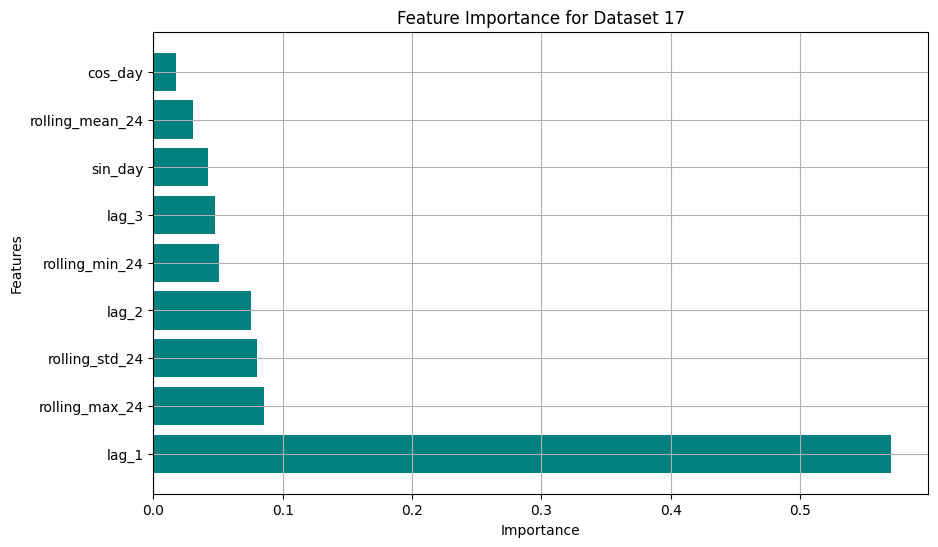

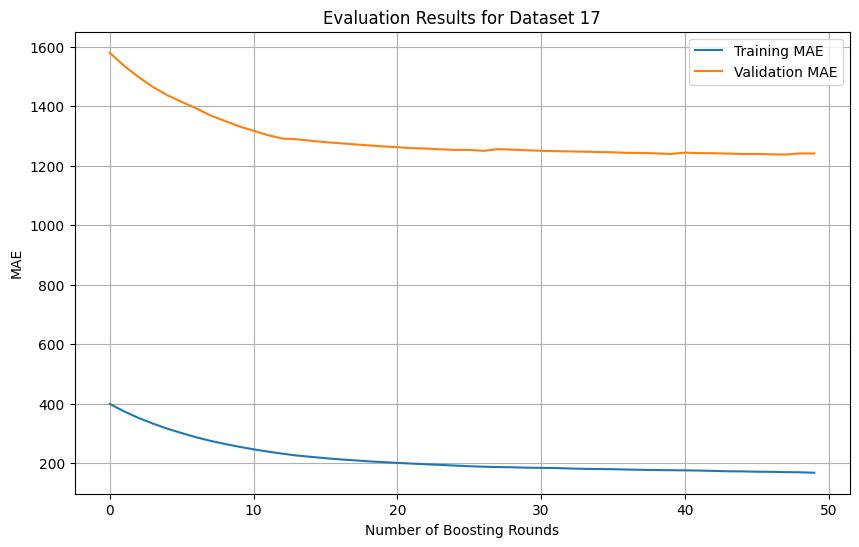

Dataset 17:
 Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0.5, 'reg_lambda': 1}
 Best k: 1.5
 Test Set MAE: 1241.0804
 Precision: 1.0000, Recall: 0.5066, F1: 0.6725
--------------------------------------------------


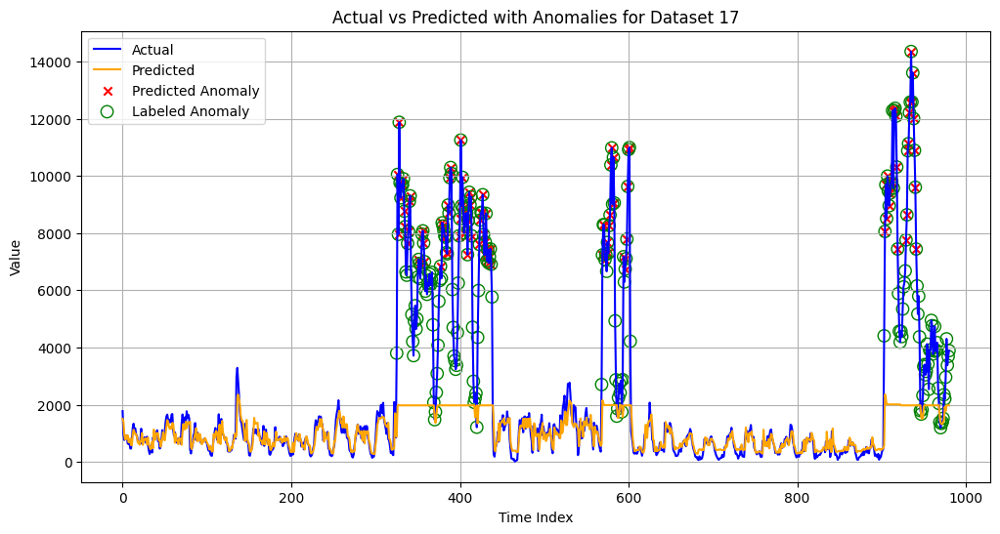

Dataset 17:
 Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0.5, 'reg_lambda': 1}
 Best k: 3
 Test Set MAE: 1241.0804
 Precision: 0.9153, Recall: 0.2379, F1: 0.3776
--------------------------------------------------


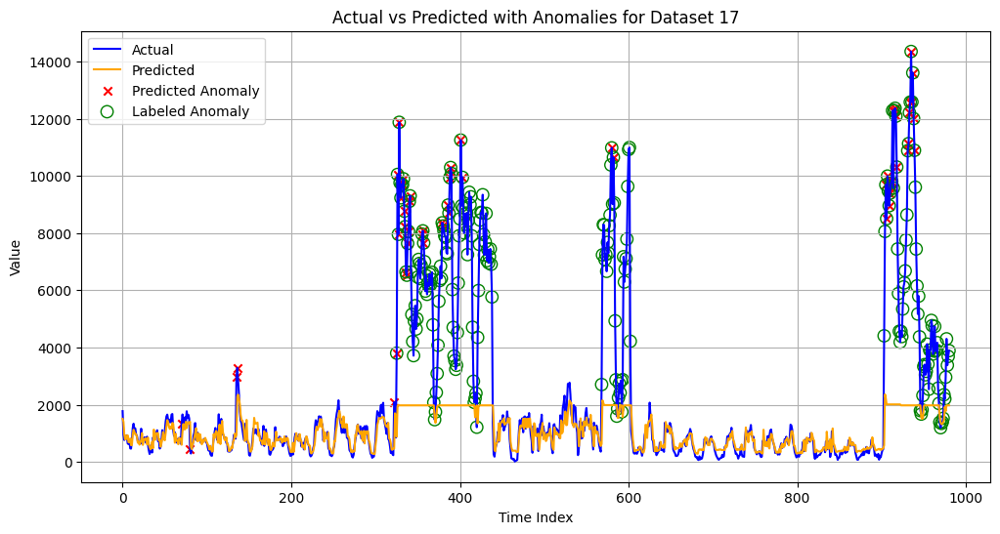

<ipython-input-4-4ae58c95129c>:11: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df.index = pd.date_range(start='2023-01-01', periods=len(df), freq='H')


Feature Importances:
lag_1: 0.5398
rolling_max_24: 0.0954
lag_2: 0.0829
rolling_std_24: 0.0727
rolling_mean_24: 0.0506
cos_day: 0.0480
sin_day: 0.0450
lag_3: 0.0443
rolling_min_24: 0.0213


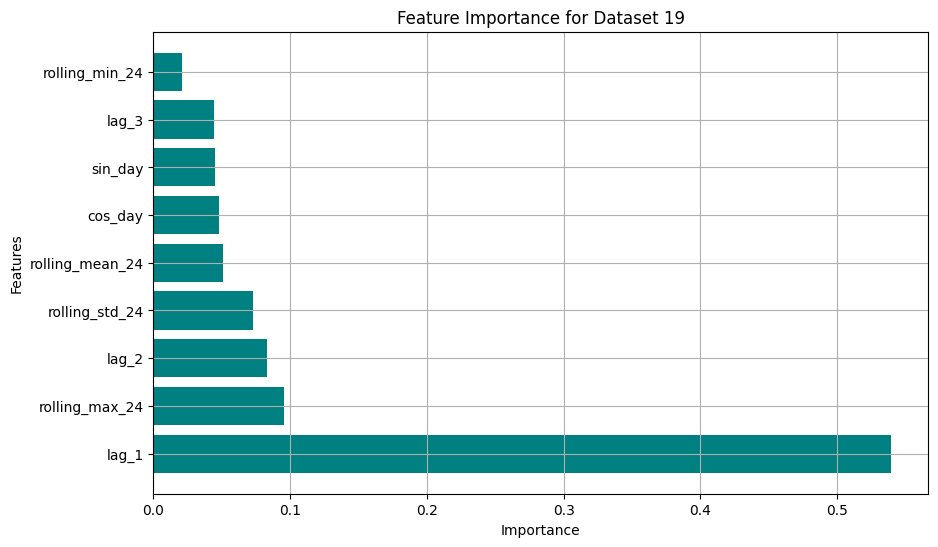

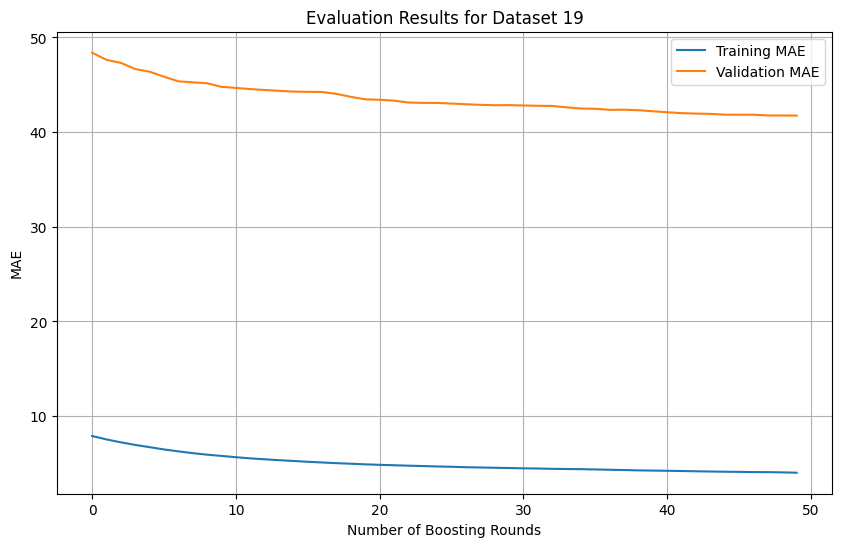

Dataset 19:
 Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0.5, 'reg_lambda': 2}
 Best k: 1.5
 Test Set MAE: 41.7398
 Precision: 1.0000, Recall: 0.4449, F1: 0.6159
--------------------------------------------------


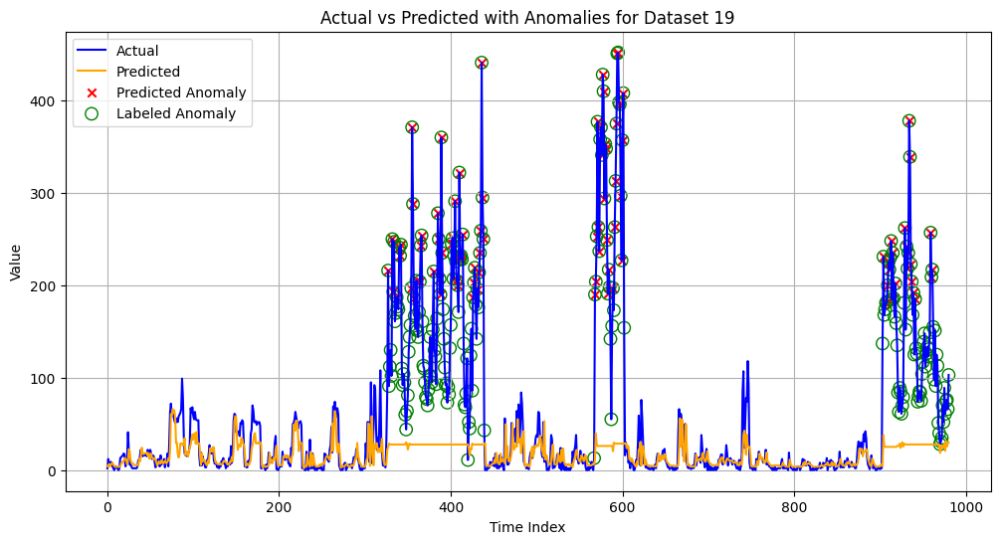

Dataset 19:
 Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0.5, 'reg_lambda': 2}
 Best k: 3
 Test Set MAE: 41.7398
 Precision: 0.7761, Recall: 0.2291, F1: 0.3537
--------------------------------------------------


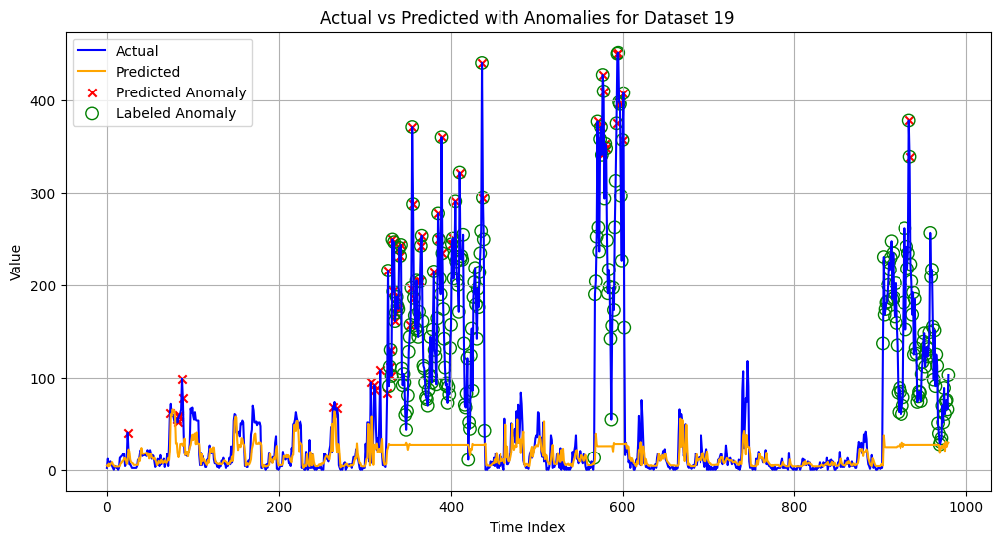

<ipython-input-4-4ae58c95129c>:11: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df.index = pd.date_range(start='2023-01-01', periods=len(df), freq='H')


Feature Importances:
lag_1: 0.2792
rolling_max_24: 0.2362
rolling_std_24: 0.1258
cos_day: 0.0899
lag_3: 0.0871
rolling_mean_24: 0.0797
lag_2: 0.0795
rolling_min_24: 0.0226
sin_day: 0.0000


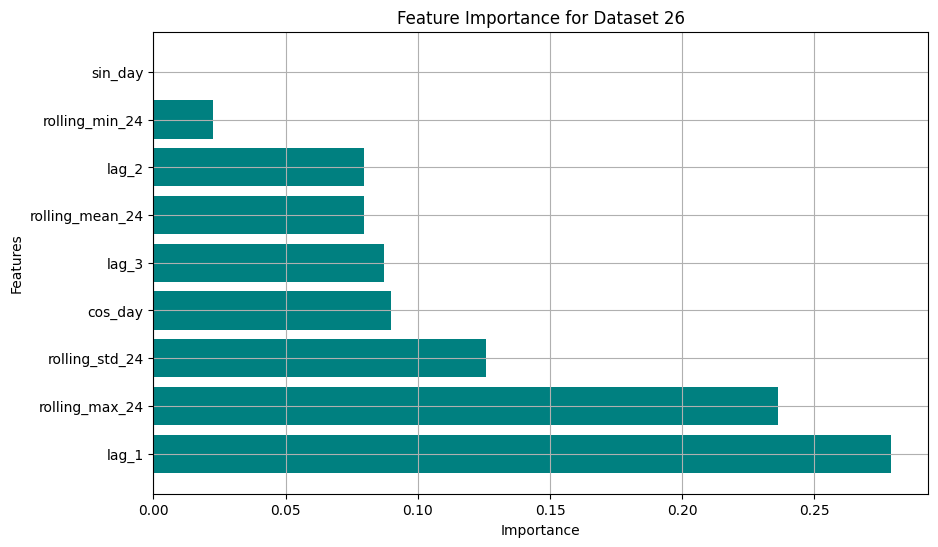

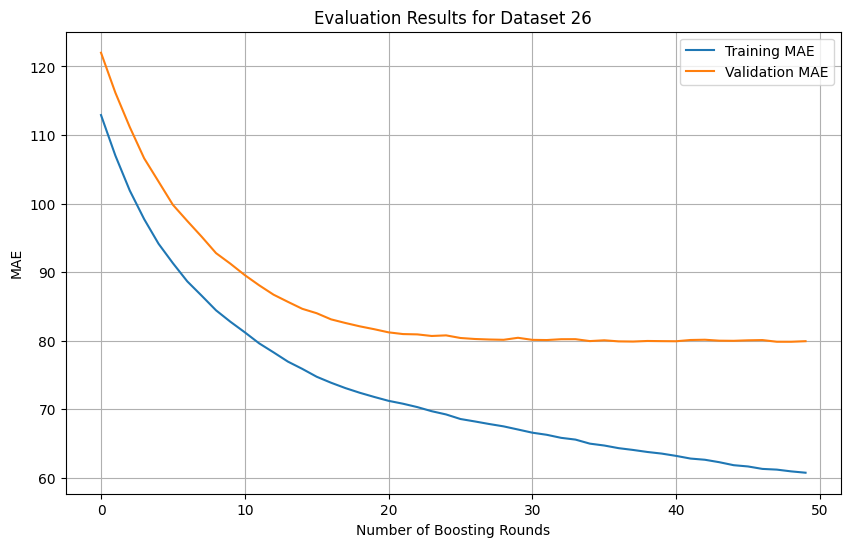

Dataset 26:
 Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0.1, 'reg_lambda': 1.5}
 Best k: 1.5
 Test Set MAE: 79.9381
 Precision: 0.0156, Recall: 0.0133, F1: 0.0144
--------------------------------------------------


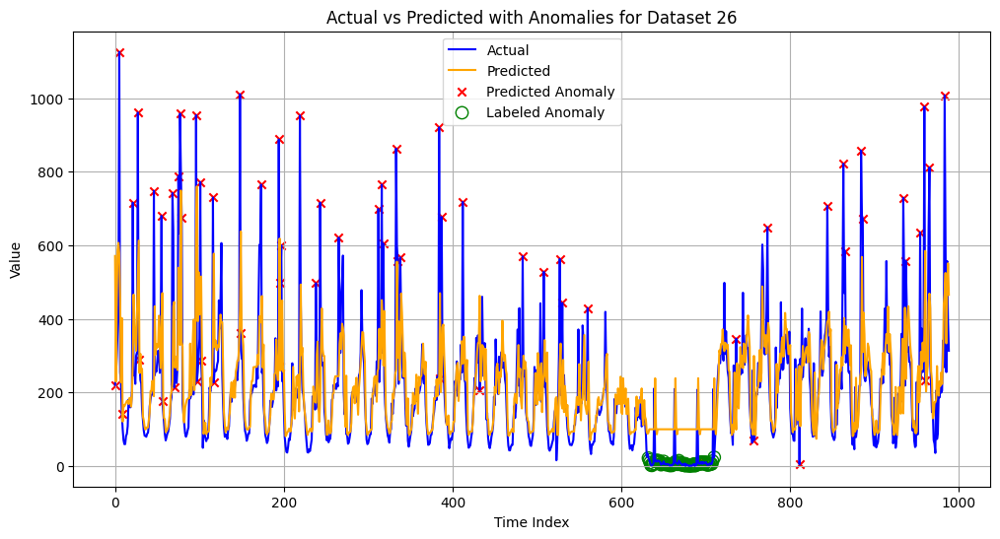

Dataset 26:
 Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0.1, 'reg_lambda': 1.5}
 Best k: 3
 Test Set MAE: 79.9381
 Precision: 0.0000, Recall: 0.0000, F1: 0.0000
--------------------------------------------------


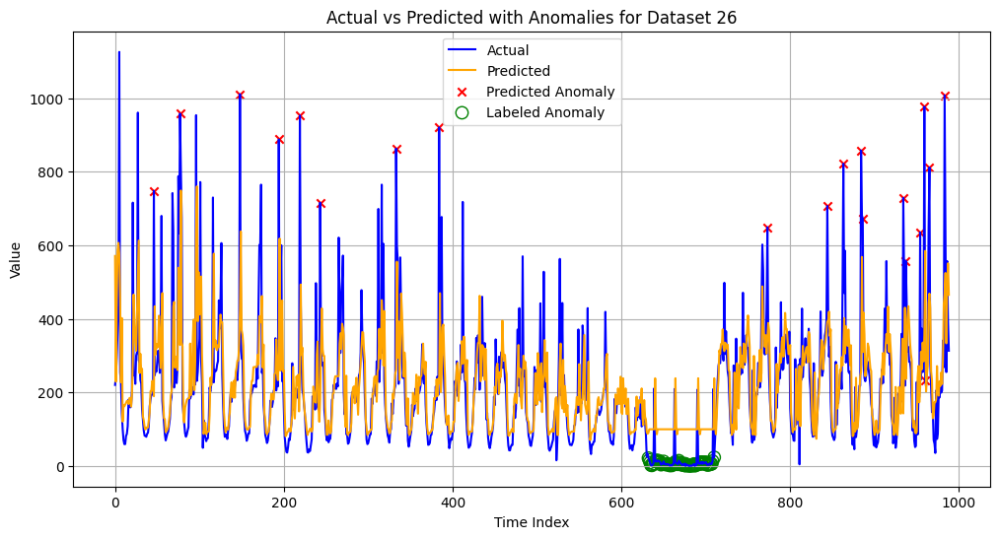

<ipython-input-4-4ae58c95129c>:11: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df.index = pd.date_range(start='2023-01-01', periods=len(df), freq='H')


Feature Importances:
lag_1: 0.6296
rolling_max_24: 0.0782
lag_2: 0.0628
rolling_min_24: 0.0599
rolling_std_24: 0.0437
sin_day: 0.0399
rolling_mean_24: 0.0290
cos_day: 0.0288
lag_3: 0.0282


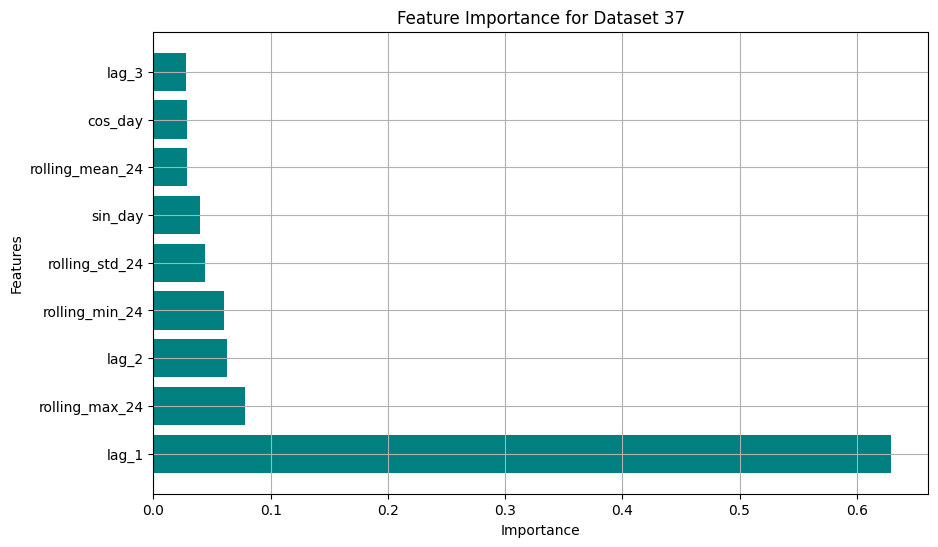

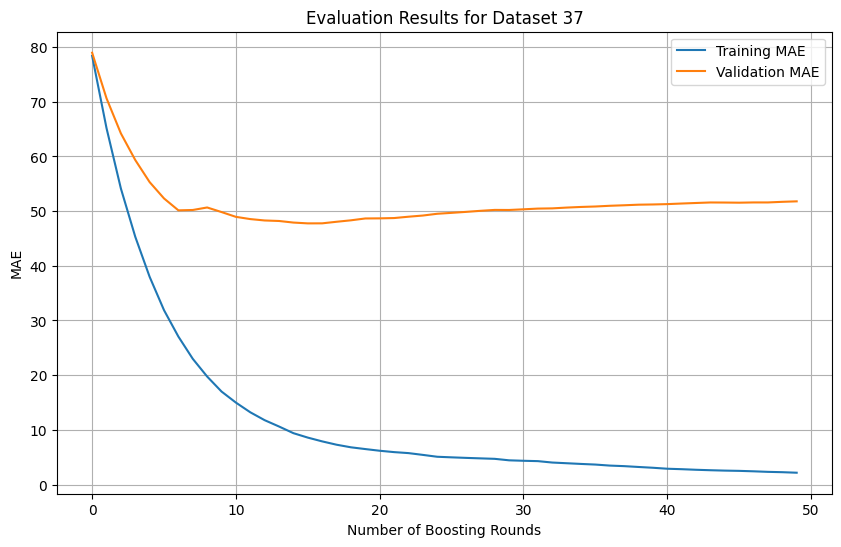

Dataset 37:
 Best Hyperparameters: {'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 50, 'reg_alpha': 0.5, 'reg_lambda': 2}
 Best k: 1.5
 Test Set MAE: 51.7849
 Precision: 0.1455, Recall: 0.4706, F1: 0.2222
--------------------------------------------------


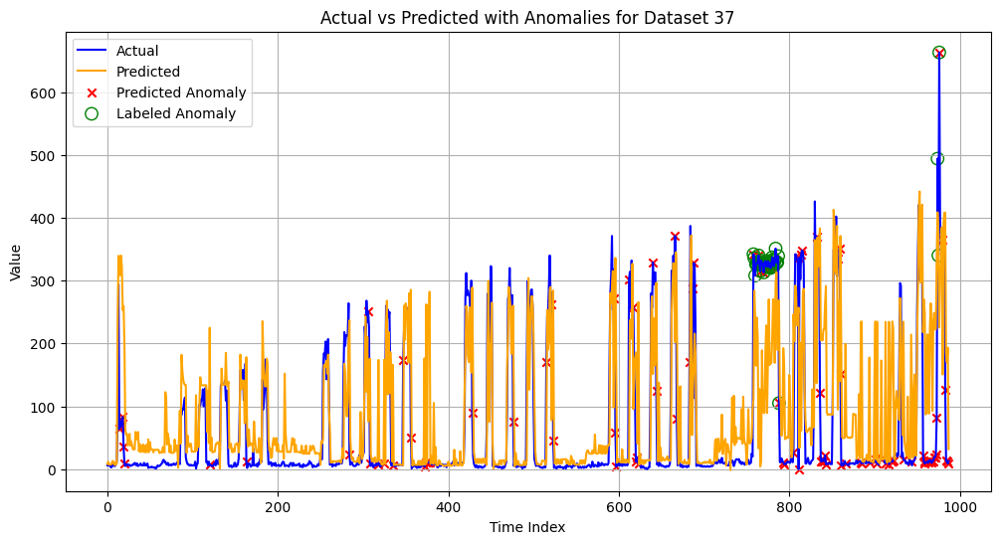

Dataset 37:
 Best Hyperparameters: {'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 50, 'reg_alpha': 0.5, 'reg_lambda': 2}
 Best k: 3
 Test Set MAE: 51.7849
 Precision: 0.2333, Recall: 0.2059, F1: 0.2187
--------------------------------------------------


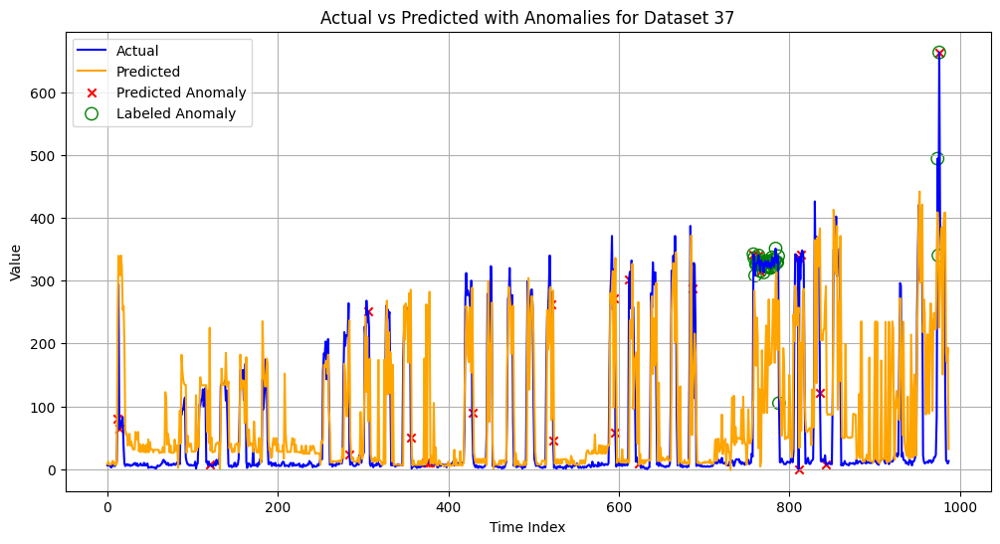

<ipython-input-4-4ae58c95129c>:11: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df.index = pd.date_range(start='2023-01-01', periods=len(df), freq='H')


Feature Importances:
lag_1: 0.7071
lag_3: 0.0565
rolling_max_24: 0.0469
lag_2: 0.0397
cos_day: 0.0365
sin_day: 0.0325
rolling_min_24: 0.0319
rolling_std_24: 0.0270
rolling_mean_24: 0.0221


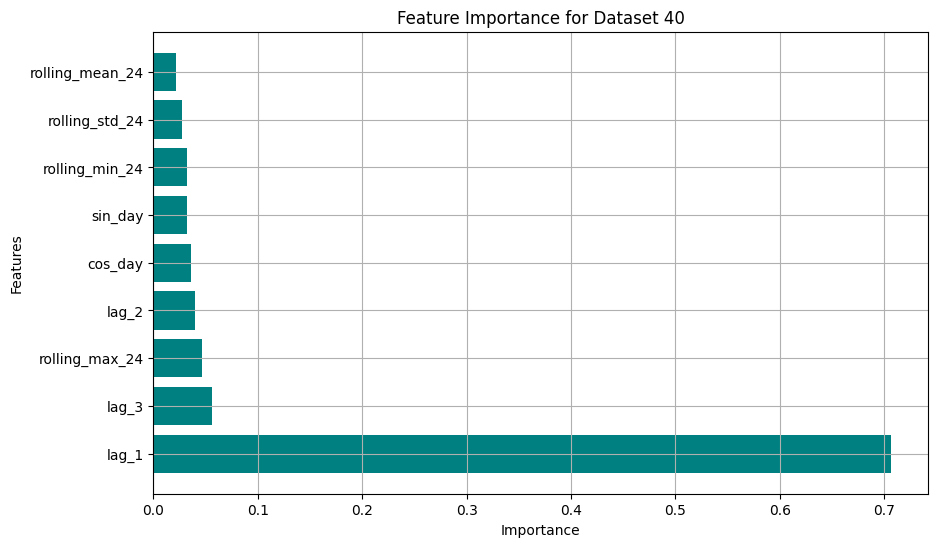

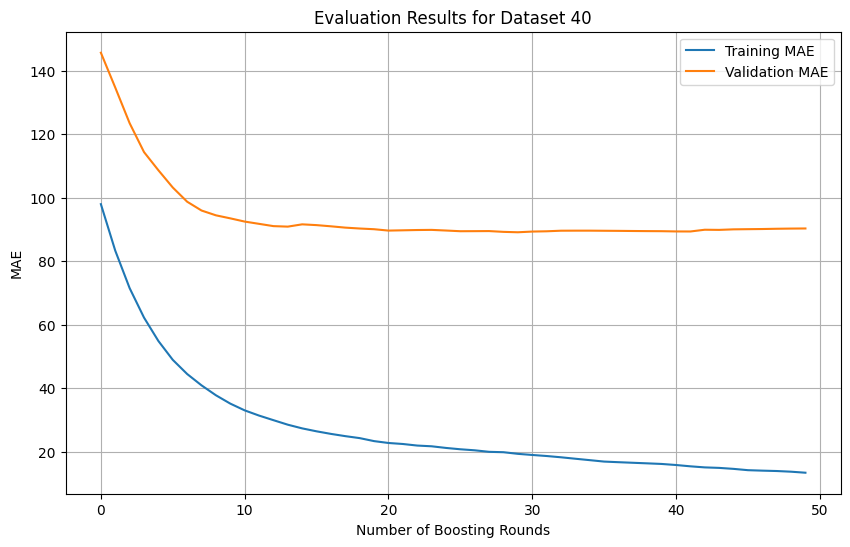

Dataset 40:
 Best Hyperparameters: {'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 50, 'reg_alpha': 0.5, 'reg_lambda': 1}
 Best k: 1.5
 Test Set MAE: 90.2867
 Precision: 0.6094, Recall: 0.9750, F1: 0.7500
--------------------------------------------------


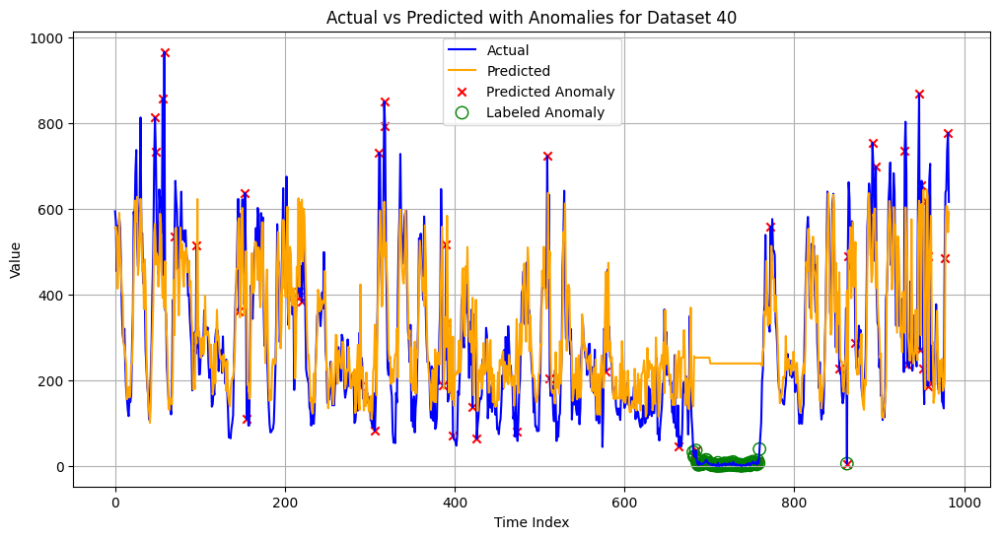

Dataset 40:
 Best Hyperparameters: {'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 50, 'reg_alpha': 0.5, 'reg_lambda': 1}
 Best k: 3
 Test Set MAE: 90.2867
 Precision: 0.0769, Recall: 0.0125, F1: 0.0215
--------------------------------------------------


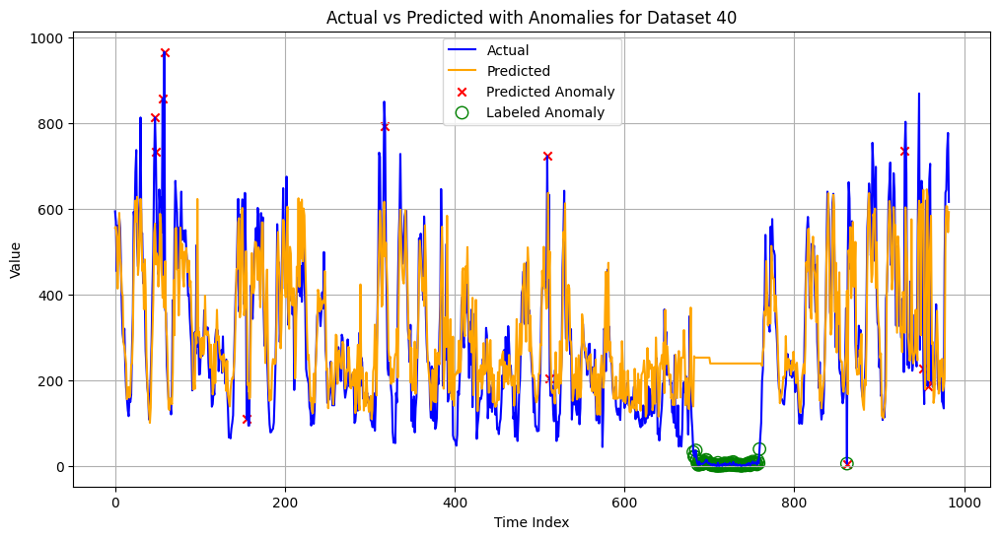

<ipython-input-4-4ae58c95129c>:11: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df.index = pd.date_range(start='2023-01-01', periods=len(df), freq='H')


Feature Importances:
lag_1: 0.7841
lag_3: 0.1043
rolling_max_24: 0.0494
lag_2: 0.0209
sin_day: 0.0144
rolling_std_24: 0.0140
rolling_mean_24: 0.0058
rolling_min_24: 0.0045
cos_day: 0.0027


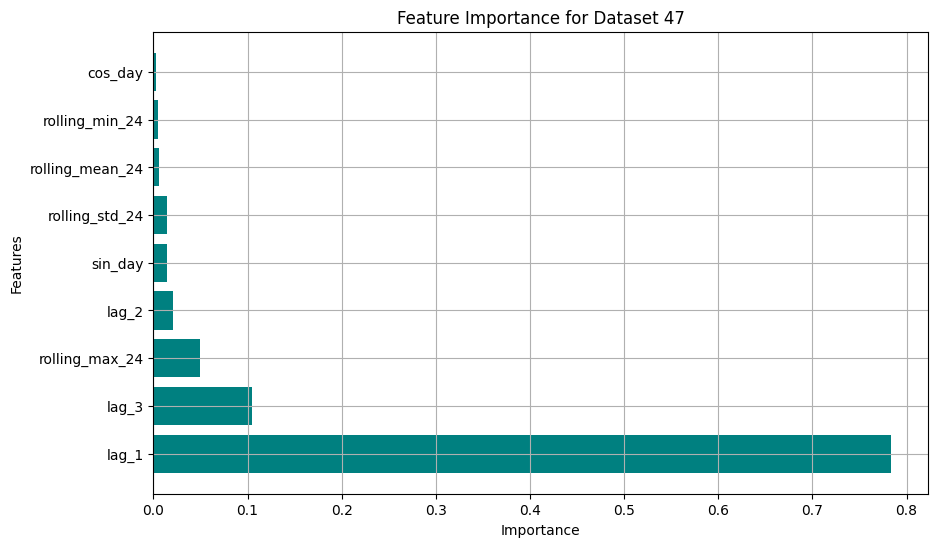

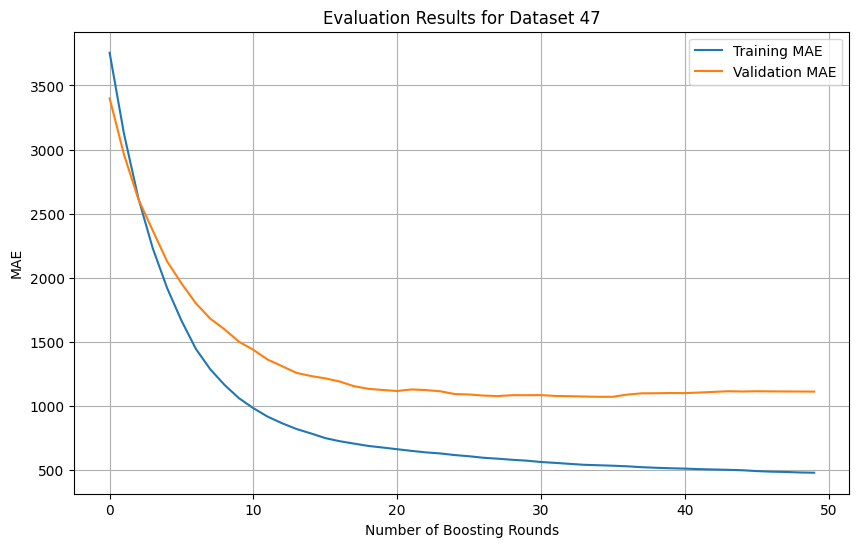

Dataset 47:
 Best Hyperparameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0.5, 'reg_lambda': 1}
 Best k: 2
 Test Set MAE: 1110.4663
 Precision: 0.2778, Recall: 0.5000, F1: 0.3571
--------------------------------------------------


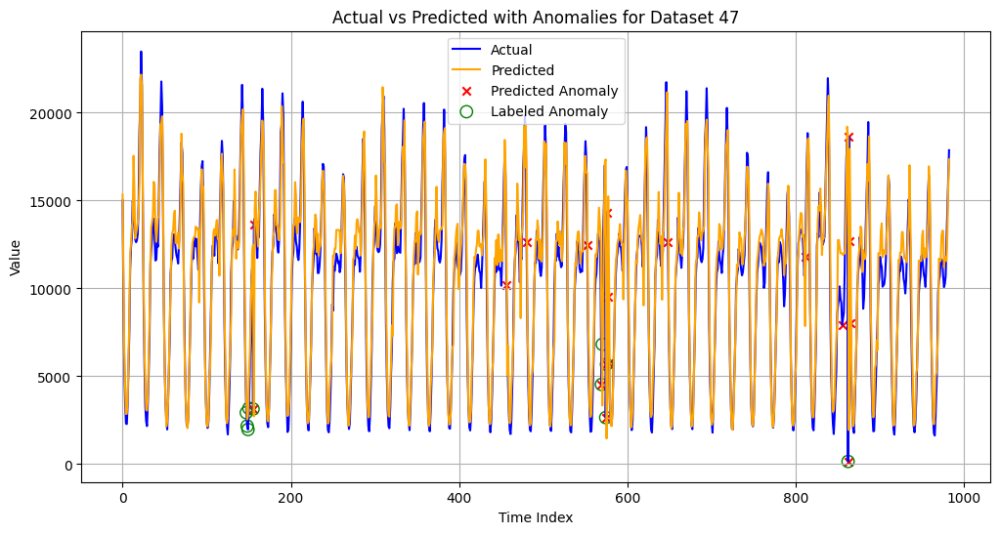

Dataset 47:
 Best Hyperparameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0.5, 'reg_lambda': 1}
 Best k: 3
 Test Set MAE: 1110.4663
 Precision: 0.2727, Recall: 0.3000, F1: 0.2857
--------------------------------------------------


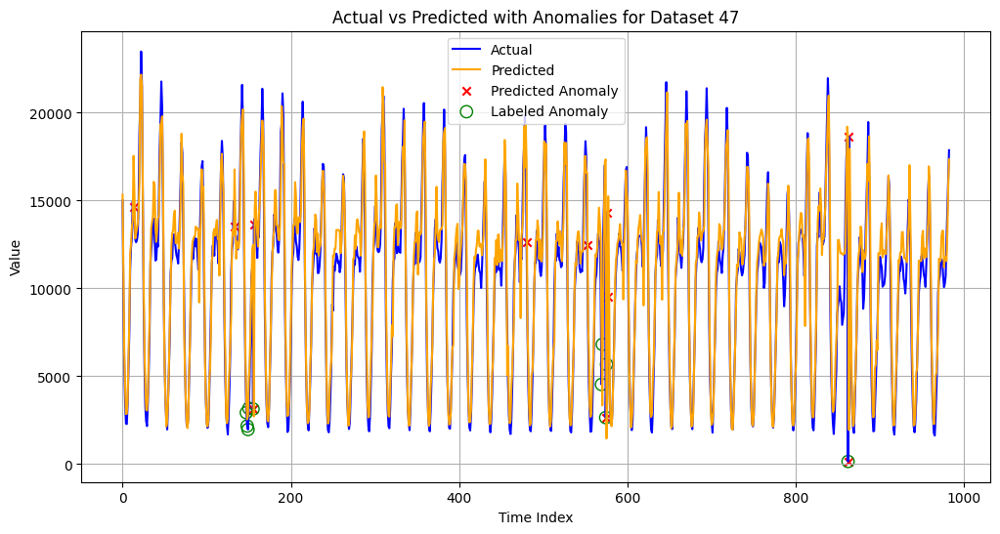


=== Average Best Metrics Across All Datasets ===
Average Precision SW = 0.51
Average Recall SW   = 0.49
Average F1-Score SW = 0.44
All F1 Scores SW: ['0.6725', '0.6159', '0.0144', '0.2222', '0.7500', '0.3571']

=== Average Best Metrics Across All Datasets ===
Average Precision DW = 0.38
Average Recall DW   = 0.16
Average F1-Score DW = 0.21
All F1 Scores DW: ['0.3776', '0.3537', '0.0000', '0.2187', '0.0215', '0.2857']


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, precision_score, recall_score, f1_score
from sklearn.model_selection import TimeSeriesSplit
import xgboost as xgb


A1C = [17, 19, 26, 37, 40, 47]

# Hyperparameters for XGBoost
param_grid = {
    'n_estimators': [50],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'reg_alpha': [0, 0.1, 0.5],
    'reg_lambda': [1, 1.5, 2]
}

tscv = TimeSeriesSplit(n_splits=2)  # For time-series cross-validation

all_best_precisions_dw = []
all_best_recalls_dw = []
all_best_f1_scores_dw = []
all_best_precisions_sw = []
all_best_recalls_sw = []
all_best_f1_scores_sw = []


possible_ks = [1.5, 2, 2.5, 3]  # Διάφορες τιμές k για δοκιμή
possible_windows = [100, 200, 300, 500]  # Διάφορες τιμές rolling window

for i in A1C:
    df = dfsA1[i].copy()
    value_col = f"value_{i}"

    # Ensure the dataframe has 'label' and value_col
    if value_col not in df.columns or "label" not in df.columns:
        print(f"Dataset {i} does not have the required columns.")
        continue

    # Apply feature engineering
    df = feature_engineering(df, value_col, window_size=24)

    # Prepare the data
    features = [col for col in df.columns if col != 'label' and col != value_col]
    X = df[features].values
    y = df[value_col].values
    labels = df["label"].values  # Ground truth anomaly labels

    # Split data into train and test sets
    X_train, X_test, y_train, y_test, label_train, label_test = train_test_split(
        X, y, labels, test_size=0.7, shuffle=False
    )

    # Scale the features
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    # Define the XGBoost model
    model = XGBRegressor(random_state=42, eval_metric="mae")

    # Perform grid search
    grid_search = GridSearchCV(
        estimator=model,
        param_grid=param_grid,
        scoring='neg_mean_absolute_error',
        cv = tscv,
        n_jobs=-1,
        return_train_score=True
    )
    grid_search.fit(
    X_train,
    y_train,
    eval_set=[(X_train, y_train), (X_test, y_test)],
    verbose=False
    )

#=================================================================================================================
# FEATURE IMPORTANCE
#=================================================================================================================

    # Retrieve the best model
    best_model = grid_search.best_estimator_

    # Extract evaluation results
    evals_result = best_model.evals_result()

    # Extract MAE for training and validation
    train_mae = evals_result["validation_0"]["mae"]  # Training MAE
    test_mae = evals_result["validation_1"]["mae"]   # Validation MAE

    # Predict on test set
    y_pred = best_model.predict(X_test)

    # Compute residuals
    residuals = np.abs(y_test - y_pred)

    # Feature Importance
    feature_importances = best_model.feature_importances_
    sorted_indices = np.argsort(feature_importances)[::-1]
    print("Feature Importances:")
    for idx in sorted_indices:
        print(f"{features[idx]}: {feature_importances[idx]:.4f}")

    # Plot feature importance
    plt.figure(figsize=(10, 6))
    plt.barh([features[idx] for idx in sorted_indices], feature_importances[sorted_indices], color='teal')
    plt.title(f"Feature Importance for Dataset {i}")
    plt.xlabel("Importance")
    plt.ylabel("Features")
    plt.grid()
    plt.show()

#=================================================================================================================
# TRUE AND PREDICTED AND LOSSES PLOTS
#=================================================================================================================

    # Plot the evaluation results
    plt.figure(figsize=(10, 6))
    plt.plot(train_mae, label="Training MAE")
    plt.plot(test_mae, label="Validation MAE")
    plt.xlabel("Number of Boosting Rounds")
    plt.ylabel("MAE")
    plt.title(f"Evaluation Results for Dataset {i}")
    plt.legend()
    plt.grid(True)
    plt.show()

#=================================================================================================================
# STATIC WINDOW
#=================================================================================================================

    # Optimize k for the static threshold
    best_f1_sw = -1
    best_k_sw = None
    best_precision_sw = 0
    best_recall_sw = 0
    best_predicted_anomalies_sw = None

    for k_sw in possible_ks:
        threshold_sw = np.mean(residuals) + k_sw * np.std(residuals)
        predicted_anomalies_sw = (residuals > threshold_sw).astype(int)

        precision_sw = precision_score(label_test, predicted_anomalies_sw, zero_division=0)
        recall_sw = recall_score(label_test, predicted_anomalies_sw, zero_division=0)
        f1_sw = f1_score(label_test, predicted_anomalies_sw, zero_division=0)

        if f1_sw > best_f1_sw:
            best_f1_sw = f1_sw
            best_k_sw = k_sw
            best_precision_sw = precision_sw
            best_recall_sw = recall_sw
            best_predicted_anomalies_sw = predicted_anomalies_sw

    all_best_precisions_sw.append(best_precision_sw)
    all_best_recalls_sw.append(best_recall_sw)
    all_best_f1_scores_sw.append(best_f1_sw)

    # Print metrics
    print(f"Dataset {i}:")
    print(f" Best Hyperparameters: {grid_search.best_params_}")
    print(f" Best k: {best_k_sw}")
    print(f" Test Set MAE: {mean_absolute_error(y_test, y_pred):.4f}")
    print(f" Precision: {best_precision_sw:.4f}, Recall: {best_recall_sw:.4f}, F1: {best_f1_sw:.4f}")
    print("-" * 50)

    # Plot actual vs predicted and highlight anomalies
    fig, ax = plt.subplots(figsize=(12, 6))

    # Plot actual and predicted values over time
    ax.plot(range(len(y_test)), y_test, label='Actual', color='blue')
    ax.plot(range(len(y_test)), y_pred, label='Predicted', color='orange')

    # Highlight predicted anomalies (red)
    pred_anomaly_indices = np.where(best_predicted_anomalies_sw == 1)[0]
    ax.scatter(pred_anomaly_indices, y_test[pred_anomaly_indices], color='red', label='Predicted Anomaly', marker='x')

    # Highlight actual labeled anomalies (green)
    actual_anomaly_indices = np.where(label_test == 1)[0]
    ax.scatter(actual_anomaly_indices, y_test[actual_anomaly_indices], color='green', label='Labeled Anomaly', marker='o', facecolors='none', s=80)

    ax.set_title(f"Actual vs Predicted with Anomalies for Dataset {i}")
    ax.set_xlabel("Time Index")
    ax.set_ylabel("Value")
    ax.legend()
    ax.grid(True)
    plt.show()

#=================================================================================================================
# DYNAMIC WINDOW
#=================================================================================================================

    best_f1__dw = -1
    best_k_dw = None
    best_window_dw = None
    best_precision_dw = 0.0
    best_recall_dw = 0.0
    best_predicted_anomalies_dw = None

    for window_dw in possible_windows:
        # Υπολογισμός κυλιόμενων στατιστικών για το “dynamic threshold”
        rolling_residuals_dw = pd.Series(residuals).rolling(window=window_dw, min_periods=1)
        mean_residuals_dw = rolling_residuals_dw.mean()
        std_residuals_dw = rolling_residuals_dw.std()

        for k_dw in possible_ks:
            # Ορισμός ορίου: mean + k * std
            threshold_dw = mean_residuals_dw + k_dw * std_residuals_dw
            predicted_anomalies_dw = (residuals.flatten() > threshold_dw).astype(int)

            precision_k_dw = precision_score(label_test, predicted_anomalies_dw)
            recall_k_dw = recall_score(label_test, predicted_anomalies_dw)
            f1_k_dw = f1_score(label_test, predicted_anomalies_dw)

            if f1_k_dw > best_f1__dw:
                best_f1_dw = f1_k_dw
                best_k_dw = k_dw
                best_window_dw = window_dw
                best_precision_dw = precision_k_dw
                best_recall_dw = recall_k_dw
                best_predicted_anomalies_dw = predicted_anomalies_dw

    # Αποθήκευση καλύτερων τιμών για το συγκεκριμένο dataset
    all_best_precisions_dw.append(best_precision_dw)
    all_best_recalls_dw.append(best_recall_dw)
    all_best_f1_scores_dw.append(best_f1_dw)

    # Print metrics
    print(f"Dataset {i}:")
    print(f" Best Hyperparameters: {grid_search.best_params_}")
    print(f" Best k: {best_k_dw}")
    print(f" Test Set MAE: {mean_absolute_error(y_test, y_pred):.4f}")
    print(f" Precision: {best_precision_dw:.4f}, Recall: {best_recall_dw:.4f}, F1: {best_f1_dw:.4f}")
    print("-" * 50)

    # Plot actual vs predicted and highlight anomalies
    fig, ax = plt.subplots(figsize=(12, 6))

    # Plot actual and predicted values over time
    ax.plot(range(len(y_test)), y_test, label='Actual', color='blue')
    ax.plot(range(len(y_test)), y_pred, label='Predicted', color='orange')

    # Highlight predicted anomalies (red)
    pred_anomaly_indices = np.where(best_predicted_anomalies_dw == 1)[0]
    ax.scatter(pred_anomaly_indices, y_test[pred_anomaly_indices], color='red', label='Predicted Anomaly', marker='x')

    # Highlight actual labeled anomalies (green)
    actual_anomaly_indices = np.where(label_test == 1)[0]
    ax.scatter(actual_anomaly_indices, y_test[actual_anomaly_indices], color='green', label='Labeled Anomaly', marker='o', facecolors='none', s=80)

    ax.set_title(f"Actual vs Predicted with Anomalies for Dataset {i}")
    ax.set_xlabel("Time Index")
    ax.set_ylabel("Value")
    ax.legend()
    ax.grid(True)
    plt.show()

#=================================================================================================================
# AVERAGE SCORES
#=================================================================================================================

average_precision_sw = np.mean(all_best_precisions_sw)
average_recall_sw = np.mean(all_best_recalls_sw)
average_f1_score_sw = np.mean(all_best_f1_scores_sw)

print("\n=== Average Best Metrics Across All Datasets ===")
print(f"Average Precision SW = {average_precision_sw:.2f}")
print(f"Average Recall SW   = {average_recall_sw:.2f}")
print(f"Average F1-Score SW = {average_f1_score_sw:.2f}")
formatted_scores_sw = [f"{score:.4f}" for score in all_best_f1_scores_sw]
print(f"All F1 Scores SW: {formatted_scores_sw}")


average_precision_dw = np.mean(all_best_precisions_dw)
average_recall_dw = np.mean(all_best_recalls_dw)
average_f1_score_dw = np.mean(all_best_f1_scores_dw)

print("\n=== Average Best Metrics Across All Datasets ===")
print(f"Average Precision DW = {average_precision_dw:.2f}")
print(f"Average Recall DW   = {average_recall_dw:.2f}")
print(f"Average F1-Score DW = {average_f1_score_dw:.2f}")
formatted_scores_dw = [f"{score:.4f}" for score in all_best_f1_scores_dw]
print(f"All F1 Scores DW: {formatted_scores_dw}")


<ipython-input-4-4ae58c95129c>:11: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df.index = pd.date_range(start='2023-01-01', periods=len(df), freq='H')


Feature Importances:
lag_1: 0.8216
lag_3: 0.0945
rolling_max_24: 0.0272
rolling_std_24: 0.0257
lag_2: 0.0079
rolling_min_24: 0.0076
rolling_mean_24: 0.0062
cos_day: 0.0062
sin_day: 0.0029


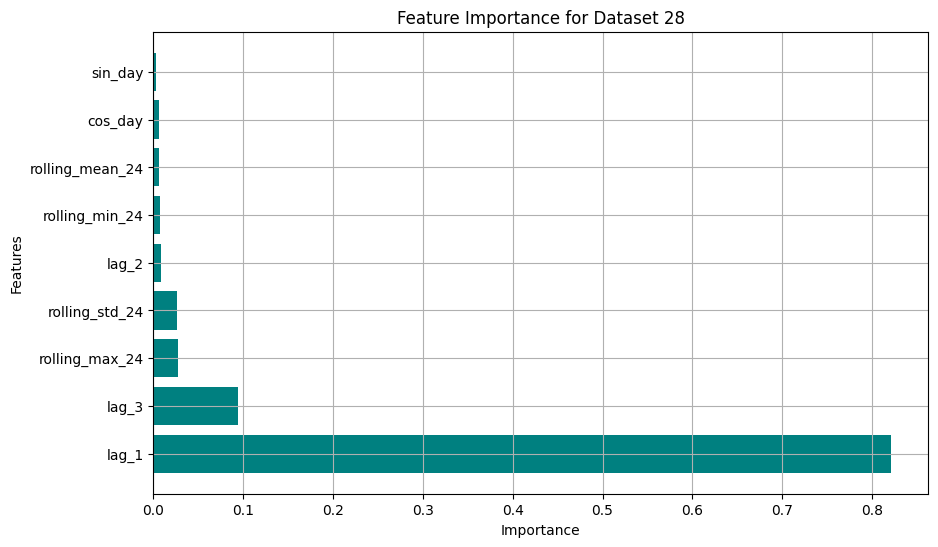

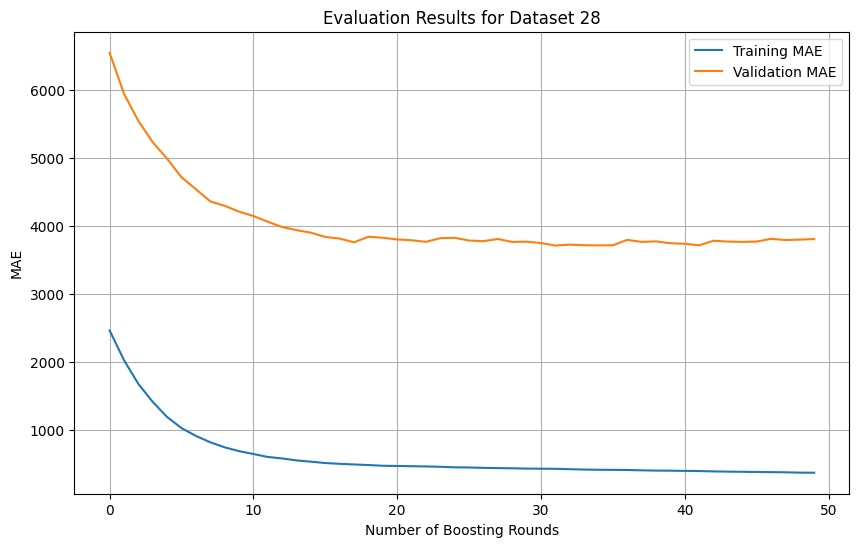

Dataset 28:
 Best Hyperparameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0.5, 'reg_lambda': 1}
 Best k: 2.5
 Test Set MAE: 3808.7926
 Precision: 0.0690, Recall: 0.0247, F1: 0.0364
--------------------------------------------------


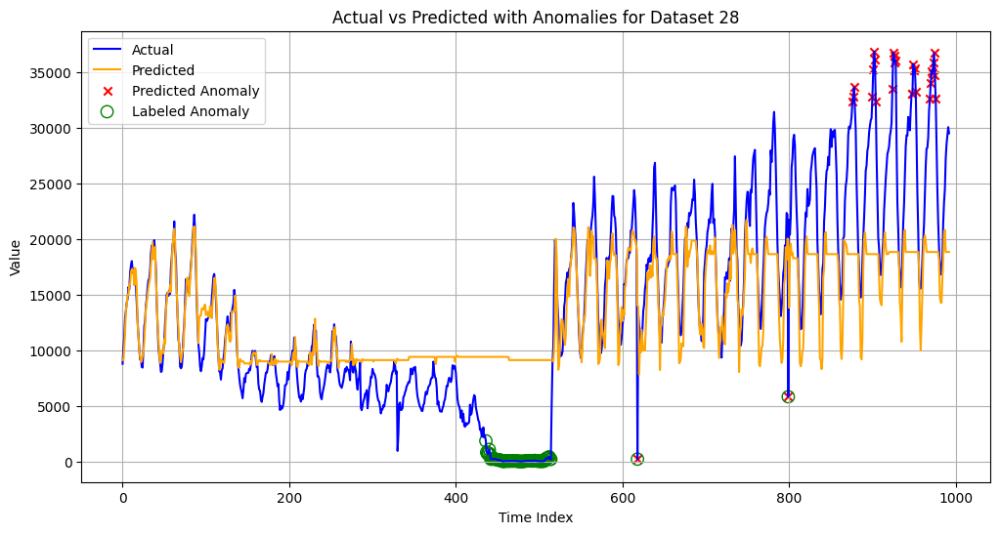

Dataset 28:
 Best Hyperparameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0.5, 'reg_lambda': 1}
 Best k: 3
 Test Set MAE: 3808.7926
 Precision: 0.5510, Recall: 0.3333, F1: 0.4154
--------------------------------------------------


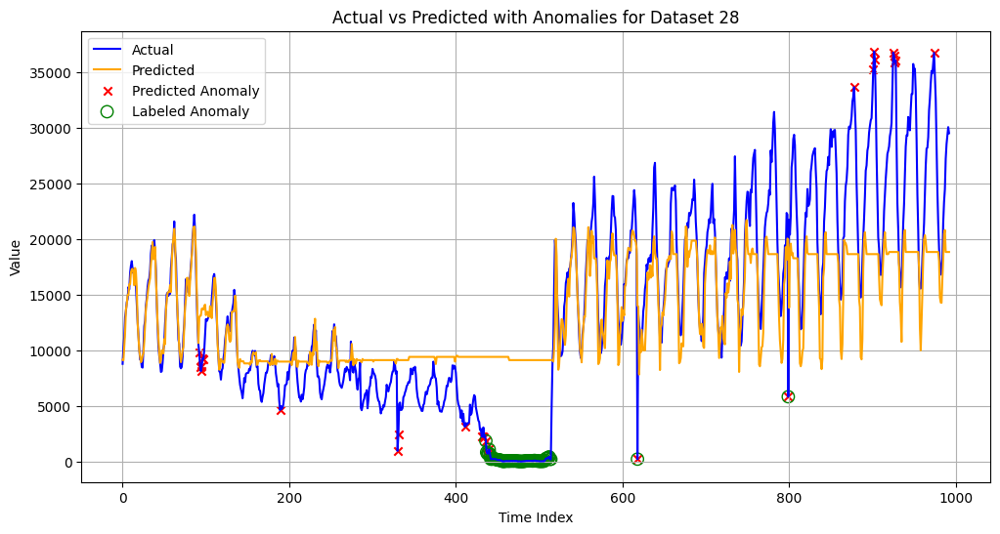

<ipython-input-4-4ae58c95129c>:11: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df.index = pd.date_range(start='2023-01-01', periods=len(df), freq='H')


Feature Importances:
lag_1: 0.4881
rolling_max_24: 0.1330
rolling_min_24: 0.1220
lag_3: 0.0691
lag_2: 0.0558
rolling_std_24: 0.0416
cos_day: 0.0407
rolling_mean_24: 0.0376
sin_day: 0.0120


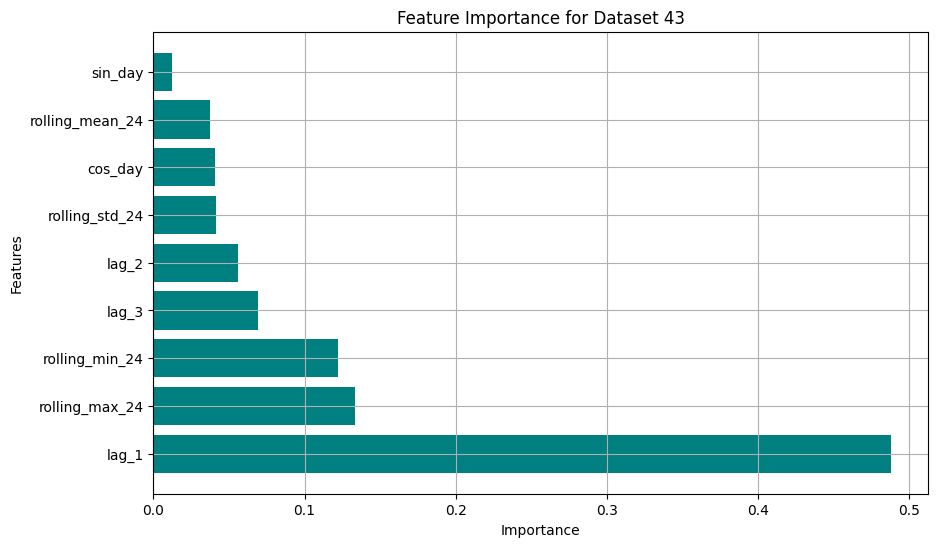

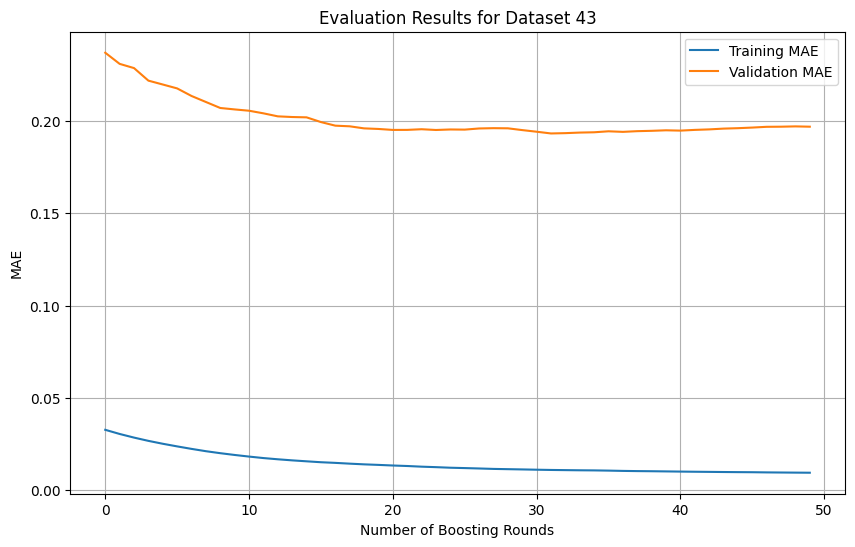

Dataset 43:
 Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 50, 'reg_alpha': 0, 'reg_lambda': 1.5}
 Best k: 2.5
 Test Set MAE: 0.1969
 Precision: 1.0000, Recall: 0.1111, F1: 0.2000
--------------------------------------------------


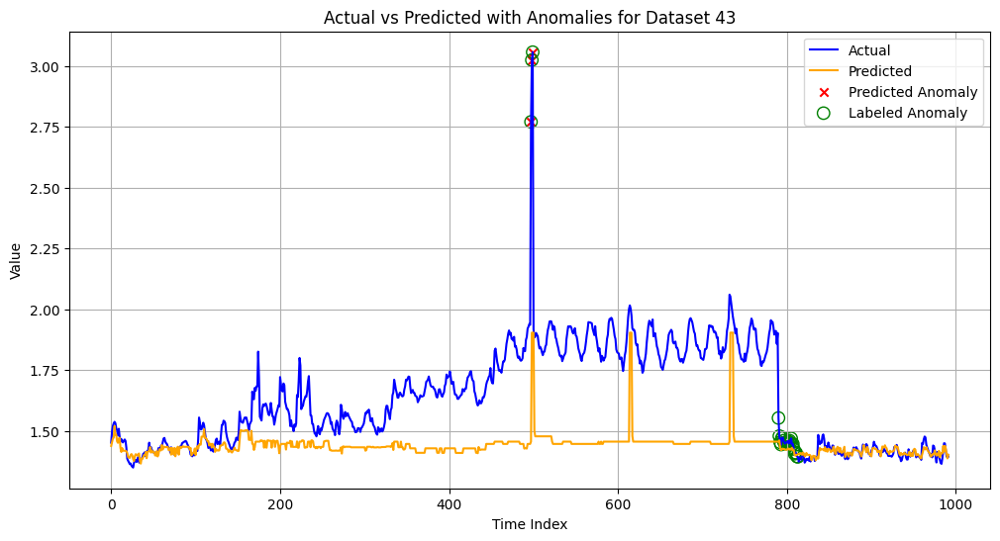

Dataset 43:
 Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 50, 'reg_alpha': 0, 'reg_lambda': 1.5}
 Best k: 3
 Test Set MAE: 0.1969
 Precision: 0.1154, Recall: 0.1111, F1: 0.1132
--------------------------------------------------


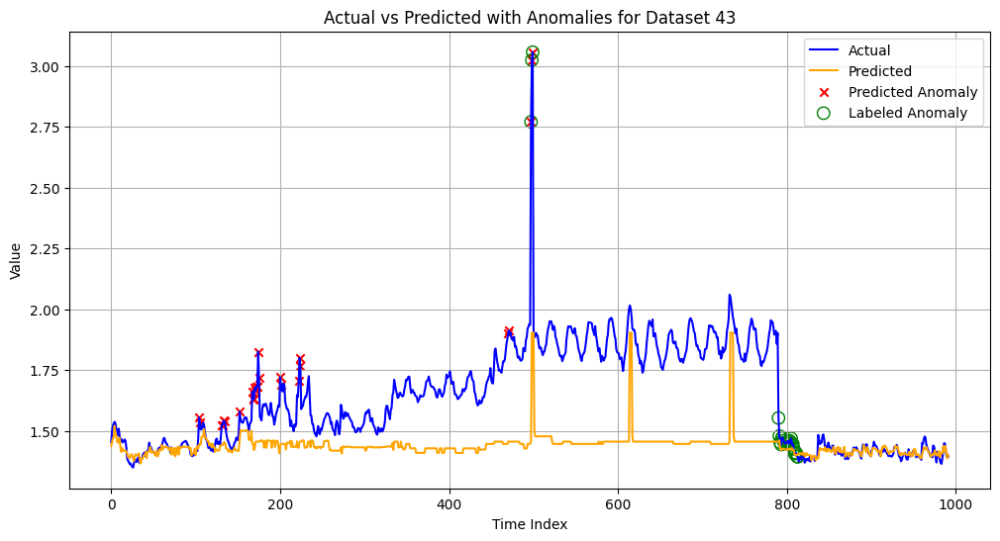

<ipython-input-4-4ae58c95129c>:11: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df.index = pd.date_range(start='2023-01-01', periods=len(df), freq='H')


Feature Importances:
lag_1: 0.7519
lag_3: 0.1112
rolling_std_24: 0.0322
lag_2: 0.0302
rolling_mean_24: 0.0293
rolling_max_24: 0.0267
sin_day: 0.0099
rolling_min_24: 0.0085
cos_day: 0.0000


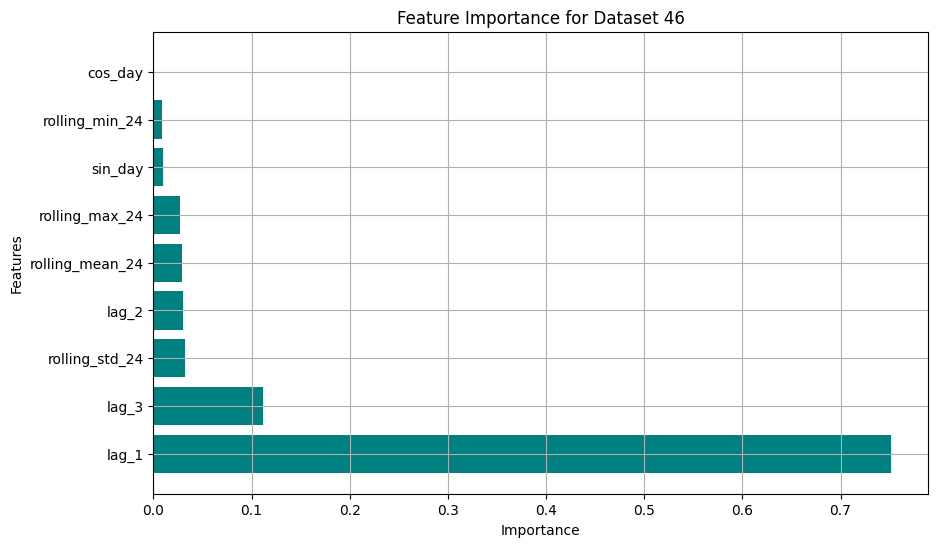

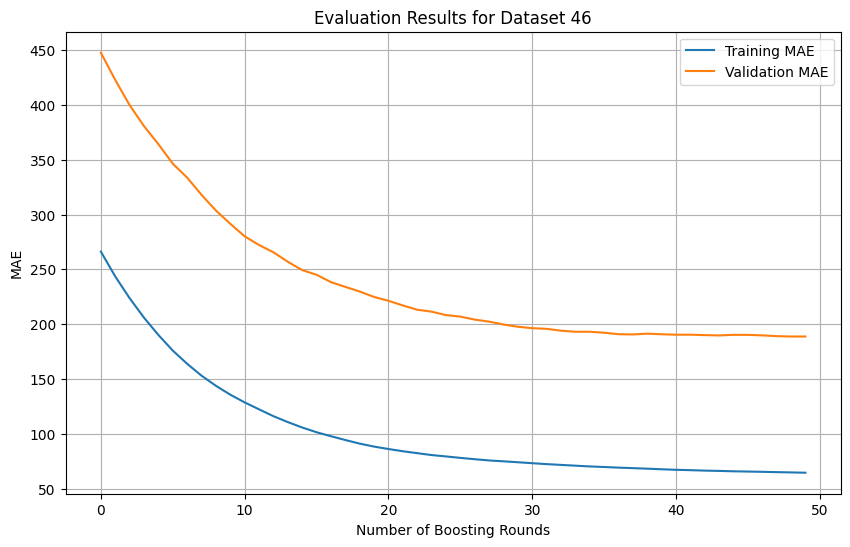

Dataset 46:
 Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0.5, 'reg_lambda': 2}
 Best k: 2
 Test Set MAE: 188.7816
 Precision: 1.0000, Recall: 0.8807, F1: 0.9366
--------------------------------------------------


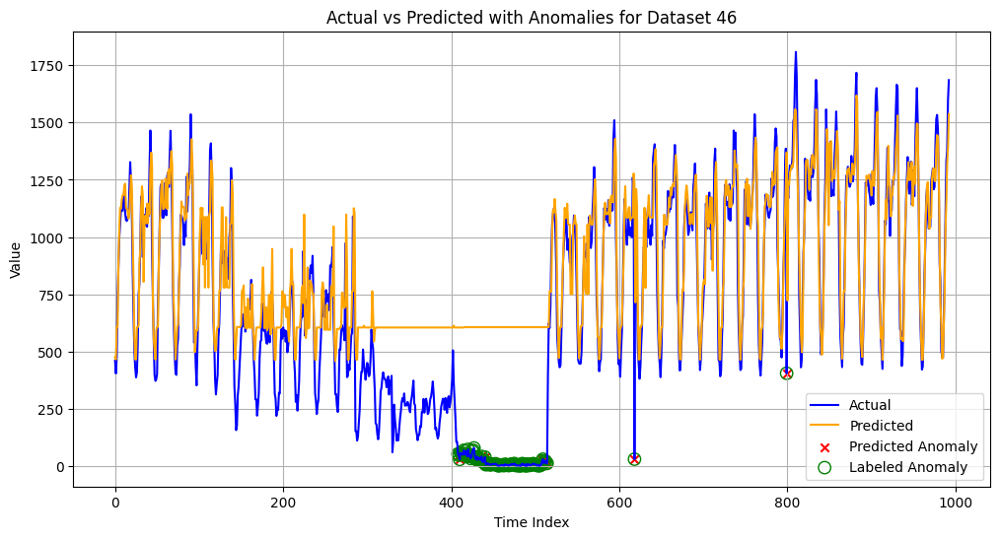

Dataset 46:
 Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0.5, 'reg_lambda': 2}
 Best k: 3
 Test Set MAE: 188.7816
 Precision: 0.1667, Recall: 0.0183, F1: 0.0331
--------------------------------------------------


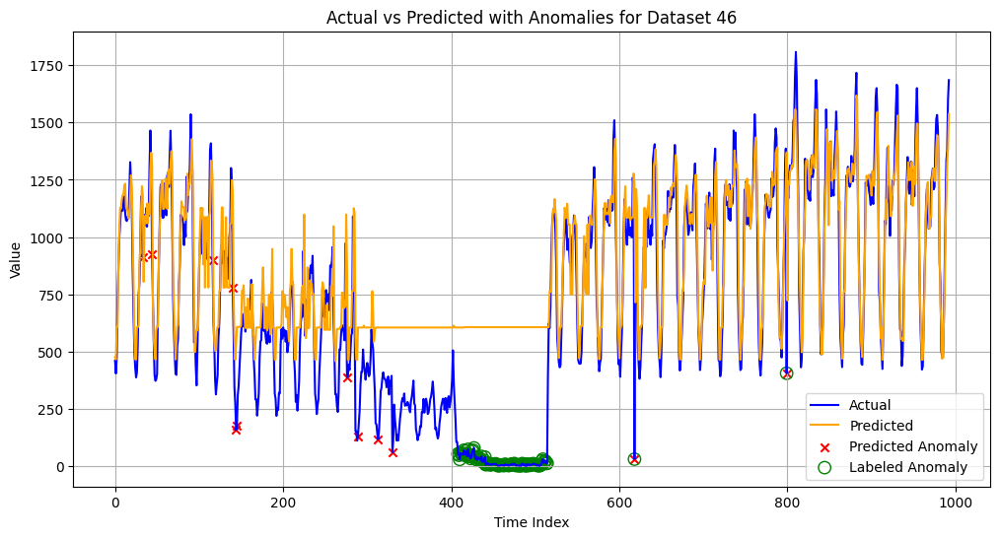

<ipython-input-4-4ae58c95129c>:11: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df.index = pd.date_range(start='2023-01-01', periods=len(df), freq='H')


Feature Importances:
lag_1: 0.7420
lag_3: 0.0591
lag_2: 0.0552
rolling_max_24: 0.0390
rolling_mean_24: 0.0270
cos_day: 0.0266
sin_day: 0.0252
rolling_std_24: 0.0172
rolling_min_24: 0.0088


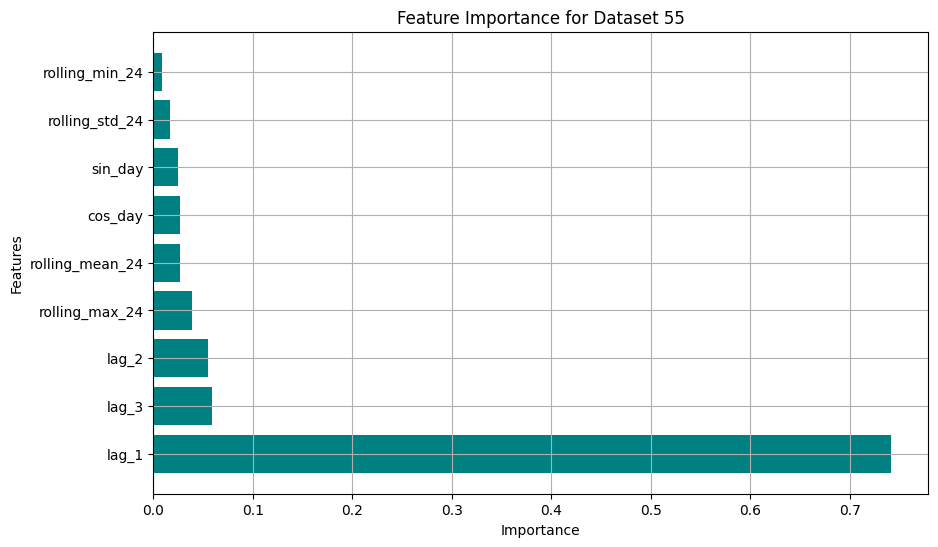

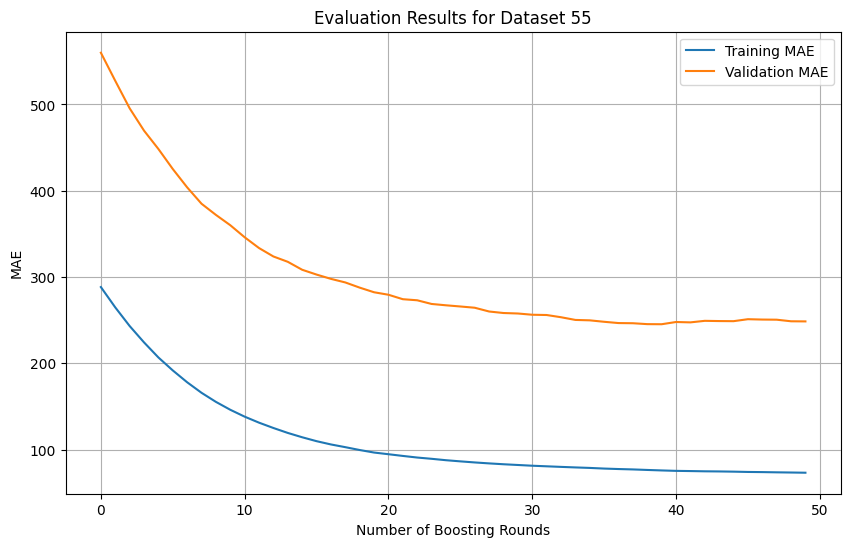

Dataset 55:
 Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0, 'reg_lambda': 1}
 Best k: 3
 Test Set MAE: 248.5867
 Precision: 0.1579, Recall: 0.6000, F1: 0.2500
--------------------------------------------------


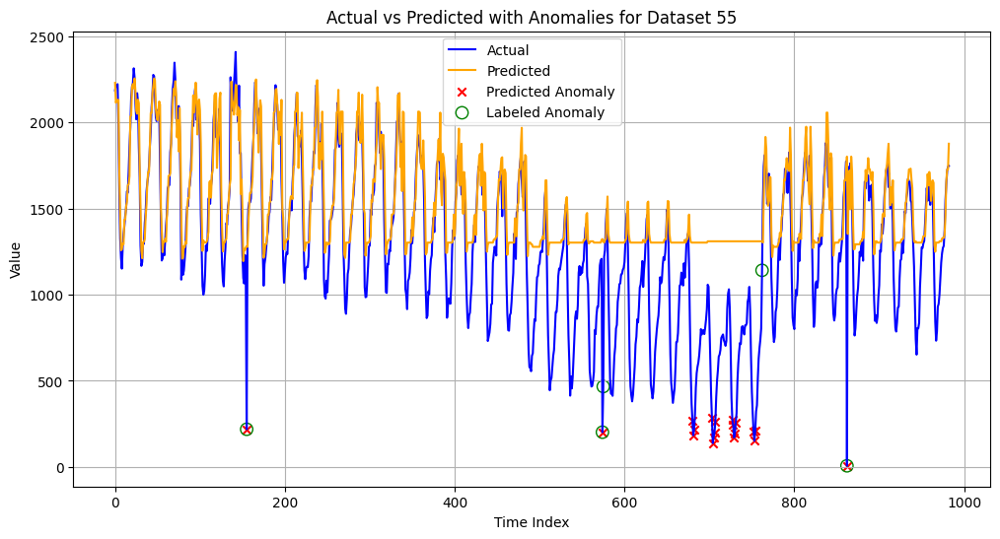

Dataset 55:
 Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0, 'reg_lambda': 1}
 Best k: 3
 Test Set MAE: 248.5867
 Precision: 0.0741, Recall: 0.8000, F1: 0.1356
--------------------------------------------------


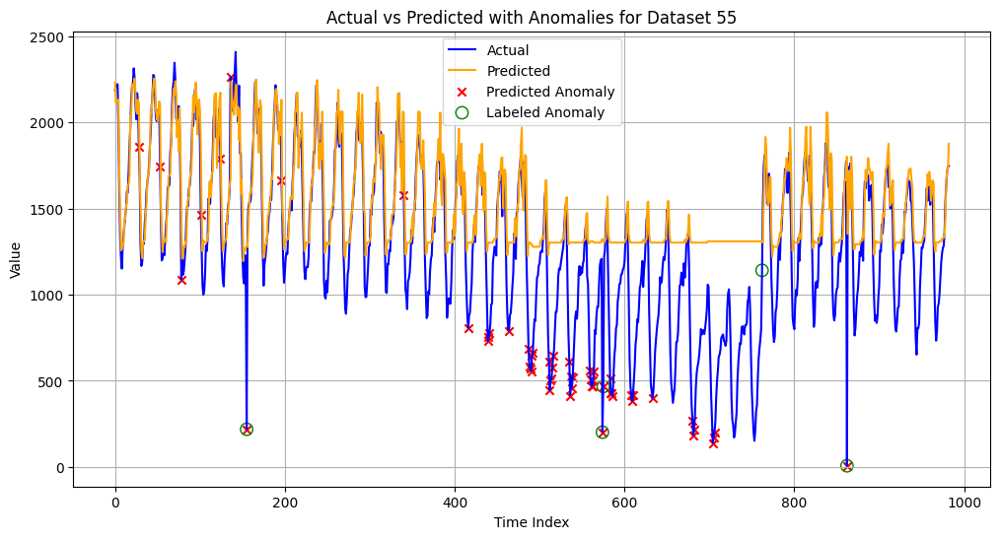

<ipython-input-4-4ae58c95129c>:11: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df.index = pd.date_range(start='2023-01-01', periods=len(df), freq='H')


Feature Importances:
lag_1: 0.5912
rolling_max_24: 0.0913
lag_2: 0.0858
lag_3: 0.0722
rolling_min_24: 0.0682
cos_day: 0.0258
rolling_mean_24: 0.0254
sin_day: 0.0215
rolling_std_24: 0.0187


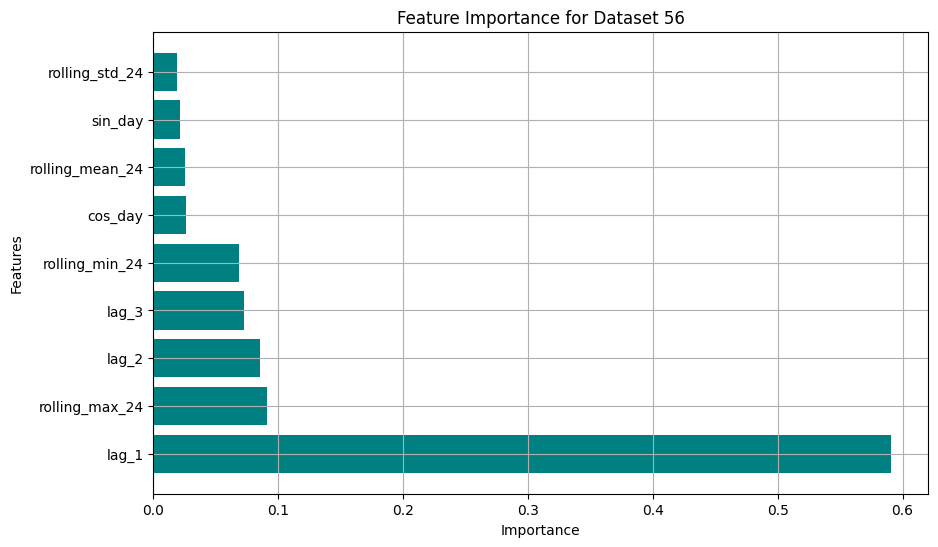

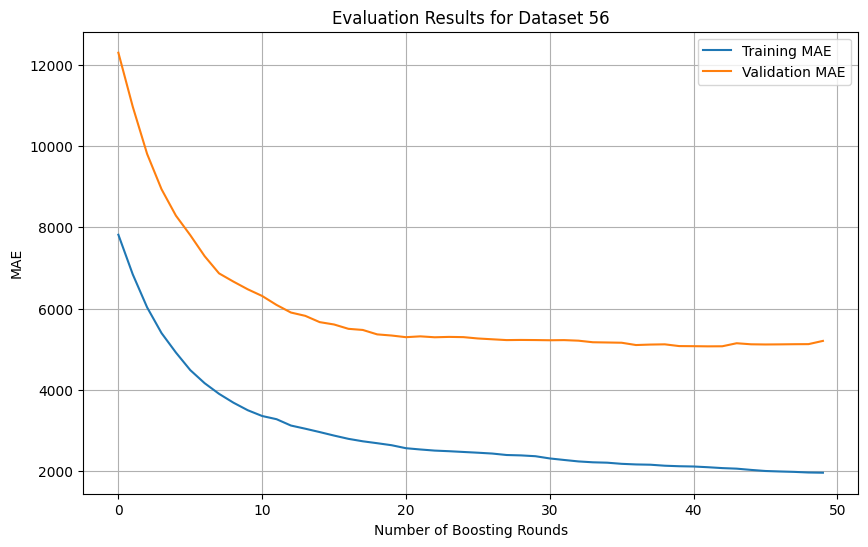

Dataset 56:
 Best Hyperparameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0.5, 'reg_lambda': 2}
 Best k: 3
 Test Set MAE: 5204.9591
 Precision: 0.1739, Recall: 0.8000, F1: 0.2857
--------------------------------------------------


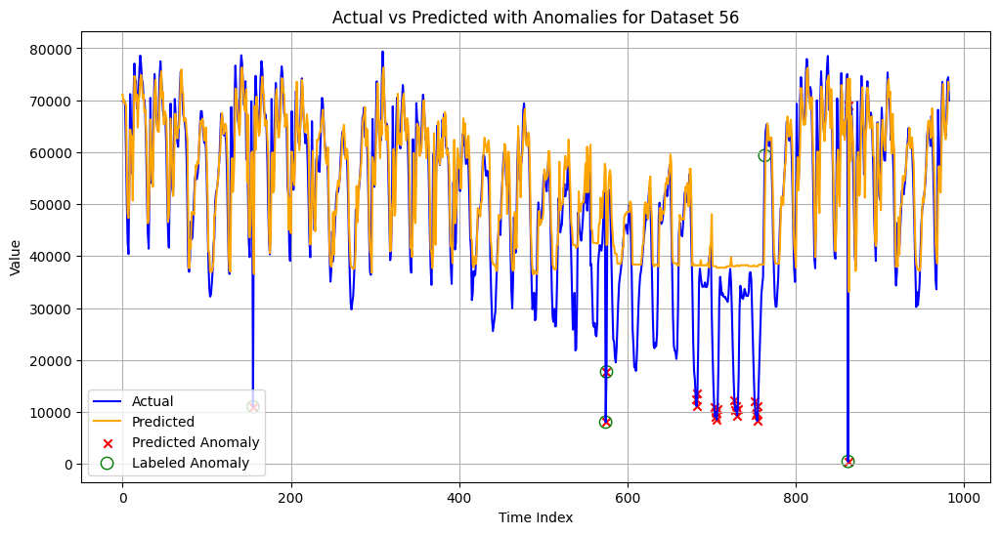

Dataset 56:
 Best Hyperparameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0.5, 'reg_lambda': 2}
 Best k: 3
 Test Set MAE: 5204.9591
 Precision: 0.0909, Recall: 0.8000, F1: 0.1633
--------------------------------------------------


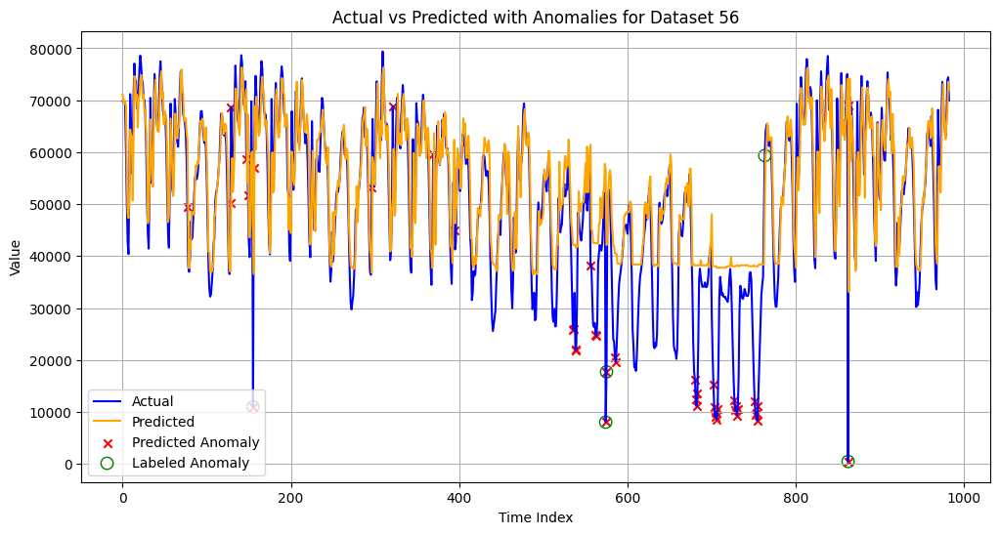

<ipython-input-4-4ae58c95129c>:11: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df.index = pd.date_range(start='2023-01-01', periods=len(df), freq='H')


Feature Importances:
lag_1: 0.7682
lag_3: 0.0845
lag_2: 0.0470
rolling_max_24: 0.0348
rolling_std_24: 0.0195
rolling_mean_24: 0.0154
cos_day: 0.0133
sin_day: 0.0088
rolling_min_24: 0.0083


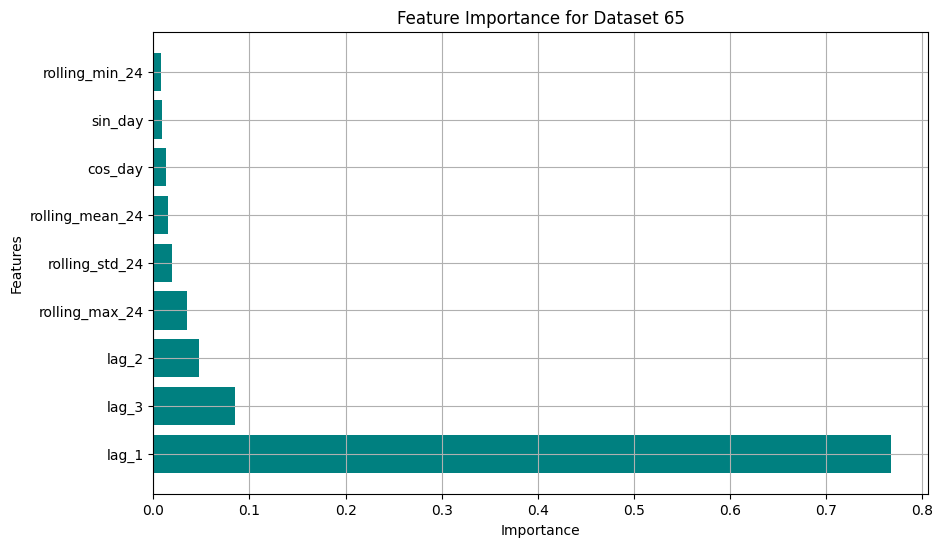

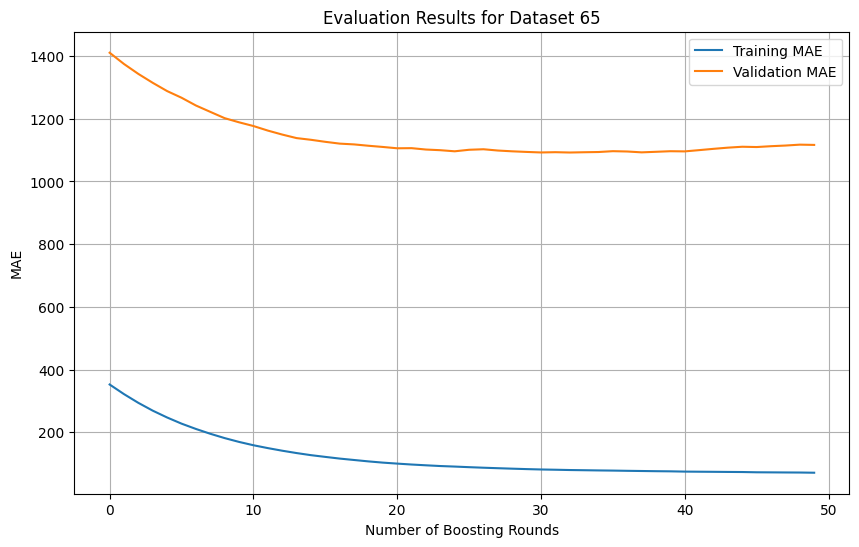

Dataset 65:
 Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0.5, 'reg_lambda': 1}
 Best k: 2.5
 Test Set MAE: 1116.4392
 Precision: 0.3182, Recall: 0.4118, F1: 0.3590
--------------------------------------------------


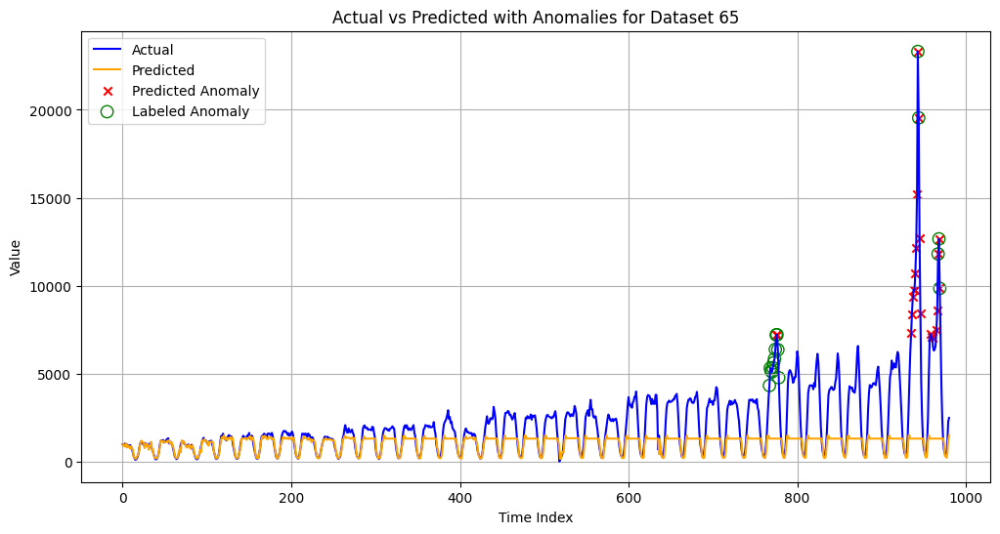

Dataset 65:
 Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0.5, 'reg_lambda': 1}
 Best k: 3
 Test Set MAE: 1116.4392
 Precision: 0.1359, Recall: 0.8235, F1: 0.2333
--------------------------------------------------


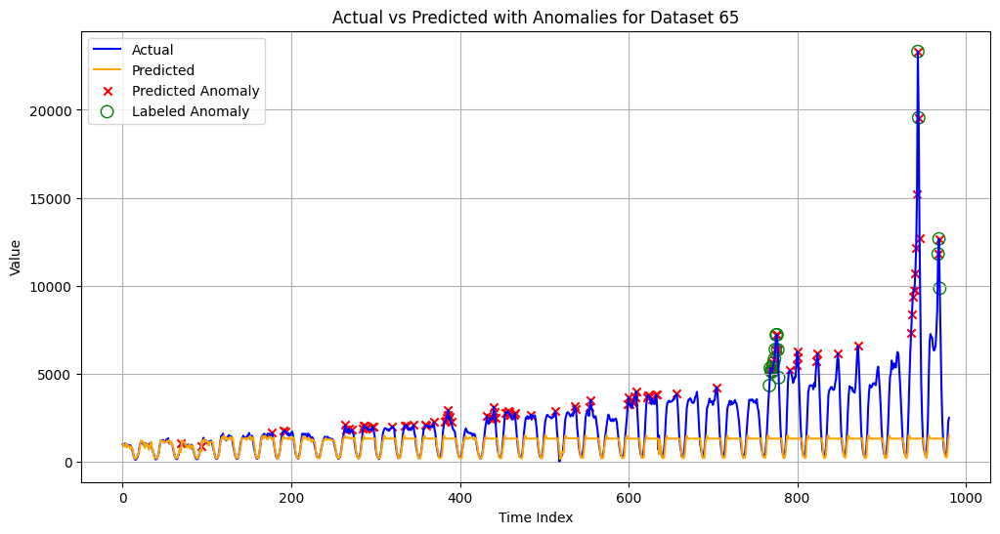


=== Average Best Metrics Across All Datasets ===
Average Precision SW = 0.45
Average Recall SW   = 0.47
Average F1-Score SW = 0.34
All F1 Scores SW: ['0.0364', '0.2000', '0.9366', '0.2500', '0.2857', '0.3590']

=== Average Best Metrics Across All Datasets ===
Average Precision DW = 0.19
Average Recall DW   = 0.48
Average F1-Score DW = 0.18
All F1 Scores DW: ['0.4154', '0.1132', '0.0331', '0.1356', '0.1633', '0.2333']


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, precision_score, recall_score, f1_score
from sklearn.model_selection import TimeSeriesSplit
import xgboost as xgb


A1D = [28,43,46,55,56,65]


# Hyperparameters for XGBoost
param_grid = {
    'n_estimators': [50],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'reg_alpha': [0, 0.1, 0.5],
    'reg_lambda': [1, 1.5, 2]
}

tscv = TimeSeriesSplit(n_splits=2)  # For time-series cross-validation

all_best_precisions_dw = []
all_best_recalls_dw = []
all_best_f1_scores_dw = []
all_best_precisions_sw = []
all_best_recalls_sw = []
all_best_f1_scores_sw = []


possible_ks = [1.5, 2, 2.5, 3]  # Διάφορες τιμές k για δοκιμή
possible_windows = [100, 200, 300, 500]  # Διάφορες τιμές rolling window

for i in A1D:
    df = dfsA1[i].copy()
    value_col = f"value_{i}"

    # Ensure the dataframe has 'label' and value_col
    if value_col not in df.columns or "label" not in df.columns:
        print(f"Dataset {i} does not have the required columns.")
        continue

    # Apply feature engineering
    df = feature_engineering(df, value_col, window_size=24)

    # Prepare the data
    features = [col for col in df.columns if col != 'label' and col != value_col]
    X = df[features].values
    y = df[value_col].values
    labels = df["label"].values  # Ground truth anomaly labels

    # Split data into train and test sets
    X_train, X_test, y_train, y_test, label_train, label_test = train_test_split(
        X, y, labels, test_size=0.7, shuffle=False
    )

    # Scale the features
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    # Define the XGBoost model
    model = XGBRegressor(random_state=42, eval_metric="mae")

    # Perform grid search
    grid_search = GridSearchCV(
        estimator=model,
        param_grid=param_grid,
        scoring='neg_mean_absolute_error',
        cv = tscv,
        n_jobs=-1,
        return_train_score=True
    )
    grid_search.fit(
    X_train,
    y_train,
    eval_set=[(X_train, y_train), (X_test, y_test)],
    verbose=False
    )

#=================================================================================================================
# FEATURE IMPORTANCE
#=================================================================================================================

    # Retrieve the best model
    best_model = grid_search.best_estimator_

    # Extract evaluation results
    evals_result = best_model.evals_result()

    # Extract MAE for training and validation
    train_mae = evals_result["validation_0"]["mae"]  # Training MAE
    test_mae = evals_result["validation_1"]["mae"]   # Validation MAE

    # Predict on test set
    y_pred = best_model.predict(X_test)

    # Compute residuals
    residuals = np.abs(y_test - y_pred)

    # Feature Importance
    feature_importances = best_model.feature_importances_
    sorted_indices = np.argsort(feature_importances)[::-1]
    print("Feature Importances:")
    for idx in sorted_indices:
        print(f"{features[idx]}: {feature_importances[idx]:.4f}")

    # Plot feature importance
    plt.figure(figsize=(10, 6))
    plt.barh([features[idx] for idx in sorted_indices], feature_importances[sorted_indices], color='teal')
    plt.title(f"Feature Importance for Dataset {i}")
    plt.xlabel("Importance")
    plt.ylabel("Features")
    plt.grid()
    plt.show()

#=================================================================================================================
# TRUE AND PREDICTED AND LOSSES PLOTS
#=================================================================================================================

    # Plot the evaluation results
    plt.figure(figsize=(10, 6))
    plt.plot(train_mae, label="Training MAE")
    plt.plot(test_mae, label="Validation MAE")
    plt.xlabel("Number of Boosting Rounds")
    plt.ylabel("MAE")
    plt.title(f"Evaluation Results for Dataset {i}")
    plt.legend()
    plt.grid(True)
    plt.show()

#=================================================================================================================
# STATIC WINDOW
#=================================================================================================================

    # Optimize k for the static threshold
    best_f1_sw = -1
    best_k_sw = None
    best_precision_sw = 0
    best_recall_sw = 0
    best_predicted_anomalies_sw = None

    for k_sw in possible_ks:
        threshold_sw = np.mean(residuals) + k_sw * np.std(residuals)
        predicted_anomalies_sw = (residuals > threshold_sw).astype(int)

        precision_sw = precision_score(label_test, predicted_anomalies_sw, zero_division=0)
        recall_sw = recall_score(label_test, predicted_anomalies_sw, zero_division=0)
        f1_sw = f1_score(label_test, predicted_anomalies_sw, zero_division=0)

        if f1_sw > best_f1_sw:
            best_f1_sw = f1_sw
            best_k_sw = k_sw
            best_precision_sw = precision_sw
            best_recall_sw = recall_sw
            best_predicted_anomalies_sw = predicted_anomalies_sw

    all_best_precisions_sw.append(best_precision_sw)
    all_best_recalls_sw.append(best_recall_sw)
    all_best_f1_scores_sw.append(best_f1_sw)

    # Print metrics
    print(f"Dataset {i}:")
    print(f" Best Hyperparameters: {grid_search.best_params_}")
    print(f" Best k: {best_k_sw}")
    print(f" Test Set MAE: {mean_absolute_error(y_test, y_pred):.4f}")
    print(f" Precision: {best_precision_sw:.4f}, Recall: {best_recall_sw:.4f}, F1: {best_f1_sw:.4f}")
    print("-" * 50)

    # Plot actual vs predicted and highlight anomalies
    fig, ax = plt.subplots(figsize=(12, 6))

    # Plot actual and predicted values over time
    ax.plot(range(len(y_test)), y_test, label='Actual', color='blue')
    ax.plot(range(len(y_test)), y_pred, label='Predicted', color='orange')

    # Highlight predicted anomalies (red)
    pred_anomaly_indices = np.where(best_predicted_anomalies_sw == 1)[0]
    ax.scatter(pred_anomaly_indices, y_test[pred_anomaly_indices], color='red', label='Predicted Anomaly', marker='x')

    # Highlight actual labeled anomalies (green)
    actual_anomaly_indices = np.where(label_test == 1)[0]
    ax.scatter(actual_anomaly_indices, y_test[actual_anomaly_indices], color='green', label='Labeled Anomaly', marker='o', facecolors='none', s=80)

    ax.set_title(f"Actual vs Predicted with Anomalies for Dataset {i}")
    ax.set_xlabel("Time Index")
    ax.set_ylabel("Value")
    ax.legend()
    ax.grid(True)
    plt.show()

#=================================================================================================================
# DYNAMIC WINDOW
#=================================================================================================================

    best_f1__dw = -1
    best_k_dw = None
    best_window_dw = None
    best_precision_dw = 0.0
    best_recall_dw = 0.0
    best_predicted_anomalies_dw = None

    for window_dw in possible_windows:
        # Υπολογισμός κυλιόμενων στατιστικών για το “dynamic threshold”
        rolling_residuals_dw = pd.Series(residuals).rolling(window=window_dw, min_periods=1)
        mean_residuals_dw = rolling_residuals_dw.mean()
        std_residuals_dw = rolling_residuals_dw.std()

        for k_dw in possible_ks:
            # Ορισμός ορίου: mean + k * std
            threshold_dw = mean_residuals_dw + k_dw * std_residuals_dw
            predicted_anomalies_dw = (residuals.flatten() > threshold_dw).astype(int)

            precision_k_dw = precision_score(label_test, predicted_anomalies_dw)
            recall_k_dw = recall_score(label_test, predicted_anomalies_dw)
            f1_k_dw = f1_score(label_test, predicted_anomalies_dw)

            if f1_k_dw > best_f1__dw:
                best_f1_dw = f1_k_dw
                best_k_dw = k_dw
                best_window_dw = window_dw
                best_precision_dw = precision_k_dw
                best_recall_dw = recall_k_dw
                best_predicted_anomalies_dw = predicted_anomalies_dw

    # Αποθήκευση καλύτερων τιμών για το συγκεκριμένο dataset
    all_best_precisions_dw.append(best_precision_dw)
    all_best_recalls_dw.append(best_recall_dw)
    all_best_f1_scores_dw.append(best_f1_dw)

    # Print metrics
    print(f"Dataset {i}:")
    print(f" Best Hyperparameters: {grid_search.best_params_}")
    print(f" Best k: {best_k_dw}")
    print(f" Test Set MAE: {mean_absolute_error(y_test, y_pred):.4f}")
    print(f" Precision: {best_precision_dw:.4f}, Recall: {best_recall_dw:.4f}, F1: {best_f1_dw:.4f}")
    print("-" * 50)

    # Plot actual vs predicted and highlight anomalies
    fig, ax = plt.subplots(figsize=(12, 6))

    # Plot actual and predicted values over time
    ax.plot(range(len(y_test)), y_test, label='Actual', color='blue')
    ax.plot(range(len(y_test)), y_pred, label='Predicted', color='orange')

    # Highlight predicted anomalies (red)
    pred_anomaly_indices = np.where(best_predicted_anomalies_dw == 1)[0]
    ax.scatter(pred_anomaly_indices, y_test[pred_anomaly_indices], color='red', label='Predicted Anomaly', marker='x')

    # Highlight actual labeled anomalies (green)
    actual_anomaly_indices = np.where(label_test == 1)[0]
    ax.scatter(actual_anomaly_indices, y_test[actual_anomaly_indices], color='green', label='Labeled Anomaly', marker='o', facecolors='none', s=80)

    ax.set_title(f"Actual vs Predicted with Anomalies for Dataset {i}")
    ax.set_xlabel("Time Index")
    ax.set_ylabel("Value")
    ax.legend()
    ax.grid(True)
    plt.show()

#=================================================================================================================
# AVERAGE SCORES
#=================================================================================================================

average_precision_sw = np.mean(all_best_precisions_sw)
average_recall_sw = np.mean(all_best_recalls_sw)
average_f1_score_sw = np.mean(all_best_f1_scores_sw)

print("\n=== Average Best Metrics Across All Datasets ===")
print(f"Average Precision SW = {average_precision_sw:.2f}")
print(f"Average Recall SW   = {average_recall_sw:.2f}")
print(f"Average F1-Score SW = {average_f1_score_sw:.2f}")
formatted_scores_sw = [f"{score:.4f}" for score in all_best_f1_scores_sw]
print(f"All F1 Scores SW: {formatted_scores_sw}")


average_precision_dw = np.mean(all_best_precisions_dw)
average_recall_dw = np.mean(all_best_recalls_dw)
average_f1_score_dw = np.mean(all_best_f1_scores_dw)

print("\n=== Average Best Metrics Across All Datasets ===")
print(f"Average Precision DW = {average_precision_dw:.2f}")
print(f"Average Recall DW   = {average_recall_dw:.2f}")
print(f"Average F1-Score DW = {average_f1_score_dw:.2f}")
formatted_scores_dw = [f"{score:.4f}" for score in all_best_f1_scores_dw]
print(f"All F1 Scores DW: {formatted_scores_dw}")


In [ ]:
from scipy.signal import detrend

# Function to detrend the data
def detrend_series(data, method='linear'):
    if method == 'linear':
        # Linear detrending using scipy
        detrended_data = detrend(data)
    elif method == 'moving_average':
        # Detrending using moving average
        window = 24  # You can adjust this based on your data
        rolling_mean = pd.Series(data).rolling(window=window, center=True).mean()
        detrended_data = data - rolling_mean
        detrended_data = detrended_data.fillna(0)  # Handle NaN values
    else:
        raise ValueError("Unsupported detrending method. Choose 'linear' or 'moving_average'.")
    return detrended_data


<ipython-input-4-4ae58c95129c>:11: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df.index = pd.date_range(start='2023-01-01', periods=len(df), freq='H')


Feature Importances:
lag_1: 0.7919
lag_3: 0.1000
rolling_std_24: 0.0308
rolling_max_24: 0.0211
lag_2: 0.0199
rolling_mean_24: 0.0151
rolling_min_24: 0.0091
sin_day: 0.0063
cos_day: 0.0060


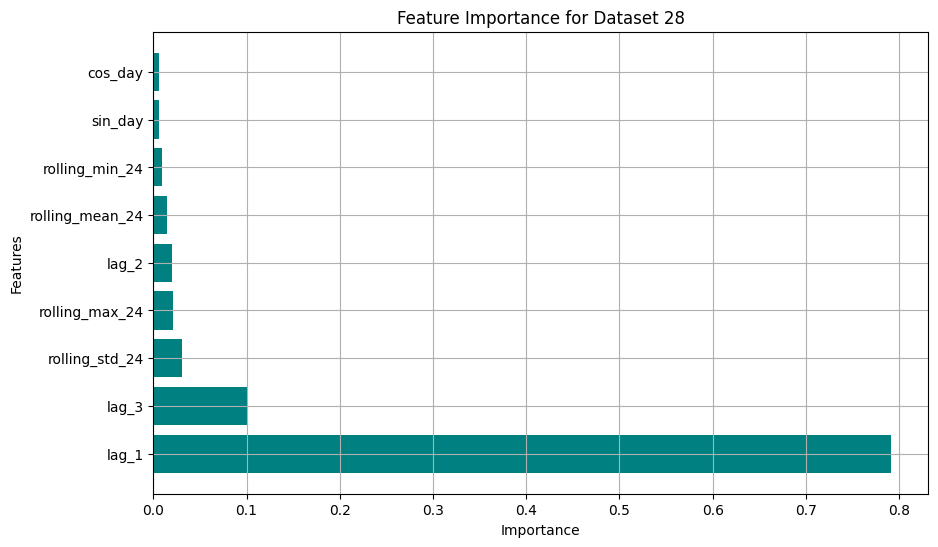

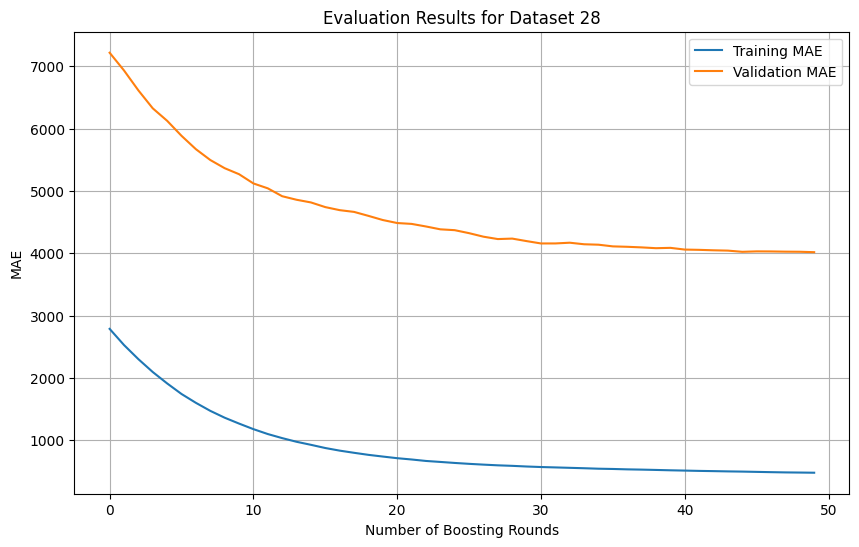

Dataset 28:
 Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0, 'reg_lambda': 1}
 Best k: 2
 Test Set MAE: 4016.9283
 Precision: 0.8989, Recall: 0.9877, F1: 0.9412
--------------------------------------------------


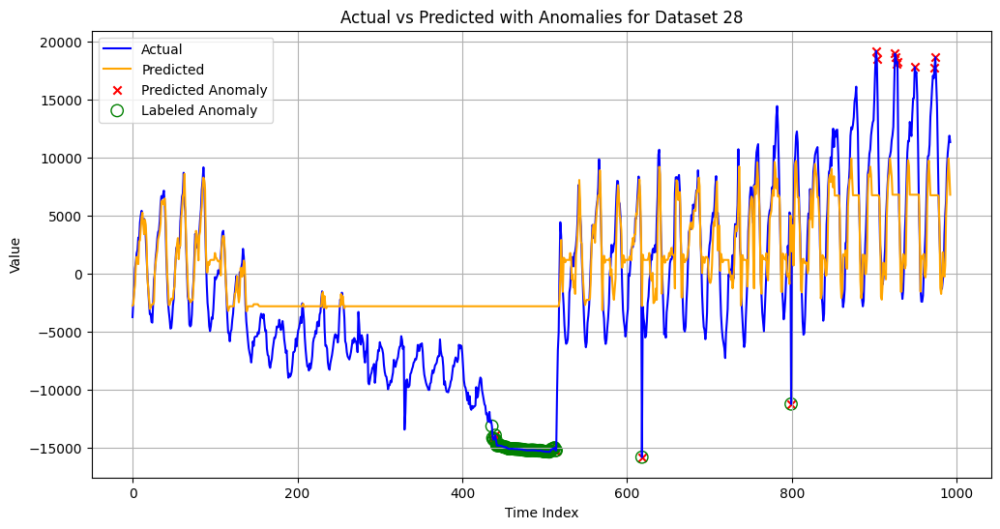

Dataset 28:
 Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0, 'reg_lambda': 1}
 Best k: 3
 Test Set MAE: 4016.9283
 Precision: 0.5500, Recall: 0.1358, F1: 0.2178
--------------------------------------------------


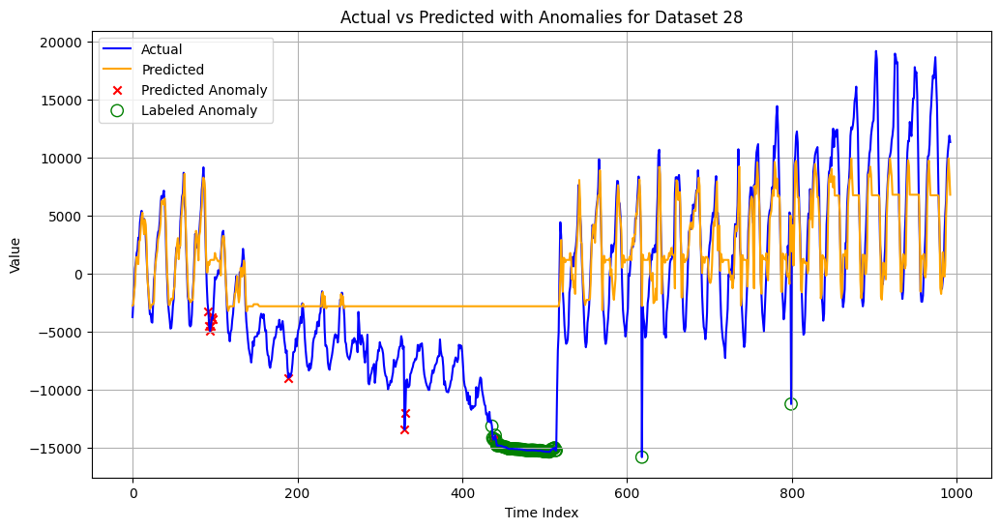

<ipython-input-4-4ae58c95129c>:11: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df.index = pd.date_range(start='2023-01-01', periods=len(df), freq='H')


Feature Importances:
lag_1: 0.5837
rolling_std_24: 0.1158
rolling_max_24: 0.0769
rolling_mean_24: 0.0605
cos_day: 0.0523
lag_2: 0.0412
rolling_min_24: 0.0374
lag_3: 0.0322
sin_day: 0.0000


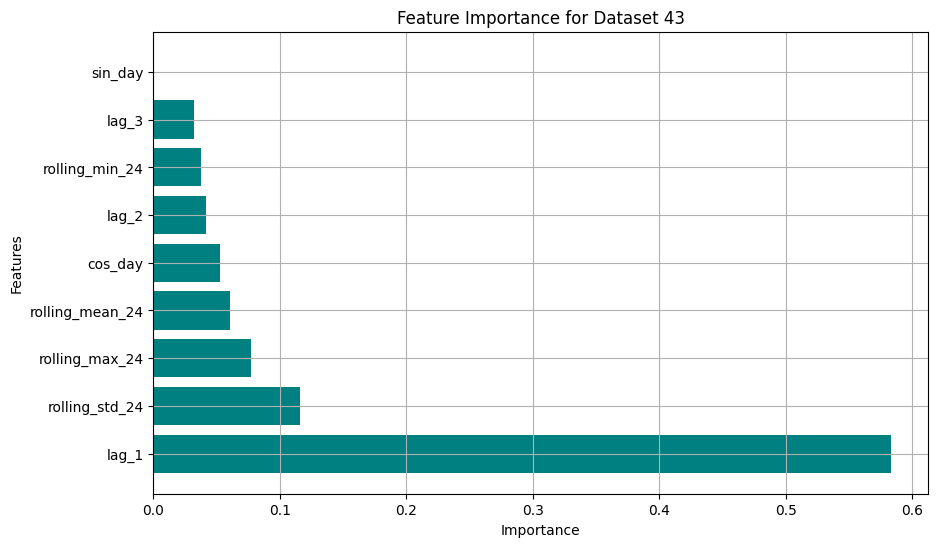

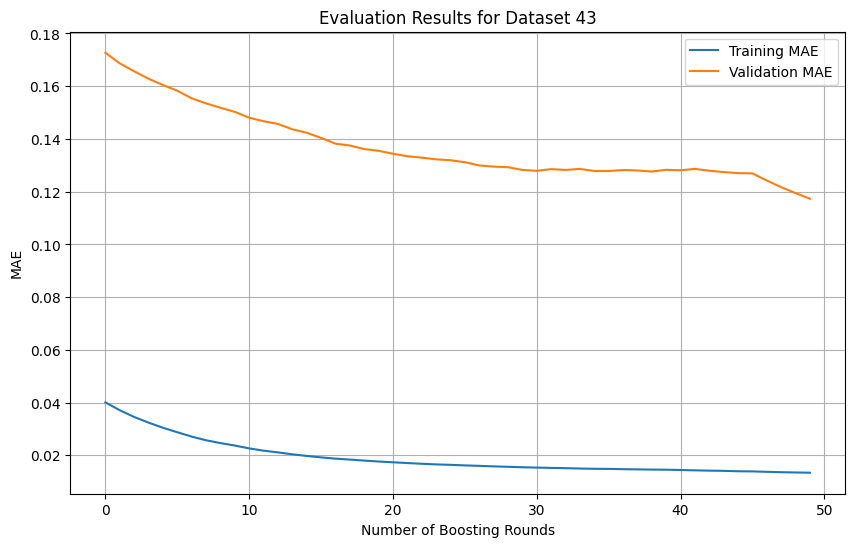

Dataset 43:
 Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0, 'reg_lambda': 1.5}
 Best k: 2.5
 Test Set MAE: 0.1173
 Precision: 1.0000, Recall: 0.1111, F1: 0.2000
--------------------------------------------------


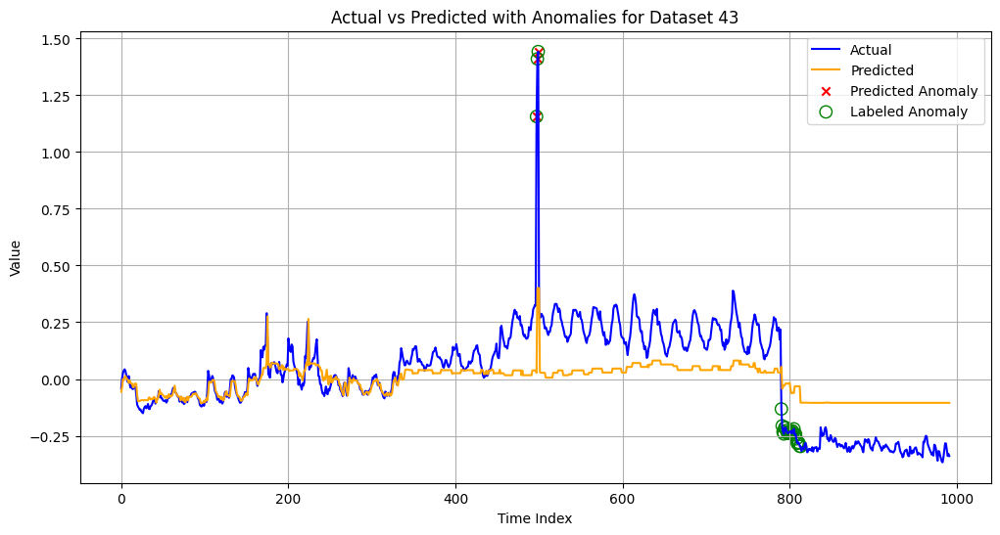

Dataset 43:
 Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0, 'reg_lambda': 1.5}
 Best k: 3
 Test Set MAE: 0.1173
 Precision: 0.0667, Recall: 0.1111, F1: 0.0833
--------------------------------------------------


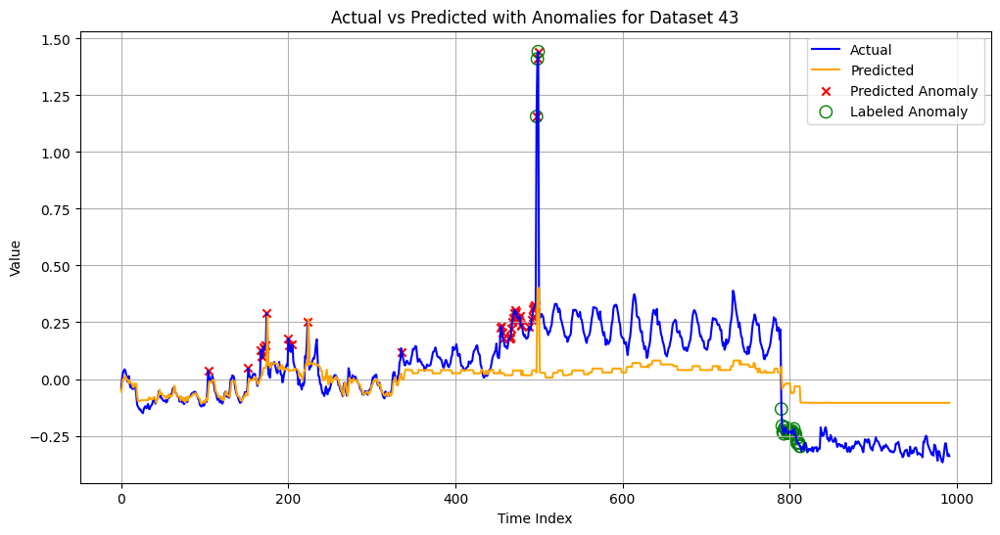

<ipython-input-4-4ae58c95129c>:11: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df.index = pd.date_range(start='2023-01-01', periods=len(df), freq='H')


Feature Importances:
lag_1: 0.7601
lag_3: 0.1080
lag_2: 0.0475
rolling_std_24: 0.0228
rolling_max_24: 0.0221
rolling_mean_24: 0.0208
cos_day: 0.0096
rolling_min_24: 0.0089
sin_day: 0.0000


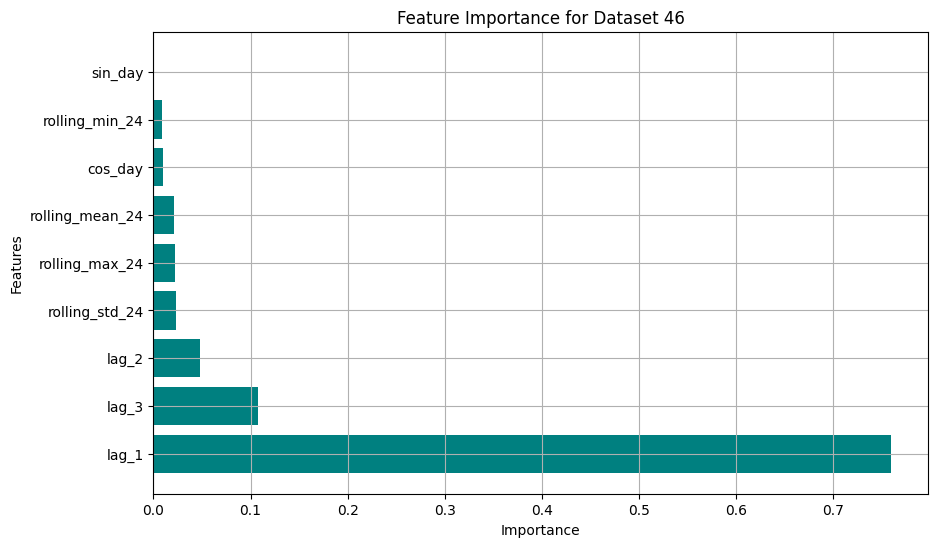

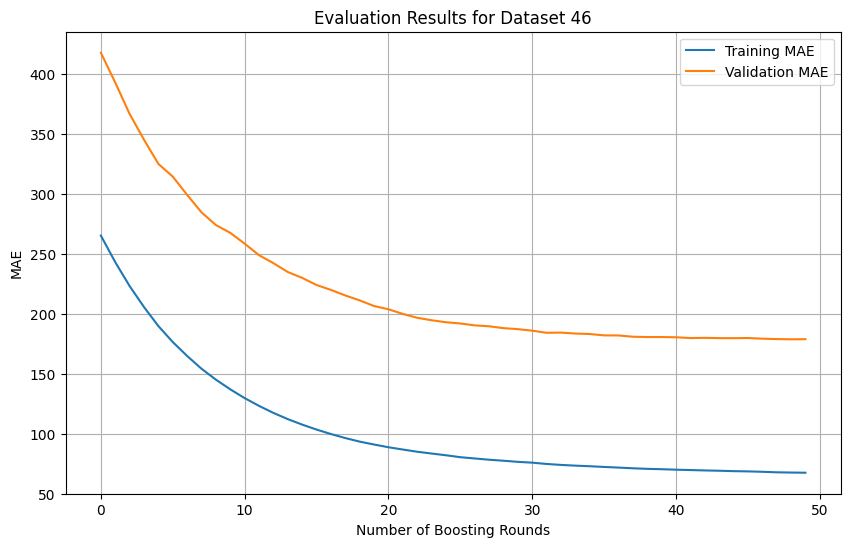

Dataset 46:
 Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0.5, 'reg_lambda': 2}
 Best k: 1.5
 Test Set MAE: 178.8735
 Precision: 0.8583, Recall: 1.0000, F1: 0.9237
--------------------------------------------------


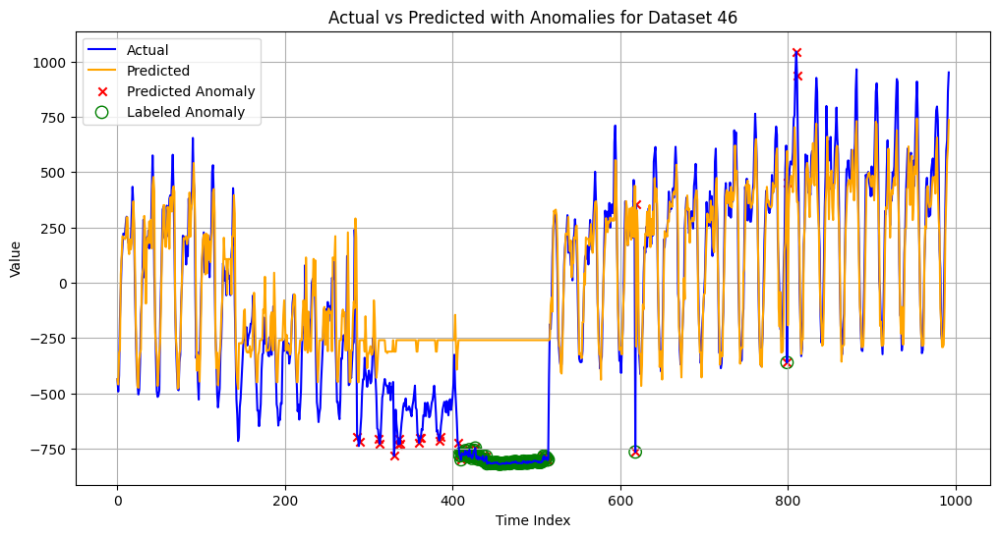

Dataset 46:
 Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0.5, 'reg_lambda': 2}
 Best k: 3
 Test Set MAE: 178.8735
 Precision: 0.1538, Recall: 0.0183, F1: 0.0328
--------------------------------------------------


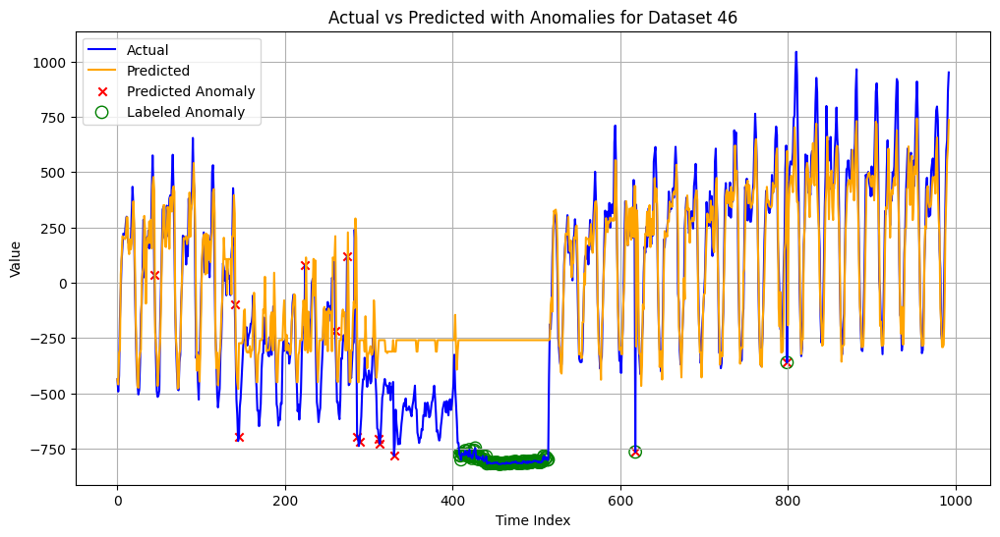

<ipython-input-4-4ae58c95129c>:11: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df.index = pd.date_range(start='2023-01-01', periods=len(df), freq='H')


Feature Importances:
lag_1: 0.8040
lag_3: 0.0515
lag_2: 0.0450
sin_day: 0.0239
rolling_max_24: 0.0225
rolling_min_24: 0.0173
rolling_mean_24: 0.0146
rolling_std_24: 0.0138
cos_day: 0.0075


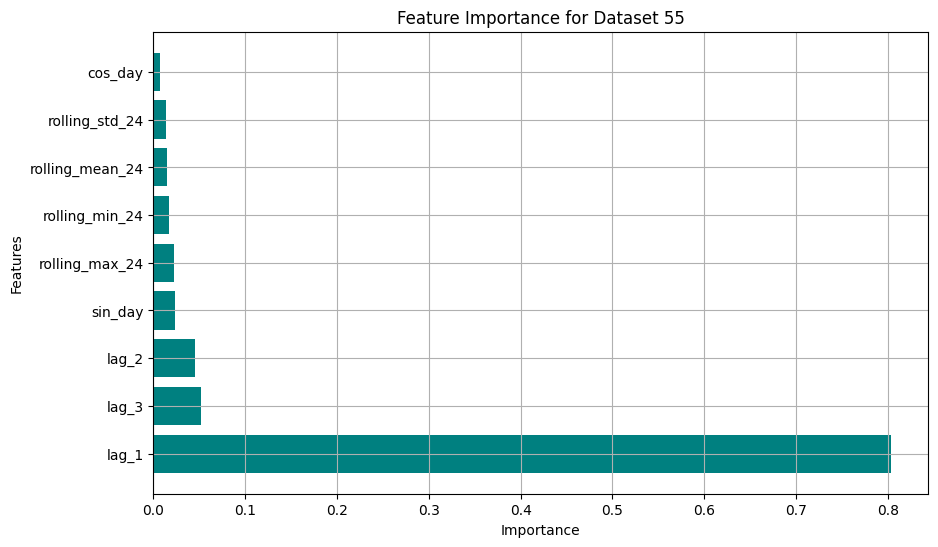

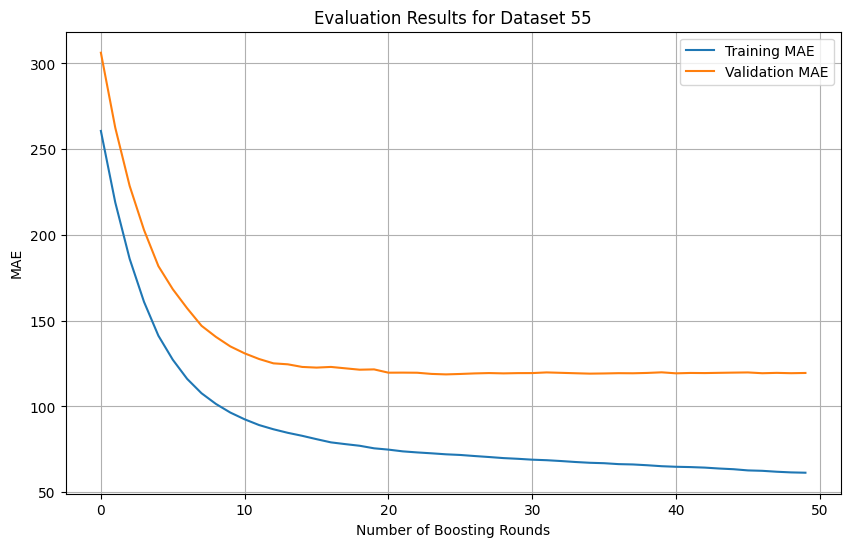

Dataset 55:
 Best Hyperparameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0, 'reg_lambda': 1}
 Best k: 3
 Test Set MAE: 119.5404
 Precision: 0.3000, Recall: 0.6000, F1: 0.4000
--------------------------------------------------


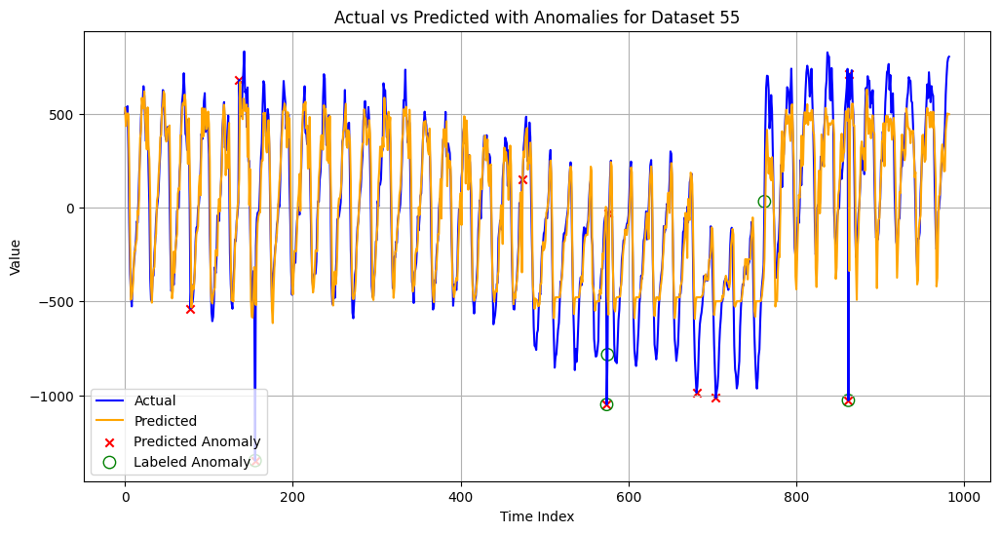

Dataset 55:
 Best Hyperparameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0, 'reg_lambda': 1}
 Best k: 3
 Test Set MAE: 119.5404
 Precision: 0.1579, Recall: 0.6000, F1: 0.2500
--------------------------------------------------


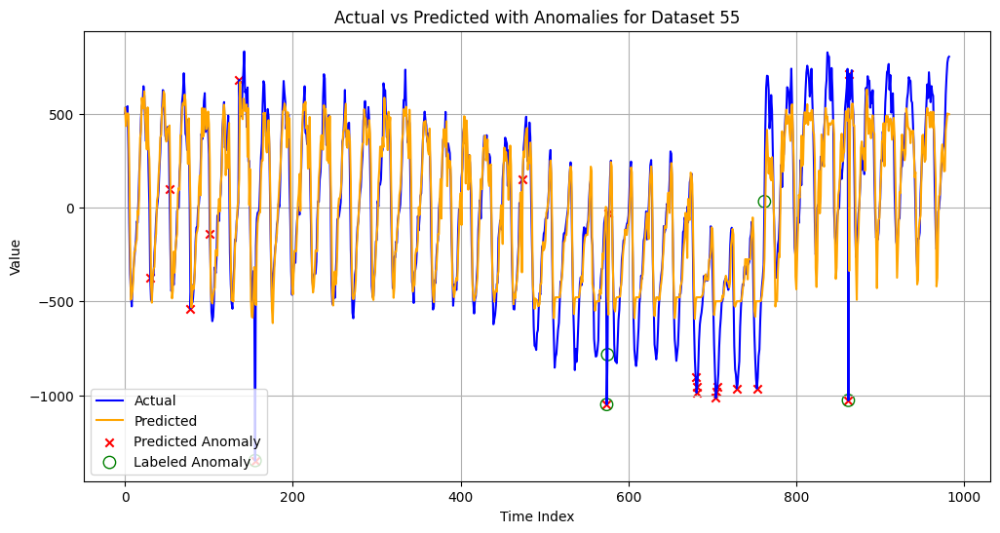

<ipython-input-4-4ae58c95129c>:11: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df.index = pd.date_range(start='2023-01-01', periods=len(df), freq='H')


Feature Importances:
lag_1: 0.7045
lag_2: 0.0921
lag_3: 0.0571
rolling_min_24: 0.0354
rolling_max_24: 0.0341
rolling_mean_24: 0.0271
rolling_std_24: 0.0224
cos_day: 0.0151
sin_day: 0.0120


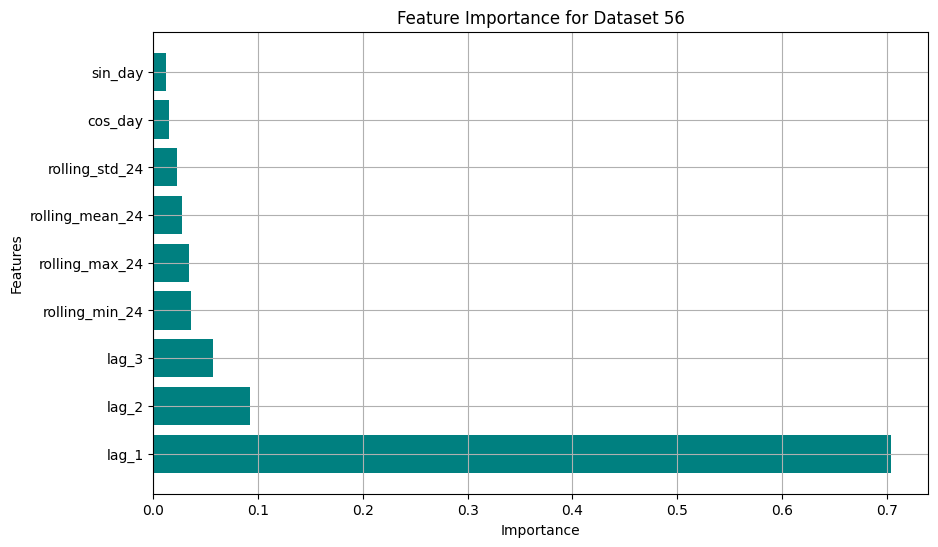

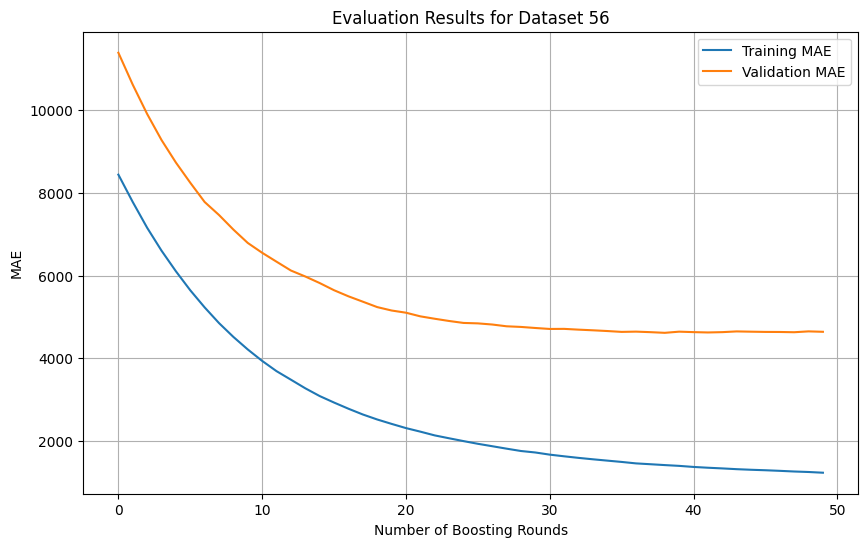

Dataset 56:
 Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 50, 'reg_alpha': 0, 'reg_lambda': 1.5}
 Best k: 3
 Test Set MAE: 4640.8365
 Precision: 0.1875, Recall: 0.6000, F1: 0.2857
--------------------------------------------------


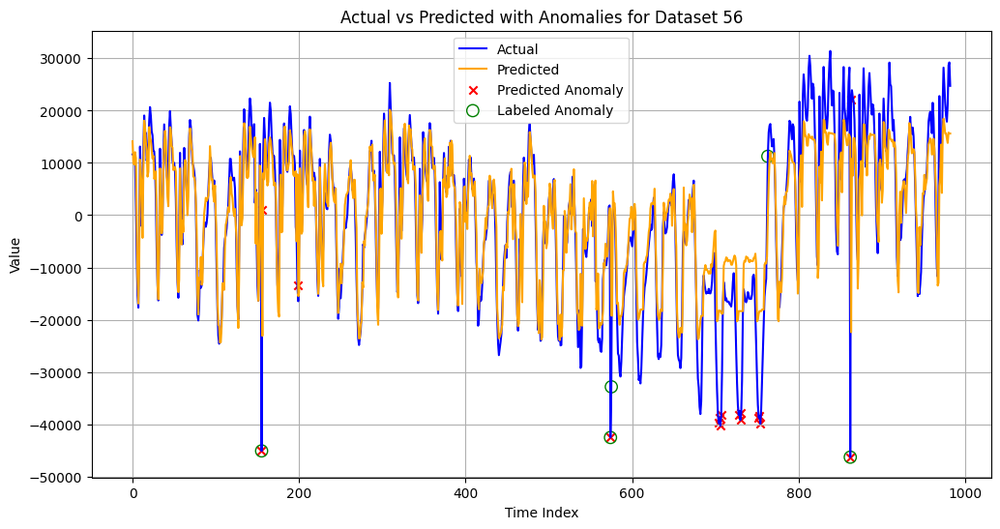

Dataset 56:
 Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 50, 'reg_alpha': 0, 'reg_lambda': 1.5}
 Best k: 3
 Test Set MAE: 4640.8365
 Precision: 0.1000, Recall: 0.6000, F1: 0.1714
--------------------------------------------------


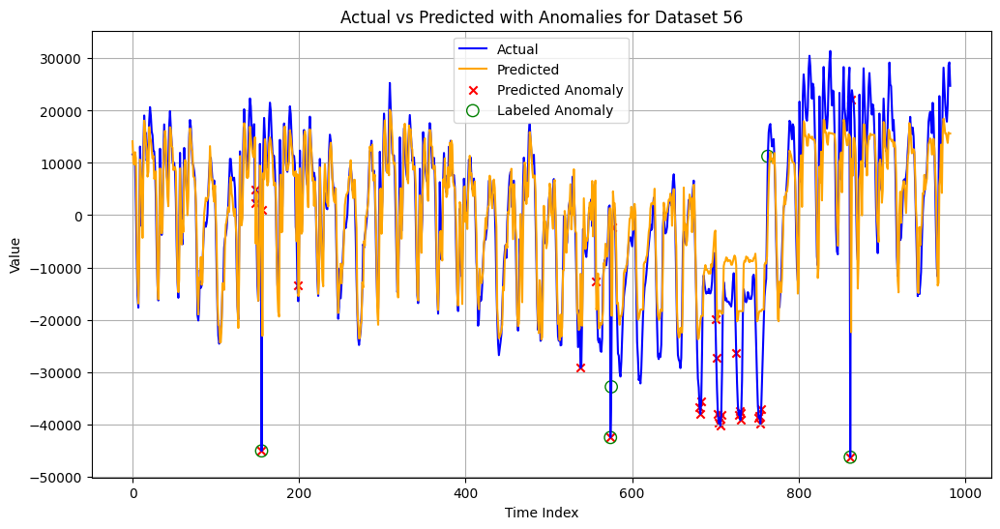

<ipython-input-4-4ae58c95129c>:11: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df.index = pd.date_range(start='2023-01-01', periods=len(df), freq='H')


Feature Importances:
lag_1: 0.7891
sin_day: 0.0821
lag_3: 0.0498
rolling_mean_24: 0.0200
lag_2: 0.0181
rolling_min_24: 0.0132
rolling_std_24: 0.0109
rolling_max_24: 0.0108
cos_day: 0.0059


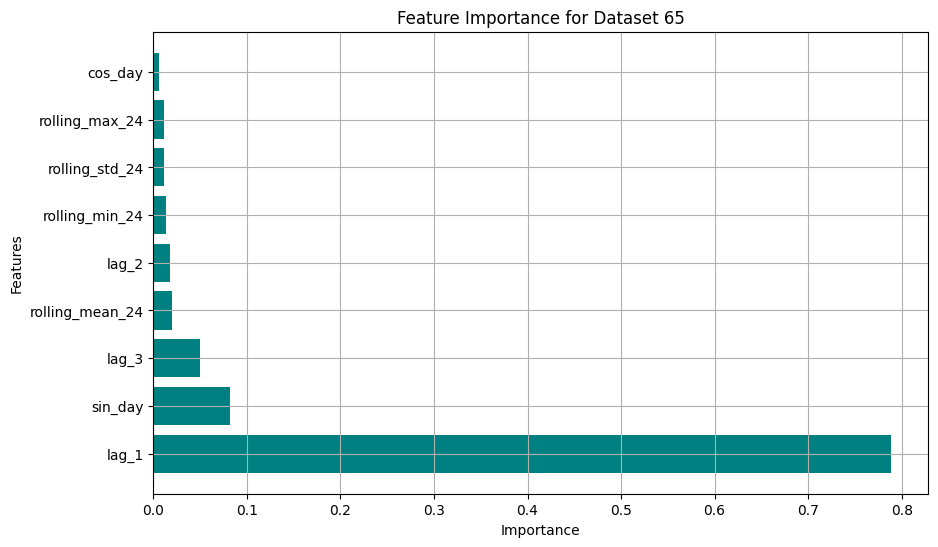

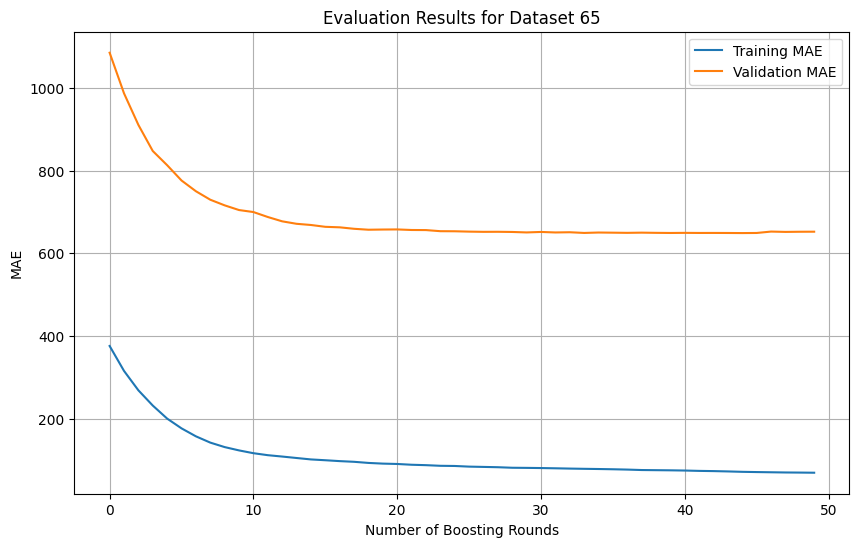

Dataset 65:
 Best Hyperparameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0, 'reg_lambda': 1}
 Best k: 2
 Test Set MAE: 652.3063
 Precision: 0.3889, Recall: 0.4118, F1: 0.4000
--------------------------------------------------


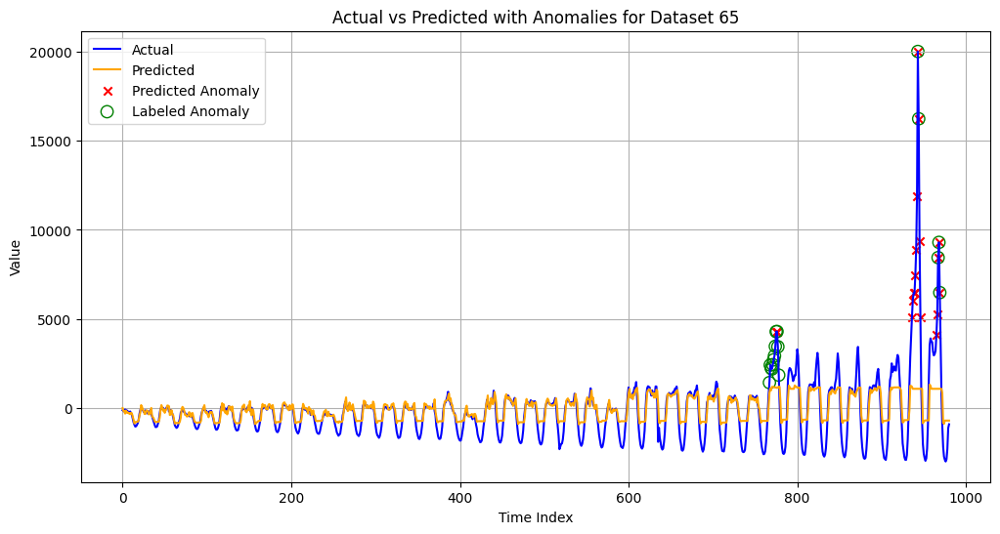

Dataset 65:
 Best Hyperparameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 50, 'reg_alpha': 0, 'reg_lambda': 1}
 Best k: 3
 Test Set MAE: 652.3063
 Precision: 0.0870, Recall: 0.4706, F1: 0.1468
--------------------------------------------------


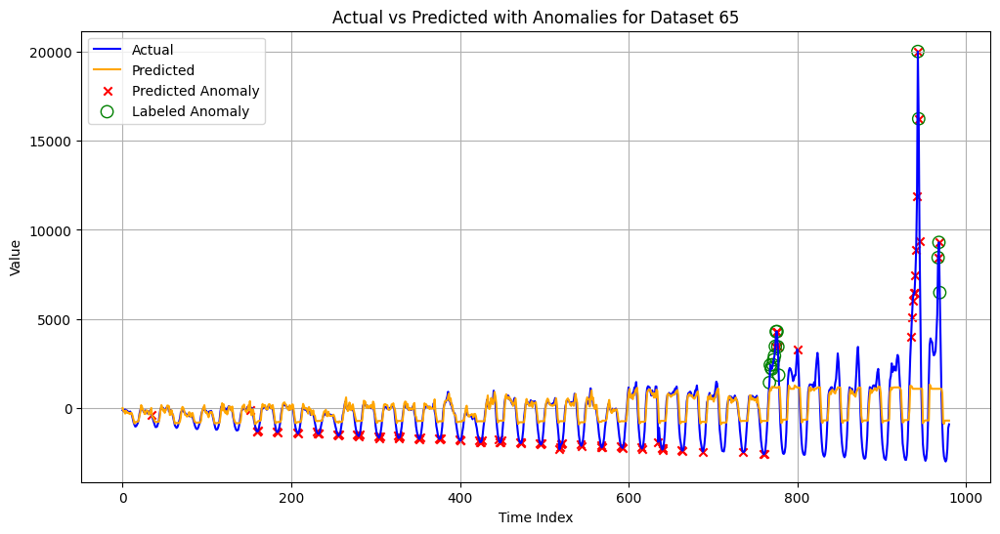


=== Average Best Metrics Across All Datasets ===
Average Precision SW = 0.61
Average Recall SW   = 0.62
Average F1-Score SW = 0.53
All F1 Scores SW: ['0.9412', '0.2000', '0.9237', '0.4000', '0.2857', '0.4000']

=== Average Best Metrics Across All Datasets ===
Average Precision DW = 0.19
Average Recall DW   = 0.32
Average F1-Score DW = 0.15
All F1 Scores DW: ['0.2178', '0.0833', '0.0328', '0.2500', '0.1714', '0.1468']


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, precision_score, recall_score, f1_score
from sklearn.model_selection import TimeSeriesSplit
import xgboost as xgb


A1D = [28,43,46,55,56,65]


# Hyperparameters for XGBoost
param_grid = {
    'n_estimators': [50],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'reg_alpha': [0, 0.1, 0.5],
    'reg_lambda': [1, 1.5, 2]
}

tscv = TimeSeriesSplit(n_splits=2)  # For time-series cross-validation

all_best_precisions_dw = []
all_best_recalls_dw = []
all_best_f1_scores_dw = []
all_best_precisions_sw = []
all_best_recalls_sw = []
all_best_f1_scores_sw = []


possible_ks = [1.5, 2, 2.5, 3]  # Διάφορες τιμές k για δοκιμή
possible_windows = [100, 200, 300, 500]  # Διάφορες τιμές rolling window

for i in A1D:
    df = dfsA1[i].copy()
    value_col = f"value_{i}"

    df[value_col] = detrend_series(df[value_col].values, method='linear')

    # Ensure the dataframe has 'label' and value_col
    if value_col not in df.columns or "label" not in df.columns:
        print(f"Dataset {i} does not have the required columns.")
        continue

    # Apply feature engineering
    df = feature_engineering(df, value_col, window_size=24)

    # Prepare the data
    features = [col for col in df.columns if col != 'label' and col != value_col]
    X = df[features].values
    y = df[value_col].values
    labels = df["label"].values  # Ground truth anomaly labels

    # Split data into train and test sets
    X_train, X_test, y_train, y_test, label_train, label_test = train_test_split(
        X, y, labels, test_size=0.7, shuffle=False
    )

    # Scale the features
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    # Define the XGBoost model
    model = XGBRegressor(random_state=42, eval_metric="mae")

    # Perform grid search
    grid_search = GridSearchCV(
        estimator=model,
        param_grid=param_grid,
        scoring='neg_mean_absolute_error',
        cv = tscv,
        n_jobs=-1,
        return_train_score=True
    )
    grid_search.fit(
    X_train,
    y_train,
    eval_set=[(X_train, y_train), (X_test, y_test)],
    verbose=False
    )

#=================================================================================================================
# FEATURE IMPORTANCE
#=================================================================================================================

    # Retrieve the best model
    best_model = grid_search.best_estimator_

    # Extract evaluation results
    evals_result = best_model.evals_result()

    # Extract MAE for training and validation
    train_mae = evals_result["validation_0"]["mae"]  # Training MAE
    test_mae = evals_result["validation_1"]["mae"]   # Validation MAE

    # Predict on test set
    y_pred = best_model.predict(X_test)

    # Compute residuals
    residuals = np.abs(y_test - y_pred)

    # Feature Importance
    feature_importances = best_model.feature_importances_
    sorted_indices = np.argsort(feature_importances)[::-1]
    print("Feature Importances:")
    for idx in sorted_indices:
        print(f"{features[idx]}: {feature_importances[idx]:.4f}")

    # Plot feature importance
    plt.figure(figsize=(10, 6))
    plt.barh([features[idx] for idx in sorted_indices], feature_importances[sorted_indices], color='teal')
    plt.title(f"Feature Importance for Dataset {i}")
    plt.xlabel("Importance")
    plt.ylabel("Features")
    plt.grid()
    plt.show()

#=================================================================================================================
# TRUE AND PREDICTED AND LOSSES PLOTS
#=================================================================================================================

    # Plot the evaluation results
    plt.figure(figsize=(10, 6))
    plt.plot(train_mae, label="Training MAE")
    plt.plot(test_mae, label="Validation MAE")
    plt.xlabel("Number of Boosting Rounds")
    plt.ylabel("MAE")
    plt.title(f"Evaluation Results for Dataset {i}")
    plt.legend()
    plt.grid(True)
    plt.show()

#=================================================================================================================
# STATIC WINDOW
#=================================================================================================================

    # Optimize k for the static threshold
    best_f1_sw = -1
    best_k_sw = None
    best_precision_sw = 0
    best_recall_sw = 0
    best_predicted_anomalies_sw = None

    for k_sw in possible_ks:
        threshold_sw = np.mean(residuals) + k_sw * np.std(residuals)
        predicted_anomalies_sw = (residuals > threshold_sw).astype(int)

        precision_sw = precision_score(label_test, predicted_anomalies_sw, zero_division=0)
        recall_sw = recall_score(label_test, predicted_anomalies_sw, zero_division=0)
        f1_sw = f1_score(label_test, predicted_anomalies_sw, zero_division=0)

        if f1_sw > best_f1_sw:
            best_f1_sw = f1_sw
            best_k_sw = k_sw
            best_precision_sw = precision_sw
            best_recall_sw = recall_sw
            best_predicted_anomalies_sw = predicted_anomalies_sw

    all_best_precisions_sw.append(best_precision_sw)
    all_best_recalls_sw.append(best_recall_sw)
    all_best_f1_scores_sw.append(best_f1_sw)

    # Print metrics
    print(f"Dataset {i}:")
    print(f" Best Hyperparameters: {grid_search.best_params_}")
    print(f" Best k: {best_k_sw}")
    print(f" Test Set MAE: {mean_absolute_error(y_test, y_pred):.4f}")
    print(f" Precision: {best_precision_sw:.4f}, Recall: {best_recall_sw:.4f}, F1: {best_f1_sw:.4f}")
    print("-" * 50)

    # Plot actual vs predicted and highlight anomalies
    fig, ax = plt.subplots(figsize=(12, 6))

    # Plot actual and predicted values over time
    ax.plot(range(len(y_test)), y_test, label='Actual', color='blue')
    ax.plot(range(len(y_test)), y_pred, label='Predicted', color='orange')

    # Highlight predicted anomalies (red)
    pred_anomaly_indices = np.where(best_predicted_anomalies_sw == 1)[0]
    ax.scatter(pred_anomaly_indices, y_test[pred_anomaly_indices], color='red', label='Predicted Anomaly', marker='x')

    # Highlight actual labeled anomalies (green)
    actual_anomaly_indices = np.where(label_test == 1)[0]
    ax.scatter(actual_anomaly_indices, y_test[actual_anomaly_indices], color='green', label='Labeled Anomaly', marker='o', facecolors='none', s=80)

    ax.set_title(f"Actual vs Predicted with Anomalies for Dataset {i}")
    ax.set_xlabel("Time Index")
    ax.set_ylabel("Value")
    ax.legend()
    ax.grid(True)
    plt.show()

#=================================================================================================================
# DYNAMIC WINDOW
#=================================================================================================================

    best_f1__dw = -1
    best_k_dw = None
    best_window_dw = None
    best_precision_dw = 0.0
    best_recall_dw = 0.0
    best_predicted_anomalies_dw = None

    for window_dw in possible_windows:
        # Υπολογισμός κυλιόμενων στατιστικών για το “dynamic threshold”
        rolling_residuals_dw = pd.Series(residuals).rolling(window=window_dw, min_periods=1)
        mean_residuals_dw = rolling_residuals_dw.mean()
        std_residuals_dw = rolling_residuals_dw.std()

        for k_dw in possible_ks:
            # Ορισμός ορίου: mean + k * std
            threshold_dw = mean_residuals_dw + k_dw * std_residuals_dw
            predicted_anomalies_dw = (residuals.flatten() > threshold_dw).astype(int)

            precision_k_dw = precision_score(label_test, predicted_anomalies_dw)
            recall_k_dw = recall_score(label_test, predicted_anomalies_dw)
            f1_k_dw = f1_score(label_test, predicted_anomalies_dw)

            if f1_k_dw > best_f1__dw:
                best_f1_dw = f1_k_dw
                best_k_dw = k_dw
                best_window_dw = window_dw
                best_precision_dw = precision_k_dw
                best_recall_dw = recall_k_dw
                best_predicted_anomalies_dw = predicted_anomalies_dw

    # Αποθήκευση καλύτερων τιμών για το συγκεκριμένο dataset
    all_best_precisions_dw.append(best_precision_dw)
    all_best_recalls_dw.append(best_recall_dw)
    all_best_f1_scores_dw.append(best_f1_dw)

    # Print metrics
    print(f"Dataset {i}:")
    print(f" Best Hyperparameters: {grid_search.best_params_}")
    print(f" Best k: {best_k_dw}")
    print(f" Test Set MAE: {mean_absolute_error(y_test, y_pred):.4f}")
    print(f" Precision: {best_precision_dw:.4f}, Recall: {best_recall_dw:.4f}, F1: {best_f1_dw:.4f}")
    print("-" * 50)

    # Plot actual vs predicted and highlight anomalies
    fig, ax = plt.subplots(figsize=(12, 6))

    # Plot actual and predicted values over time
    ax.plot(range(len(y_test)), y_test, label='Actual', color='blue')
    ax.plot(range(len(y_test)), y_pred, label='Predicted', color='orange')

    # Highlight predicted anomalies (red)
    pred_anomaly_indices = np.where(best_predicted_anomalies_dw == 1)[0]
    ax.scatter(pred_anomaly_indices, y_test[pred_anomaly_indices], color='red', label='Predicted Anomaly', marker='x')

    # Highlight actual labeled anomalies (green)
    actual_anomaly_indices = np.where(label_test == 1)[0]
    ax.scatter(actual_anomaly_indices, y_test[actual_anomaly_indices], color='green', label='Labeled Anomaly', marker='o', facecolors='none', s=80)

    ax.set_title(f"Actual vs Predicted with Anomalies for Dataset {i}")
    ax.set_xlabel("Time Index")
    ax.set_ylabel("Value")
    ax.legend()
    ax.grid(True)
    plt.show()

#=================================================================================================================
# AVERAGE SCORES
#=================================================================================================================

average_precision_sw = np.mean(all_best_precisions_sw)
average_recall_sw = np.mean(all_best_recalls_sw)
average_f1_score_sw = np.mean(all_best_f1_scores_sw)

print("\n=== Average Best Metrics Across All Datasets ===")
print(f"Average Precision SW = {average_precision_sw:.2f}")
print(f"Average Recall SW   = {average_recall_sw:.2f}")
print(f"Average F1-Score SW = {average_f1_score_sw:.2f}")
formatted_scores_sw = [f"{score:.4f}" for score in all_best_f1_scores_sw]
print(f"All F1 Scores SW: {formatted_scores_sw}")


average_precision_dw = np.mean(all_best_precisions_dw)
average_recall_dw = np.mean(all_best_recalls_dw)
average_f1_score_dw = np.mean(all_best_f1_scores_dw)

print("\n=== Average Best Metrics Across All Datasets ===")
print(f"Average Precision DW = {average_precision_dw:.2f}")
print(f"Average Recall DW   = {average_recall_dw:.2f}")
print(f"Average F1-Score DW = {average_f1_score_dw:.2f}")
formatted_scores_dw = [f"{score:.4f}" for score in all_best_f1_scores_dw]
print(f"All F1 Scores DW: {formatted_scores_dw}")


## NAB

In [ ]:
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=pd.errors.SettingWithCopyWarning)


data = {}
path = '/content/drive/My Drive/NAB/data'

def addFolderAndReadAll(f_name):
    data[f_name] = {}
    csvs = os.listdir(path + '/' + f_name)
    csvs_num = 0
    for csv in csvs:
        data[f_name][csv] = pd.read_csv(path + '/' + f_name + '/' + csv)
        csvs_num += 1
    return csvs_num

csvs_num = sum([addFolderAndReadAll(f_name) for f_name in os.listdir(path)])

with open('/content/drive//My Drive/NAB/labels/combined_windows.json', 'r') as file:
    labels = json.load(file)

for key1 in data:
    for key2 in data[key1]:
        one_csv_labels = labels[key1+'/'+key2]
        data[key1][key2]['label'] = np.array(0)
        num = 0
        for interval in one_csv_labels:
            #print(key2, interval, num)
            index1 = list(data[key1][key2]['timestamp']).index(interval[0][:19])
            index2 = list(data[key1][key2]['timestamp']).index(interval[1][:19])
            data[key1][key2]['label'][num] = slice(index1, index2)
            #data[key1][key2]['label'] = data[key1][key2]['label'].apply(lambda x: 1 if isinstance(x, slice) else 0)
            num += 1

import os
import pandas as pd
import numpy as np
import json

data = {}
path = '/content/drive/My Drive/NAB/data'

# Load all CSV files into a nested dictionary
def addFolderAndReadAll(f_name):
    data[f_name] = {}
    csvs = os.listdir(path + '/' + f_name)
    csvs_num = 0
    for csv in csvs:
        data[f_name][csv] = pd.read_csv(path + '/' + f_name + '/' + csv)
        csvs_num += 1
    return csvs_num

# Read data from all folders
csvs_num = sum([addFolderAndReadAll(f_name) for f_name in os.listdir(path)])

# Load anomaly intervals from JSON
with open('/content/drive/My Drive/NAB/labels/combined_windows.json', 'r') as file:
    labels = json.load(file)

# Process each CSV and assign binary labels
for key1 in data:
    for key2 in data[key1]:
        one_csv_labels = labels[key1 + '/' + key2]
        df = data[key1][key2]
        df['label'] = 0  # Initialize label column with 0

        # Mark intervals as anomalies
        for interval in one_csv_labels:
            index1 = list(df['timestamp']).index(interval[0][:19])
            index2 = list(df['timestamp']).index(interval[1][:19])
            df.loc[index1:index2, 'label'] = 1  # Set rows within interval to 1

        # Update the DataFrame back into the data dictionary
        data[key1][key2] = df

# All `data` dictionaries now have binary labels.

In [ ]:
import math

def sigmoid(x):
    """Standard sigmoid function."""
    return 1 / (1 + math.exp(-x))

def sigmoid_score(t, A_tp, A_fp):
    """
    Calculate the scaled sigmoid score for a detection.
    @param t: Relative position of the detection:
              - t = -1 is far left of the window, t = 0 is the right edge.
              - t > 0 considers detections outside the window.
    @param A_tp: Reward for true positives.
    @param A_fp: Penalty for false positives.
    """
    if t > 3.0:
        return -1.0  # Assign -1 for detections too far after the window
    elif 0 < t <= 3.0:
        return  2* (1 / (1 + math.exp(5 * t))) - 1.0  # Sigmoid scaling
    else:
        return  2* (1 / (1 + math.exp(5 * t))) - 1.0  # Normal sigmoid for in-window cases

def compute_raw_score_debug(detections, anomaly_windows, A_tp, A_fp, A_fn):
    """
    Compute the raw NAB score for a dataset with detailed debugging.
    Also computes S_perfect and S_null for comparison.
    @param detections: List of detected anomaly timestamps.
    @param anomaly_windows: List of anomaly windows (start_time, end_time).
    @param A_tp: Reward for true positives.
    @param A_fp: Penalty for false positives.
    @param A_fn: Penalty for missed anomaly windows (false negatives).

    @return: Raw NAB score, S_perfect, S_null.
    """
    score = 0
    missed_windows = 0


    # Sort detections and anomaly windows
    detections = sorted(detections)
    anomaly_windows = sorted(anomaly_windows, key=lambda x: x[0])

    # Compute the actual score
    for i, window in enumerate(anomaly_windows):
        start_time, end_time = window
        window_length = end_time - start_time

        # Find detections within or after the current window
        detections_in_window = [d for d in detections if d >= start_time]

        if detections_in_window and start_time <= detections_in_window[0] <= end_time:
            # Detection within the window
            first_detection = detections_in_window[0]
            t = -3 + 2 * (first_detection - start_time) / window_length
            contribution = sigmoid_score(t, A_tp, A_fp)
            print(f"Window {i}: {window}, Detection t={t:.3f} at {first_detection}, Contribution={contribution:.3f}")
            score += contribution
            # Remove the detection
            detections.remove(first_detection)
            detections_in_window = [d for d in detections if start_time <= d <= end_time]
            for d in detections_in_window:
                detections.remove(d)


        elif detections_in_window:
            # Check all detections just outside the current window
            near_miss_detections = [d for d in detections_in_window if 0 < (d - end_time) <= 3.0]

            for near_detection in near_miss_detections:
                t = (near_detection - end_time)  # Relative position after the window
                contribution = sigmoid_score(t, A_tp, A_fp)
                print(f"Window {i}: {window}, Near-miss detection t={t:.3f}, Contribution={contribution:.3f}")
                score += contribution
                # Remove the detection after scoring it
                detections.remove(near_detection)
        else:
            # No detections in this window - count as a false negative
            print(f"Window {i}: {window}, Missed anomaly window. Penalty={A_fn:.3f}")
            score += A_fn
            missed_windows += 1

    # Handle remaining detections as false positives or outside windows
    for detection in detections:
        # Check if detection is close to the end of any window
        near_miss_found = False
        for window in anomaly_windows:
            _, end_time = window
            if 0 < (detection - end_time) <= 3.0:
                t = (detection - end_time)
                contribution = sigmoid_score(t, A_tp, A_fp)
                print(f"Detection {detection} near-miss outside any window. t={t:.3f}, Contribution={contribution:.3f}")
                score += contribution
                near_miss_found = True
                break

        if not near_miss_found:
            # Treat as a false positive
            contribution = sigmoid_score(3.0, A_tp, A_fp)  # Use t=3.0 for far detections
            print(f"False positive detection at {detection}, Contribution={contribution:.3f}")
            score += contribution

    print(f"Raw score for dataset: {score:.3f}")

    return score

In [ ]:
def create_anomaly_windows(binary_labels):
    """
    Generate an array of anomaly windows (start, end) tuples from binary labels.

    @param binary_labels: List or array of binary labels (0s and 1s).
                          1 indicates an anomaly, 0 indicates normal.

    @return: List of tuples where each tuple is (start_index, end_index) for an anomaly window.
    """
    anomaly_windows = []
    in_window = False
    start_index = None

    for i, label in enumerate(binary_labels):
        if label == 1 and not in_window:
            # Start of a new anomaly window
            start_index = i
            in_window = True
        elif label == 0 and in_window:
            # End of the current anomaly window
            end_index = i - 1
            anomaly_windows.append((start_index, end_index))
            in_window = False

    # If the last label is part of an anomaly window, close it
    if in_window:
        anomaly_windows.append((start_index, len(binary_labels) - 1))

    return anomaly_windows


In [ ]:
anomaly_windows = {}
binary_labels = data["realKnownCause"]["nyc_taxi.csv"]["label"]
# Generate the anomaly windows for the current labels
anomaly_windows["nyc_taxi.csv"] = create_anomaly_windows(binary_labels)

Feature Importances:
lag_1: 0.9324
rolling_min_24: 0.0320
lag_3: 0.0119
lag_2: 0.0066
rolling_mean_24: 0.0058
rolling_max_24: 0.0051
rolling_std_24: 0.0034
sin_day: 0.0015
cos_day: 0.0013


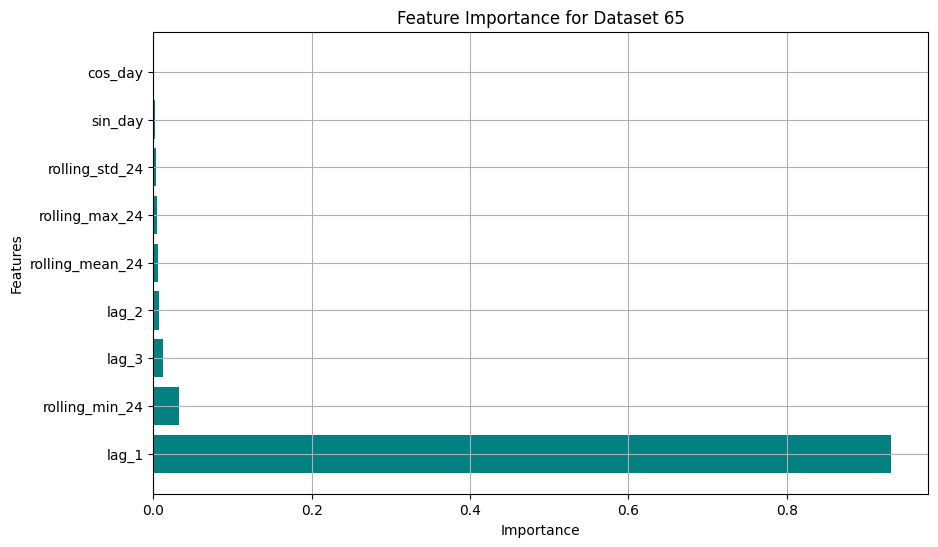

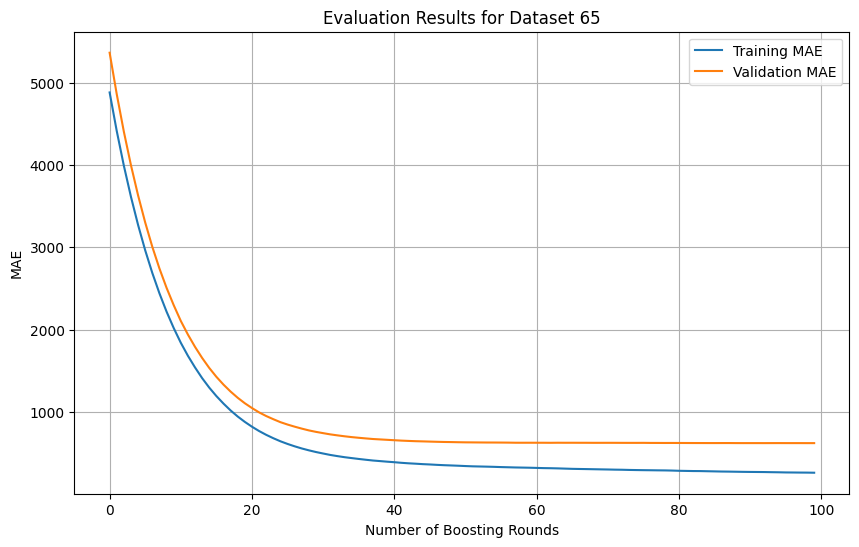

Window 0: (5839, 6045), Detection t=-2.447 at 5896, Contribution=1.000
Window 1: (7080, 7286), Detection t=-1.728 at 7211, Contribution=1.000
Window 2: (8423, 8629), Detection t=-2.845 at 8439, Contribution=1.000
Window 3: (8731, 8937), Detection t=-2.845 at 8747, Contribution=1.000
Window 4: (9977, 10183), Detection t=-2.408 at 10038, Contribution=1.000
False positive detection at 4153, Contribution=-1.000
False positive detection at 4235, Contribution=-1.000
False positive detection at 4258, Contribution=-1.000
False positive detection at 4527, Contribution=-1.000
False positive detection at 4728, Contribution=-1.000
False positive detection at 4930, Contribution=-1.000
False positive detection at 5107, Contribution=-1.000
False positive detection at 5110, Contribution=-1.000
False positive detection at 5111, Contribution=-1.000
False positive detection at 5161, Contribution=-1.000
False positive detection at 5266, Contribution=-1.000
False positive detection at 5602, Contribution=-1

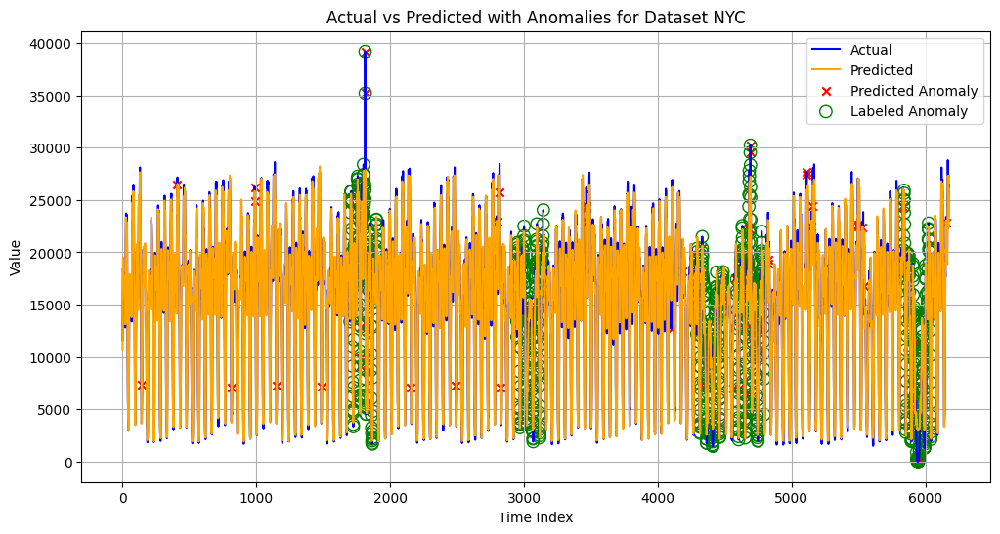

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, precision_score, recall_score, f1_score



# Hyperparameters for XGBoost
param_grid = {
    'n_estimators': [50,100,200],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'reg_alpha': [0, 0.1, 0.5],
    'reg_lambda': [1, 1.5, 2]
}

tscv = TimeSeriesSplit(n_splits=2)  # For time-series cross-validation

df = data["realKnownCause"]["nyc_taxi.csv"].copy()
value_col = f"value"

df = df.drop(columns=['timestamp'])

# Apply feature engineering
df = feature_engineering(df, value_col, window_size=24)

# Prepare the data
features = [col for col in df.columns if col != 'label' and col != value_col]
X = df[features].values
y = df[value_col].values
labels = df["label"].values  # Ground truth anomaly labels

# Split data into train and test sets
X_train, X_test, y_train, y_test, label_train, label_test = train_test_split(
    X, y, labels, test_size=0.6, shuffle=False
)

# Scale the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Define the XGBoost model
model = XGBRegressor(random_state=42, eval_metric="mae")

# Perform grid search
grid_search = GridSearchCV(
    estimator=model,
    param_grid=param_grid,
    scoring='neg_mean_absolute_error',
    cv = tscv,
    n_jobs=-1,
    return_train_score=True
)
grid_search.fit(
X_train,
y_train,
eval_set=[(X_train, y_train), (X_test, y_test)],
verbose=False
)

#=================================================================================================================
# FEATURE IMPORTANCE
#=================================================================================================================

# Retrieve the best model
best_model = grid_search.best_estimator_

# Extract evaluation results
evals_result = best_model.evals_result()

# Extract MAE for training and validation
train_mae = evals_result["validation_0"]["mae"]  # Training MAE
test_mae = evals_result["validation_1"]["mae"]   # Validation MAE

# Predict on test set
y_pred = best_model.predict(X_test)

# Compute residuals
residuals = np.abs(y_test - y_pred)

# Feature Importance
feature_importances = best_model.feature_importances_
sorted_indices = np.argsort(feature_importances)[::-1]
print("Feature Importances:")
for idx in sorted_indices:
    print(f"{features[idx]}: {feature_importances[idx]:.4f}")

# Plot feature importance
plt.figure(figsize=(10, 6))
plt.barh([features[idx] for idx in sorted_indices], feature_importances[sorted_indices], color='teal')
plt.title(f"Feature Importance for Dataset {i}")
plt.xlabel("Importance")
plt.ylabel("Features")
plt.grid()
plt.show()

#=================================================================================================================
# TRUE AND PREDICTED AND LOSSES PLOTS
#=================================================================================================================

# Plot the evaluation results
plt.figure(figsize=(10, 6))
plt.plot(train_mae, label="Training MAE")
plt.plot(test_mae, label="Validation MAE")
plt.xlabel("Number of Boosting Rounds")
plt.ylabel("MAE")
plt.title(f"Evaluation Results for Dataset {i}")
plt.legend()
plt.grid(True)
plt.show()


threshold = np.mean(residuals) + 3 * np.std(residuals)
predicted_anomalies = (residuals > threshold).astype(int)

precision = precision_score(label_test, predicted_anomalies, zero_division=0)
recall = recall_score(label_test, predicted_anomalies, zero_division=0)
f1 = f1_score(label_test, predicted_anomalies, zero_division=0)

# Convert binary predictions to detection timestamps
detections = [i + int(len(X_train)) for i, x in enumerate(predicted_anomalies) if x == 1]

# Compute the NAB score
nab_score = compute_raw_score_debug(detections, anomaly_windows["nyc_taxi.csv"], A_tp = 1.0, A_fp = -0.11, A_fn = -1.0)

# Print metrics
print(f"Dataset NYC:")
print(f" Best Hyperparameters: {grid_search.best_params_}")
print(f" Test Set MAE: {mean_absolute_error(y_test, y_pred):.4f}")
print(f" Precision: {precision:.4f}, Recall: {recall:.4f}, F1: {f1:.4f}, NAB Score: {nab_score}")
print("-" * 50)

# Plot actual vs predicted and highlight anomalies
fig, ax = plt.subplots(figsize=(12, 6))

# Plot actual and predicted values over time
ax.plot(range(len(y_test)), y_test, label='Actual', color='blue')
ax.plot(range(len(y_test)), y_pred, label='Predicted', color='orange')

# Highlight predicted anomalies (red)
pred_anomaly_indices = np.where(predicted_anomalies == 1)[0]
ax.scatter(pred_anomaly_indices, y_test[pred_anomaly_indices], color='red', label='Predicted Anomaly', marker='x')

# Highlight actual labeled anomalies (green)
actual_anomaly_indices = np.where(label_test == 1)[0]
ax.scatter(actual_anomaly_indices, y_test[actual_anomaly_indices], color='green', label='Labeled Anomaly', marker='o', facecolors='none', s=80)

ax.set_title(f"Actual vs Predicted with Anomalies for Dataset NYC")
ax.set_xlabel("Time Index")
ax.set_ylabel("Value")
ax.legend()
ax.grid(True)
plt.show()

